In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.exceptions import ConvergenceWarning
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, RobustScaler
from sklearn.metrics import mean_squared_error, f1_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.impute import SimpleImputer, KNNImputer
import missingno as msno
from sklearn.model_selection import GridSearchCV, cross_validate, RandomizedSearchCV, validation_curve

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore")

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [4]:
train = pd.read_csv("C:/Users/koray/PycharmProjects/pythonProject/DATA SETS/train.csv")
test = pd.read_csv("C:/Users/koray/PycharmProjects/pythonProject/DATA SETS/test.csv")

In [5]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.000,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,468.000,LwQ,144.000,270.000,882.000,GasA,TA,Y,SBrkr,896,0,0,896,0.000,0.000,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.000,Unf,1.000,730.000,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.000,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.000,TA,TA,CBlock,TA,TA,No,ALQ,923.000,Unf,0.000,406.000,1329.000,GasA,TA,Y,SBrkr,1329,0,0,1329,0.000,0.000,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.000,Unf,1.000,312.000,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.000,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,PConc,Gd,TA,No,GLQ,791.000,Unf,0.000,137.000,928.000,GasA,Gd,Y,SBrkr,928,701,0,1629,0.000,0.000,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.000,Fin,2.000,482.000,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.000,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.000,TA,TA,PConc,TA,TA,No,GLQ,602.000,Unf,0.000,324.000,926.000,GasA,Ex,Y,SBrkr,926,678,0,1604,0.000,0.000,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.000,Fin,2.000,470.000,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.000,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.000,Gd,TA,PConc,Gd,TA,No,ALQ,263.000,Unf,0.000,1017.000,1280.000,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.000,0.000,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.000,RFn,2.000,506.000,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [7]:
df = pd.concat([train, test]).reset_index(drop=True)

In [8]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856,854,0,1710,1.000,0.000,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.000,1.000,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920,866,0,1786,1.000,0.000,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961,756,0,1717,1.000,0.000,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.000,0.000,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000


In [9]:
def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Duplicated Values #####################")
    print(dataframe.duplicated().sum())
    print("##################### Missing Values #####################")
    print(dataframe.isnull().sum())
    print("##################### Number of Unique Values #####################")
    print(df.nunique())

In [10]:
check_df(df)

##################### Shape #####################
(2919, 81)
##################### Types #####################
Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1       float64
BsmtFinType2  

In [11]:
df.describe([0, 0.05, 0.50, 0.95, 0.99, 1]).T

,count,mean,std,min,0%,5%,50%,95%,99%,100%,max
Id,2919.000,1460.000,842.787,1.000,1.000,146.900,1460.000,2773.100,2889.820,2919.000,2919.000
MSSubClass,2919.000,57.138,42.518,20.000,20.000,20.000,50.000,160.000,190.000,190.000,190.000
LotFrontage,2433.000,69.306,23.345,21.000,21.000,32.000,68.000,107.000,135.680,313.000,313.000
LotArea,2919.000,10168.114,7886.996,1300.000,1300.000,3182.000,9453.000,17142.900,33038.640,215245.000,215245.000
OverallQual,2919.000,6.089,1.410,1.000,1.000,4.000,6.000,8.000,10.000,10.000,10.000
OverallCond,2919.000,5.565,1.113,1.000,1.000,4.000,5.000,8.000,9.000,9.000,9.000
YearBuilt,2919.000,1971.313,30.291,1872.000,1872.000,1915.000,1973.000,2007.000,2008.000,2010.000,2010.000
YearRemodAdd,2919.000,1984.264,20.894,1950.000,1950.000,1950.000,1993.000,2007.000,2009.000,2010.000,2010.000
MasVnrArea,2896.000,102.201,179.334,0.000,0.000,0.000,0.000,466.500,771.050,1600.000,1600.000
BsmtFinSF1,2918.000,441.423,455.611,0.000,0.000,0.000,368.500,1274.000,1635.320,5644.000,5644.000


In [12]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f"cat_cols: {len(cat_cols)}")
    print(f"num_cols: {len(num_cols)}")
    print(f"cat_but_car: {len(cat_but_car)}")
    print(f"num_but_cat: {len(num_but_cat)}")
    
    return cat_cols, num_cols, cat_but_car

In [13]:
cat_cols, num_cols, cat_but_car = grab_col_names(df, car_th=25)
print("#############")
print(f"Cat_Cols : {cat_cols}")
print("#############")
print(f"Num_Cols : {num_cols}")
print("#############")
print(f"Cat_But_Car : {cat_but_car}")

Observations: 2919
Variables: 81
cat_cols: 53
num_cols: 28
cat_but_car: 0
num_but_cat: 10
#############
Cat_Cols : ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'OverallCond', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'YrSold']
#############
Num_Cols : ['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtU

In [14]:
num_cols = [col for col in num_cols if col not in ["Id", "SalePrice"]]

print(f"Num_Cols : {num_cols}")

Num_Cols : ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold']


In [15]:
def high_correlated_cols(dataframe, plot=False, corr_th=0.90):
    corr = dataframe.corr(numeric_only=True)
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    if plot:
        sns.set_theme(rc={"figure.figsize": (15, 15)})
        sns.heatmap(corr, annot=True, fmt=".2f", cmap="RdBu", annot_kws={"size": 7})
        plt.show()
    return drop_list

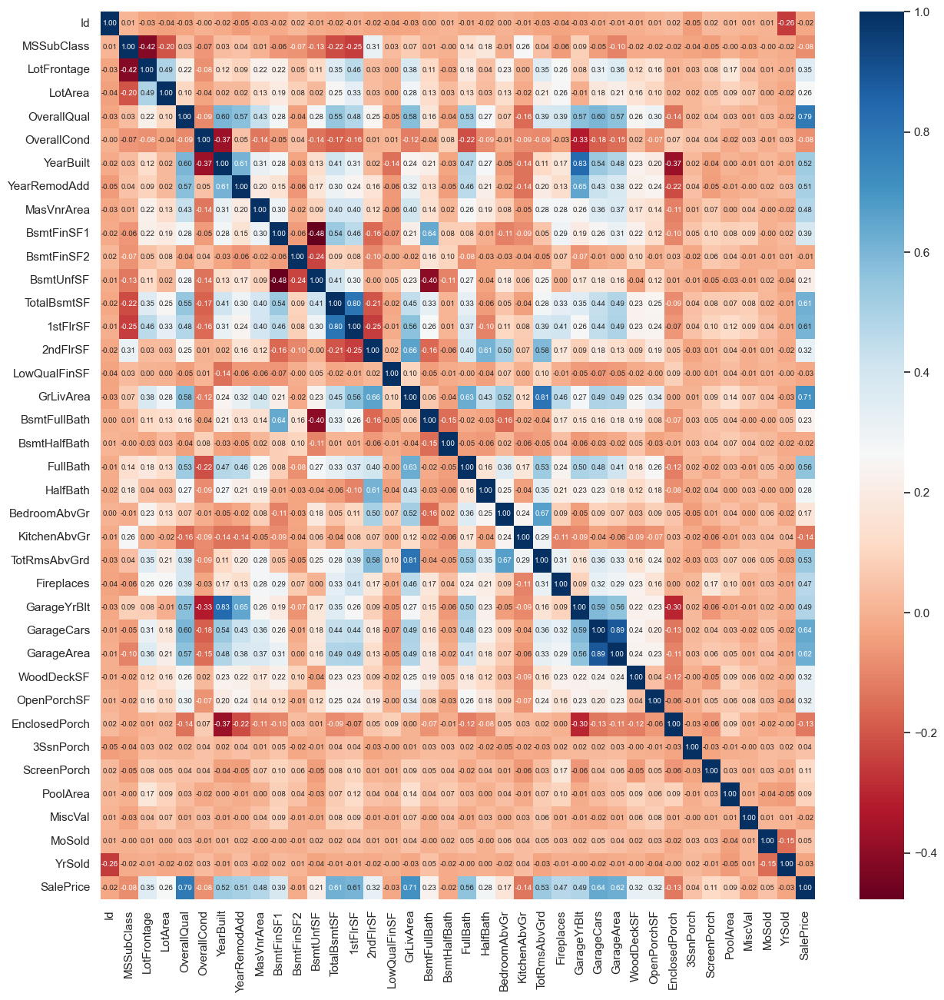

[]

In [16]:
high_correlated_cols(df, plot=True)

In [17]:
def cat_summary(dataframe, col_name, plot=False):

    if dataframe[col_name].dtypes == "bool":
        dataframe[col_name] = dataframe[col_name].astype(int)

        print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                            "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
        print("##########################################")

        if plot:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
            
            # TARGET_COUNT
            sns.countplot(x=col_name, data=dataframe, ax=ax1)
            ax1.set_title(f"Frequency of {col_name}")
            ax1.set_ylabel("TARGET_COUNT")
            ax1.tick_params(axis="x", rotation=45)
            
            # RATIO
            values = dataframe[col_name].value_counts()
            ax2.pie(x=values, labels=values.index, autopct="%1.1f%%", startangle=90)
            ax2.set_title(f"RATIO by {col_name}")
            ax2.legend(labels=[f"{index} - {value/sum(values)*100:.2f}%" for index, value in zip(values.index, values)],
                    loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
            
            plt.tight_layout()
            plt.show()

    else:
        print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                            "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
        print("##########################################")

        if plot:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
            
            # TARGET_COUNT
            sns.countplot(x=col_name, data=dataframe, ax=ax1)
            ax1.set_title(f"Frequency of {col_name}")
            ax1.set_ylabel("TARGET_COUNT")
            ax1.tick_params(axis="x", rotation=45)
            
            # RATIO
            values = dataframe[col_name].value_counts()
            ax2.pie(x=values, labels=values.index, autopct="%1.1f%%", startangle=90)
            ax2.set_title(f"RATIO by {col_name}")
            ax2.legend(labels=[f"{index} - {value/sum(values)*100:.2f}%" for index, value in zip(values.index, values)],
                    loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
            
            plt.tight_layout()
            plt.show()

          MSZoning  Ratio
MSZoning                 
RL            2265 77.595
RM             460 15.759
FV             139  4.762
RH              26  0.891
C (all)         25  0.856
##########################################


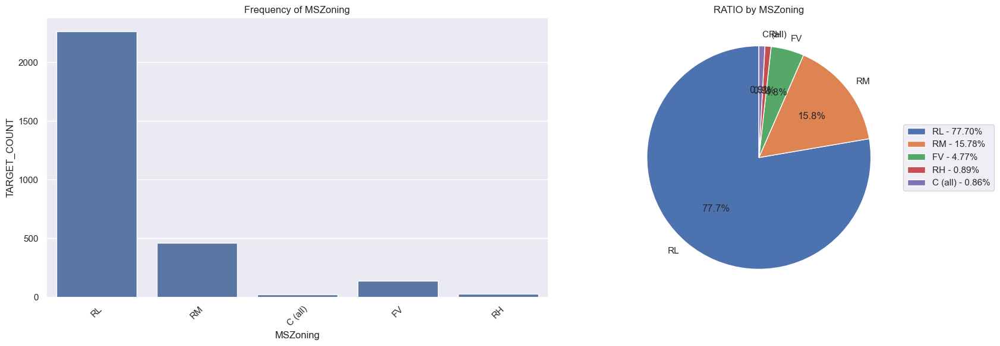

        Street  Ratio
Street               
Pave      2907 99.589
Grvl        12  0.411
##########################################


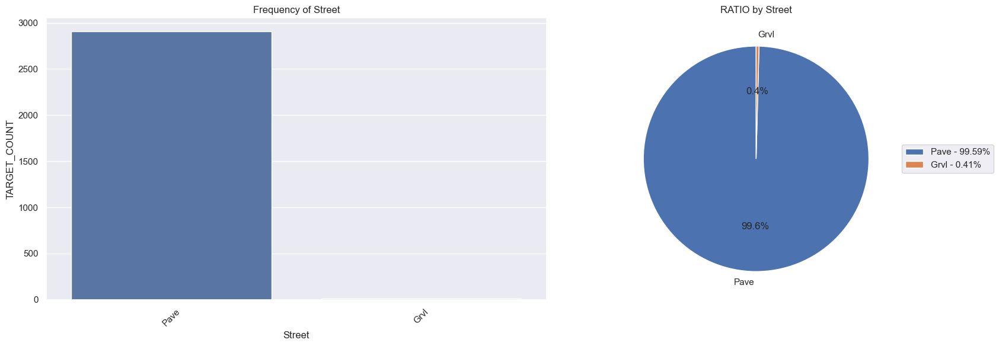

       Alley  Ratio
Alley              
Grvl     120  4.111
Pave      78  2.672
##########################################


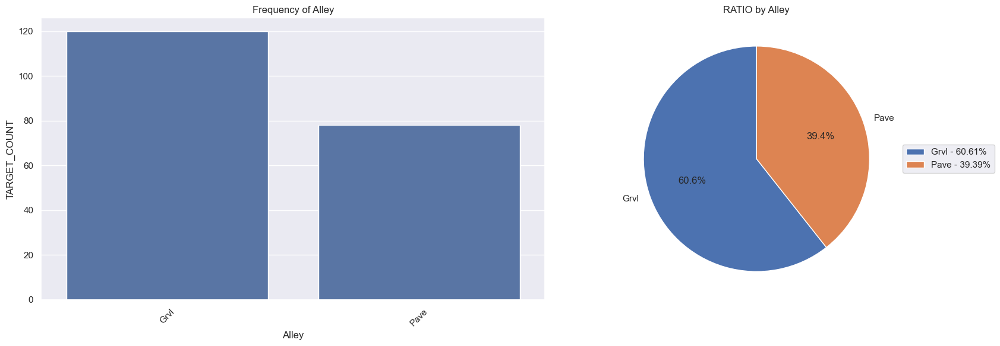

          LotShape  Ratio
LotShape                 
Reg           1859 63.686
IR1            968 33.162
IR2             76  2.604
IR3             16  0.548
##########################################


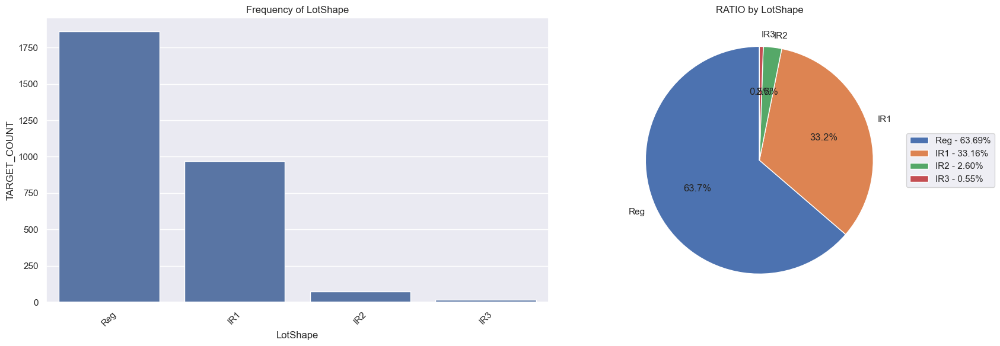

             LandContour  Ratio
LandContour                    
Lvl                 2622 89.825
HLS                  120  4.111
Bnk                  117  4.008
Low                   60  2.055
##########################################


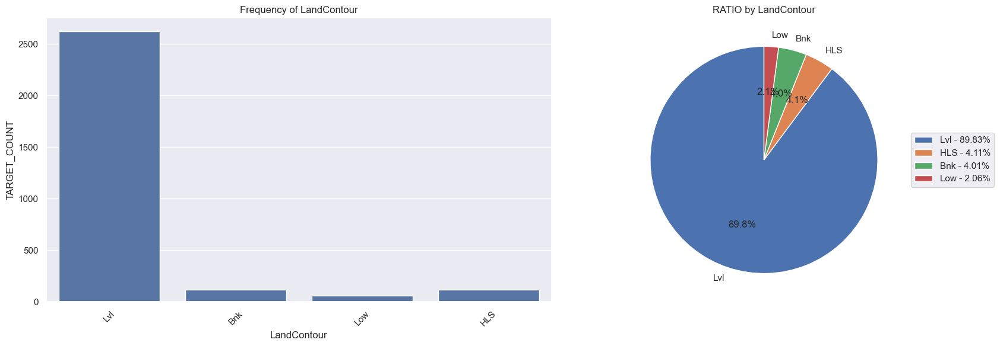

           Utilities  Ratio
Utilities                  
AllPub          2916 99.897
NoSeWa             1  0.034
##########################################


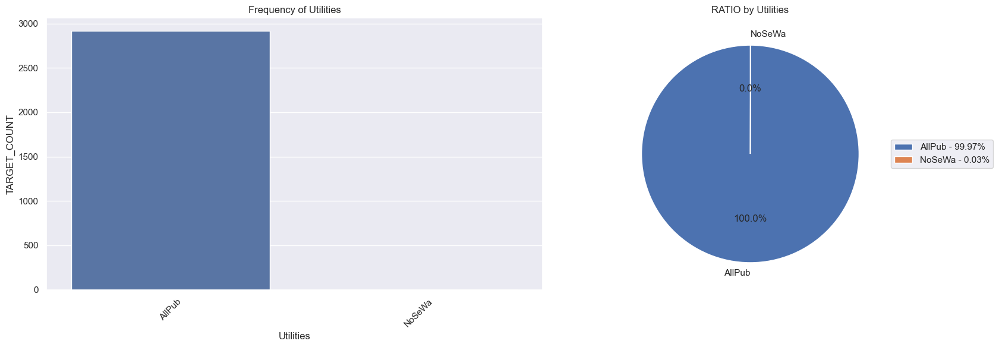

           LotConfig  Ratio
LotConfig                  
Inside          2133 73.073
Corner           511 17.506
CulDSac          176  6.029
FR2               85  2.912
FR3               14  0.480
##########################################


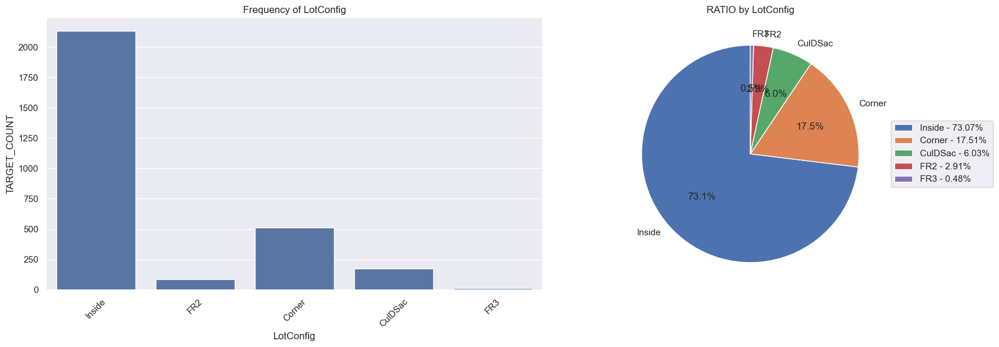

           LandSlope  Ratio
LandSlope                  
Gtl             2778 95.170
Mod              125  4.282
Sev               16  0.548
##########################################


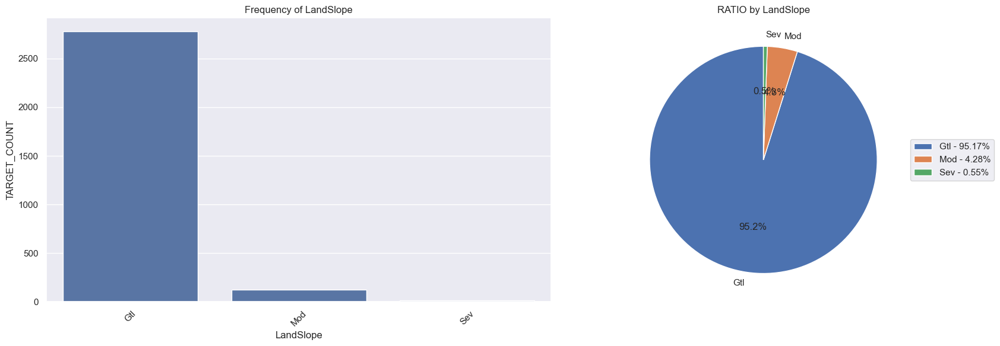

              Neighborhood  Ratio
Neighborhood                     
NAmes                  443 15.176
CollgCr                267  9.147
OldTown                239  8.188
Edwards                194  6.646
Somerst                182  6.235
NridgHt                166  5.687
Gilbert                165  5.653
Sawyer                 151  5.173
NWAmes                 131  4.488
SawyerW                125  4.282
Mitchel                114  3.905
BrkSide                108  3.700
Crawfor                103  3.529
IDOTRR                  93  3.186
Timber                  72  2.467
NoRidge                 71  2.432
StoneBr                 51  1.747
SWISU                   48  1.644
ClearCr                 44  1.507
MeadowV                 37  1.268
BrDale                  30  1.028
Blmngtn                 28  0.959
Veenker                 24  0.822
NPkVill                 23  0.788
Blueste                 10  0.343
##########################################


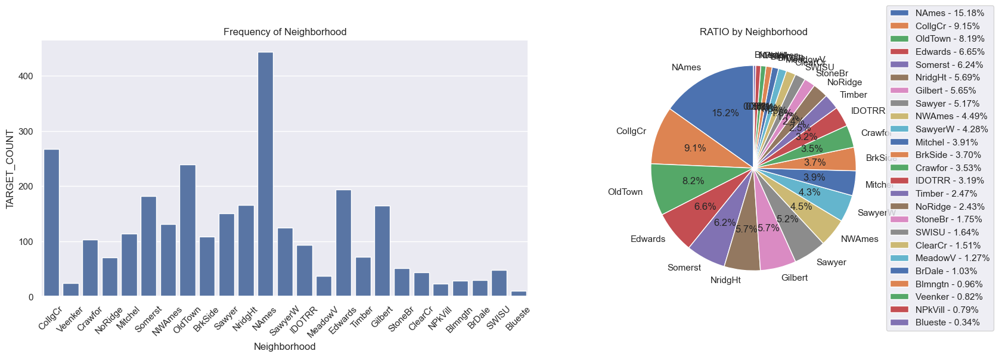

            Condition1  Ratio
Condition1                   
Norm              2511 86.023
Feedr              164  5.618
Artery              92  3.152
RRAn                50  1.713
PosN                39  1.336
RRAe                28  0.959
PosA                20  0.685
RRNn                 9  0.308
RRNe                 6  0.206
##########################################


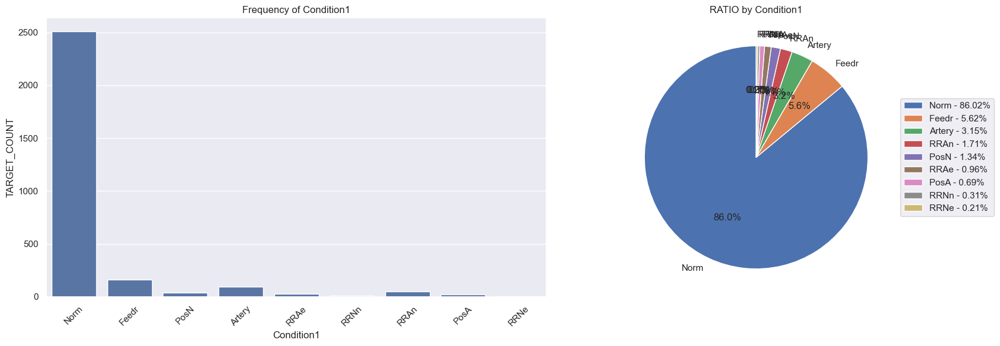

            Condition2  Ratio
Condition2                   
Norm              2889 98.972
Feedr               13  0.445
Artery               5  0.171
PosN                 4  0.137
PosA                 4  0.137
RRNn                 2  0.069
RRAn                 1  0.034
RRAe                 1  0.034
##########################################


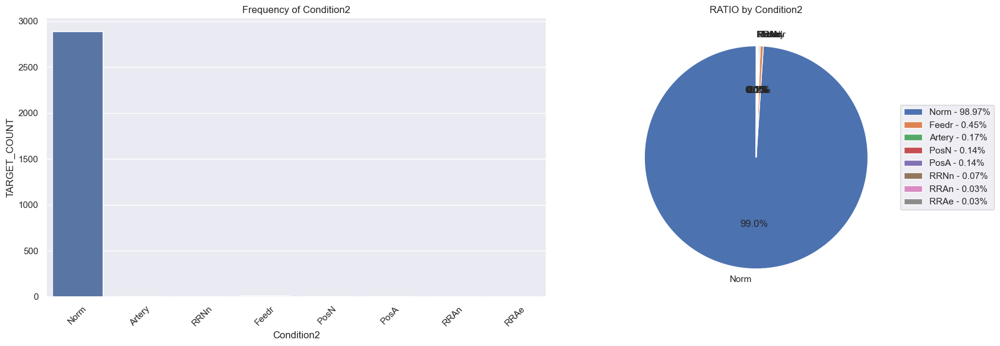

          BldgType  Ratio
BldgType                 
1Fam          2425 83.076
TwnhsE         227  7.777
Duplex         109  3.734
Twnhs           96  3.289
2fmCon          62  2.124
##########################################


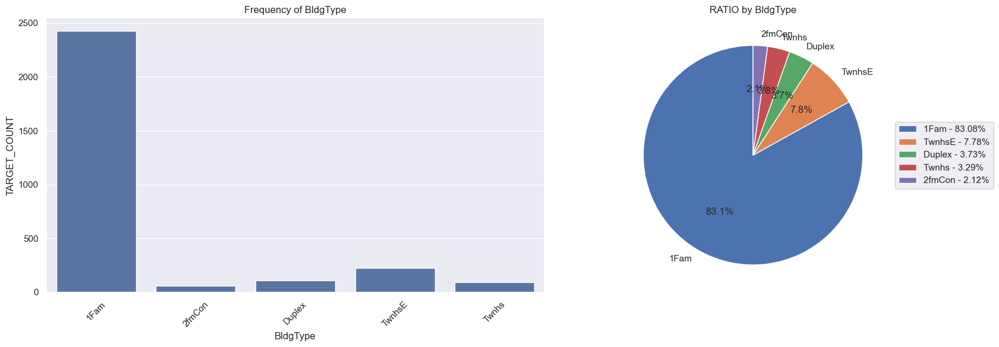

            HouseStyle  Ratio
HouseStyle                   
1Story            1471 50.394
2Story             872 29.873
1.5Fin             314 10.757
SLvl               128  4.385
SFoyer              83  2.843
2.5Unf              24  0.822
1.5Unf              19  0.651
2.5Fin               8  0.274
##########################################


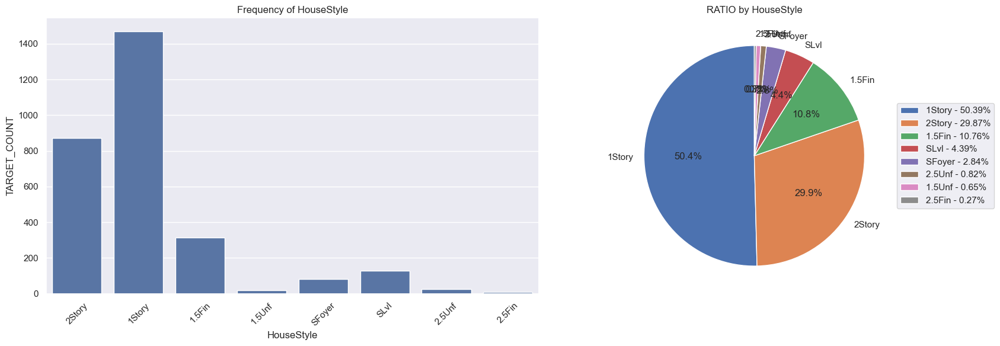

           RoofStyle  Ratio
RoofStyle                  
Gable           2310 79.137
Hip              551 18.876
Gambrel           22  0.754
Flat              20  0.685
Mansard           11  0.377
Shed               5  0.171
##########################################


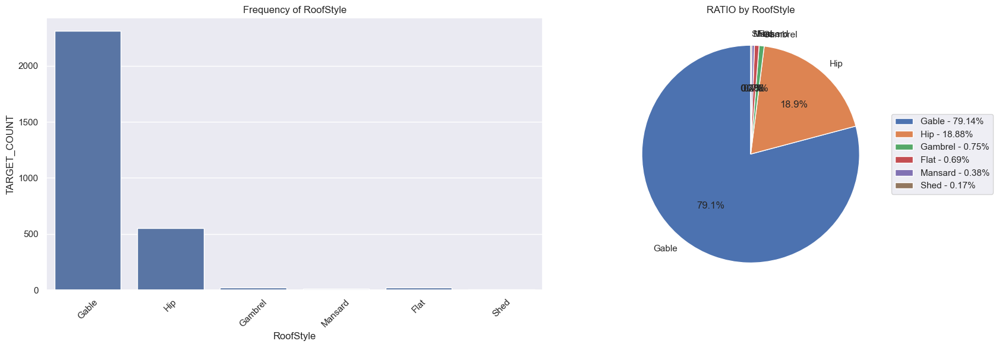

          RoofMatl  Ratio
RoofMatl                 
CompShg       2876 98.527
Tar&Grv         23  0.788
WdShake          9  0.308
WdShngl          7  0.240
Metal            1  0.034
Membran          1  0.034
Roll             1  0.034
ClyTile          1  0.034
##########################################


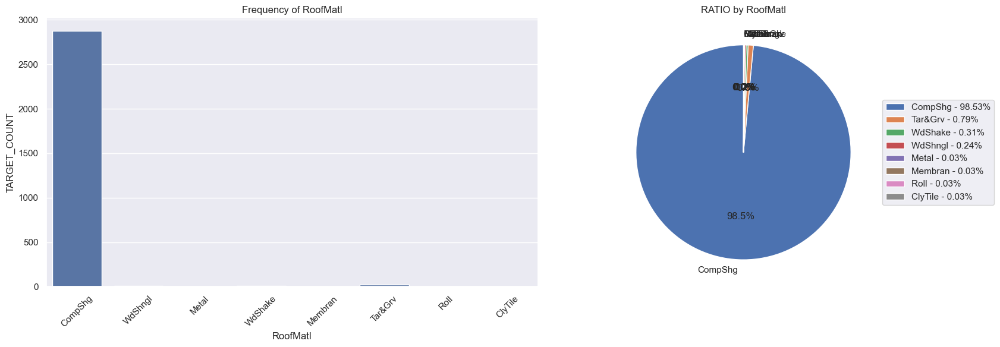

             Exterior1st  Ratio
Exterior1st                    
VinylSd             1025 35.115
MetalSd              450 15.416
HdBoard              442 15.142
Wd Sdng              411 14.080
Plywood              221  7.571
CemntBd              126  4.317
BrkFace               87  2.980
WdShing               56  1.918
AsbShng               44  1.507
Stucco                43  1.473
BrkComm                6  0.206
AsphShn                2  0.069
Stone                  2  0.069
CBlock                 2  0.069
ImStucc                1  0.034
##########################################


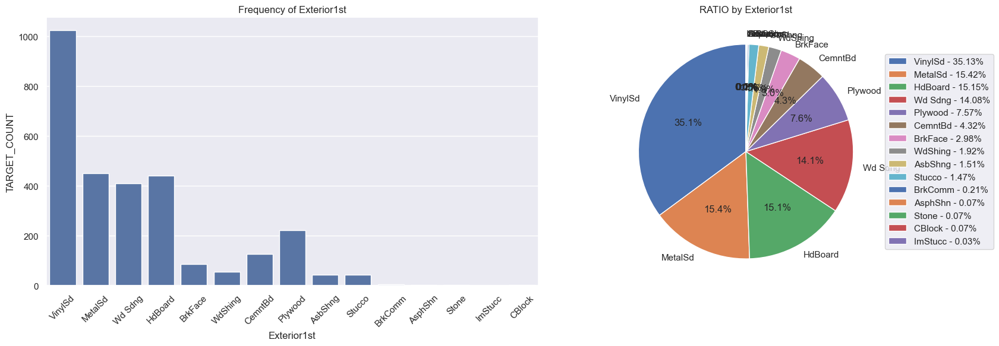

             Exterior2nd  Ratio
Exterior2nd                    
VinylSd             1014 34.738
MetalSd              447 15.313
HdBoard              406 13.909
Wd Sdng              391 13.395
Plywood              270  9.250
CmentBd              126  4.317
Wd Shng               81  2.775
BrkFace               47  1.610
Stucco                47  1.610
AsbShng               38  1.302
Brk Cmn               22  0.754
ImStucc               15  0.514
Stone                  6  0.206
AsphShn                4  0.137
CBlock                 3  0.103
Other                  1  0.034
##########################################


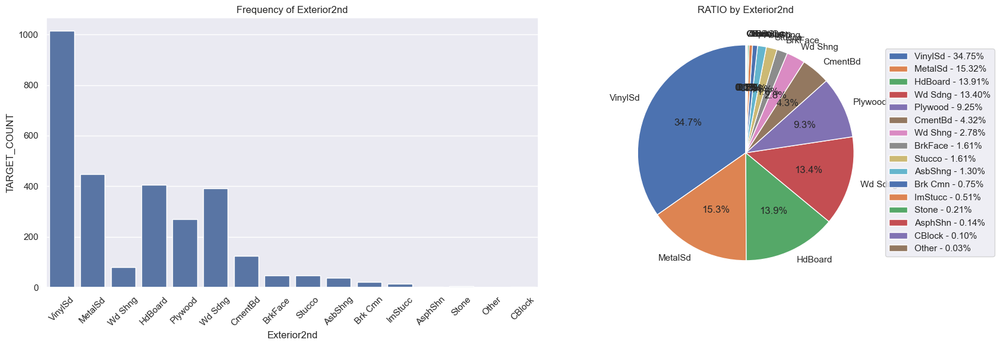

            MasVnrType  Ratio
MasVnrType                   
BrkFace            879 30.113
Stone              249  8.530
BrkCmn              25  0.856
##########################################


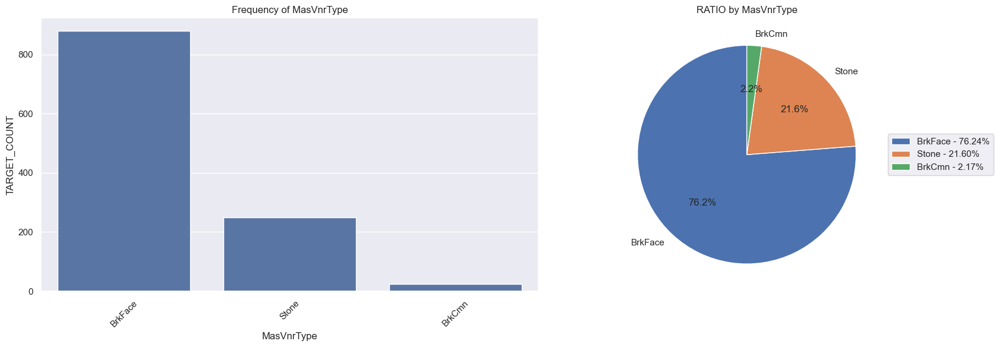

           ExterQual  Ratio
ExterQual                  
TA              1798 61.596
Gd               979 33.539
Ex               107  3.666
Fa                35  1.199
##########################################


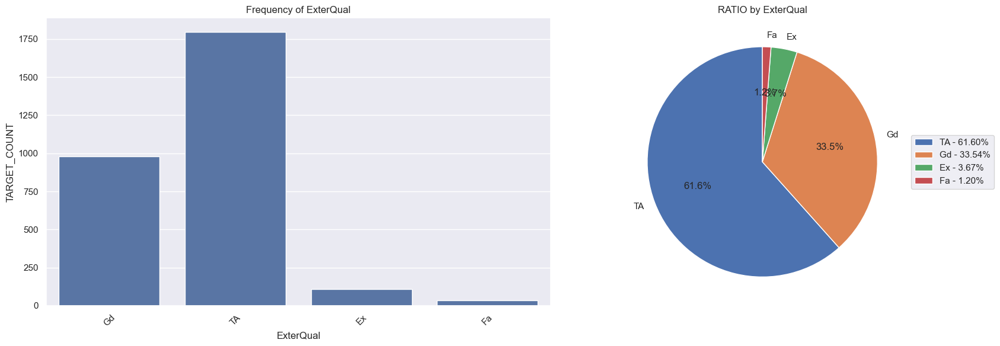

           ExterCond  Ratio
ExterCond                  
TA              2538 86.948
Gd               299 10.243
Fa                67  2.295
Ex                12  0.411
Po                 3  0.103
##########################################


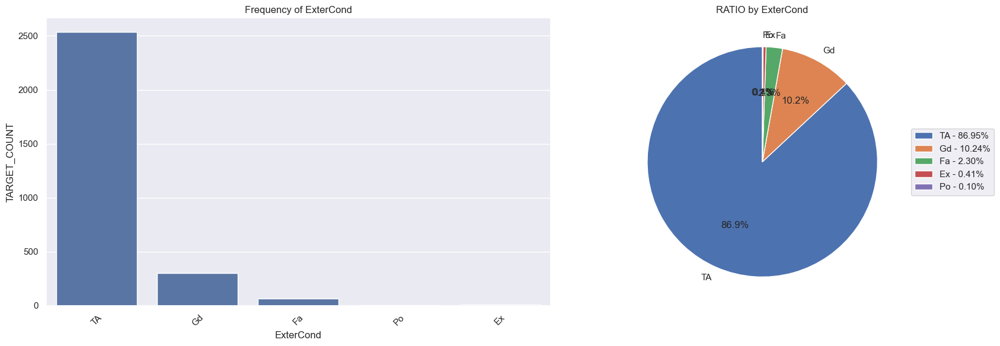

            Foundation  Ratio
Foundation                   
PConc             1308 44.810
CBlock            1235 42.309
BrkTil             311 10.654
Slab                49  1.679
Stone               11  0.377
Wood                 5  0.171
##########################################


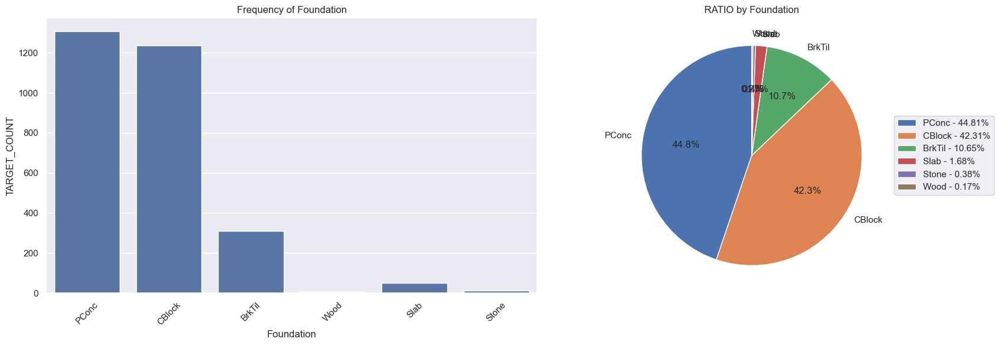

          BsmtQual  Ratio
BsmtQual                 
TA            1283 43.953
Gd            1209 41.418
Ex             258  8.839
Fa              88  3.015
##########################################


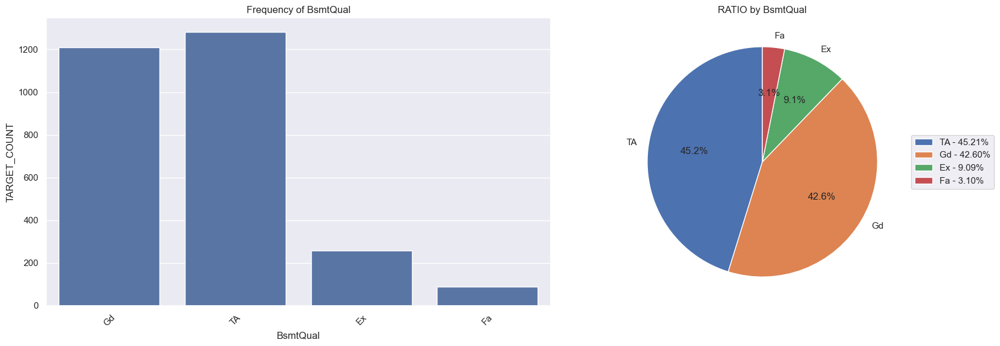

          BsmtCond  Ratio
BsmtCond                 
TA            2606 89.277
Gd             122  4.180
Fa             104  3.563
Po               5  0.171
##########################################


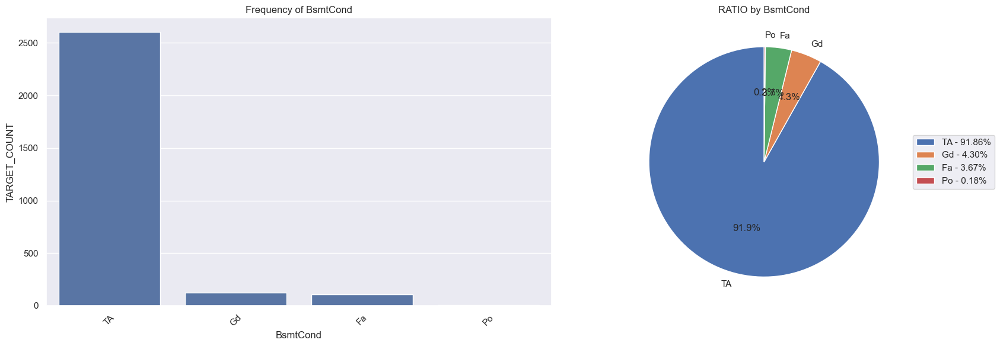

              BsmtExposure  Ratio
BsmtExposure                     
No                    1904 65.228
Av                     418 14.320
Gd                     276  9.455
Mn                     239  8.188
##########################################


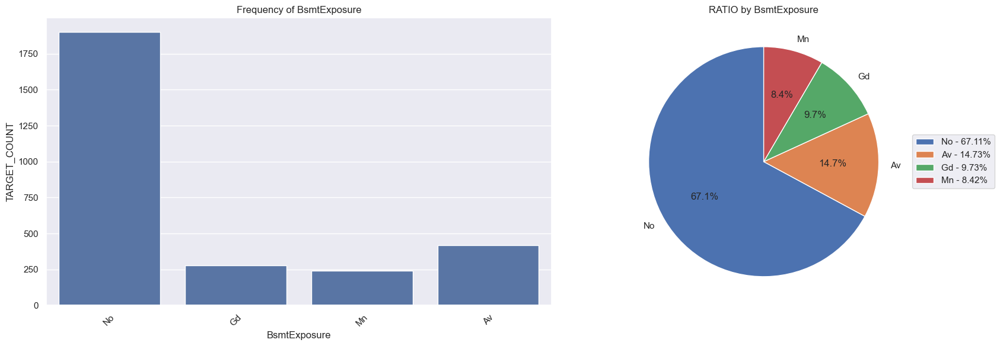

              BsmtFinType1  Ratio
BsmtFinType1                     
Unf                    851 29.154
GLQ                    849 29.085
ALQ                    429 14.697
Rec                    288  9.866
BLQ                    269  9.215
LwQ                    154  5.276
##########################################


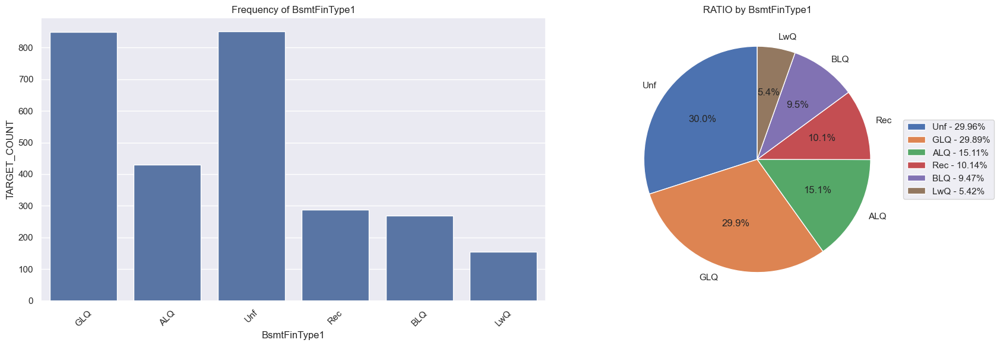

              BsmtFinType2  Ratio
BsmtFinType2                     
Unf                   2493 85.406
Rec                    105  3.597
LwQ                     87  2.980
BLQ                     68  2.330
ALQ                     52  1.781
GLQ                     34  1.165
##########################################


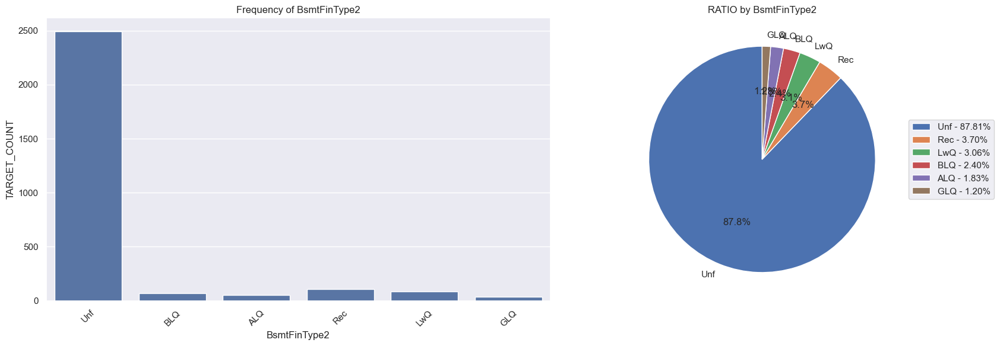

         Heating  Ratio
Heating                
GasA        2874 98.458
GasW          27  0.925
Grav           9  0.308
Wall           6  0.206
OthW           2  0.069
Floor          1  0.034
##########################################


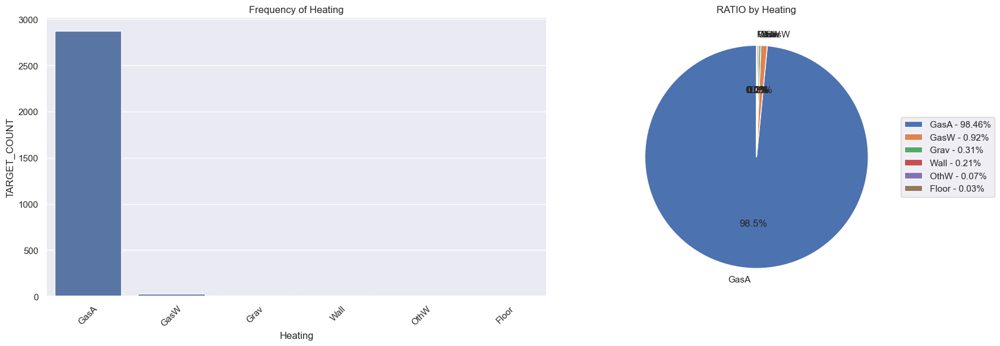

           HeatingQC  Ratio
HeatingQC                  
Ex              1493 51.148
TA               857 29.359
Gd               474 16.238
Fa                92  3.152
Po                 3  0.103
##########################################


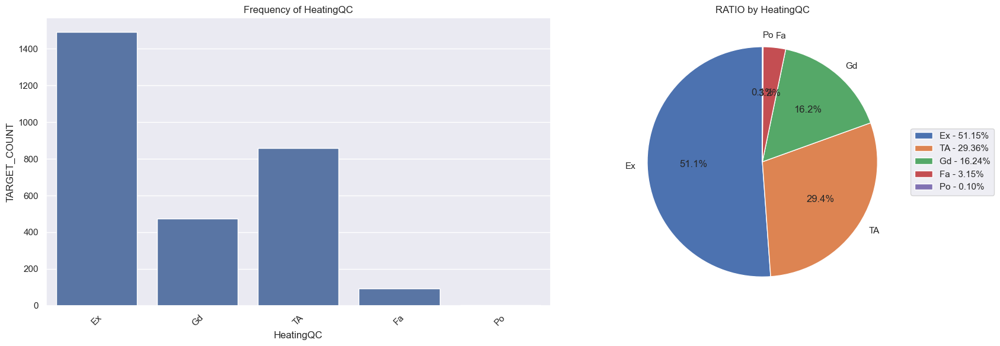

            CentralAir  Ratio
CentralAir                   
Y                 2723 93.285
N                  196  6.715
##########################################


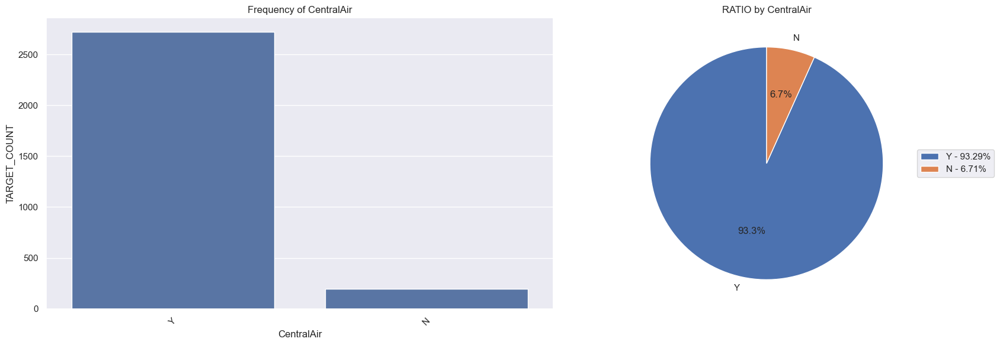

            Electrical  Ratio
Electrical                   
SBrkr             2671 91.504
FuseA              188  6.441
FuseF               50  1.713
FuseP                8  0.274
Mix                  1  0.034
##########################################


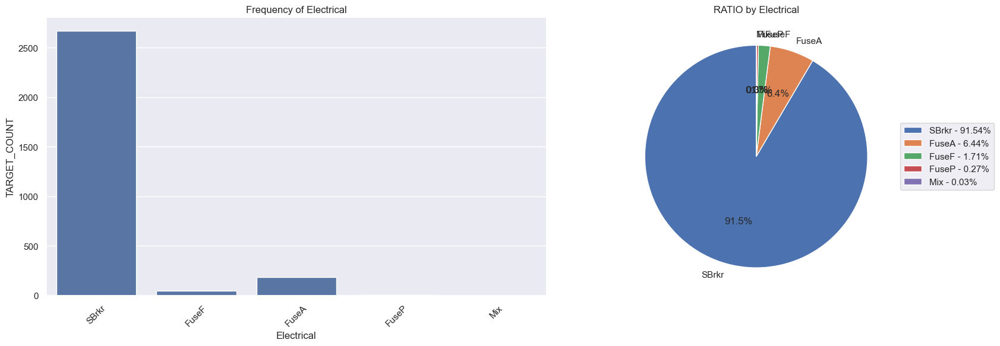

             KitchenQual  Ratio
KitchenQual                    
TA                  1492 51.113
Gd                  1151 39.431
Ex                   205  7.023
Fa                    70  2.398
##########################################


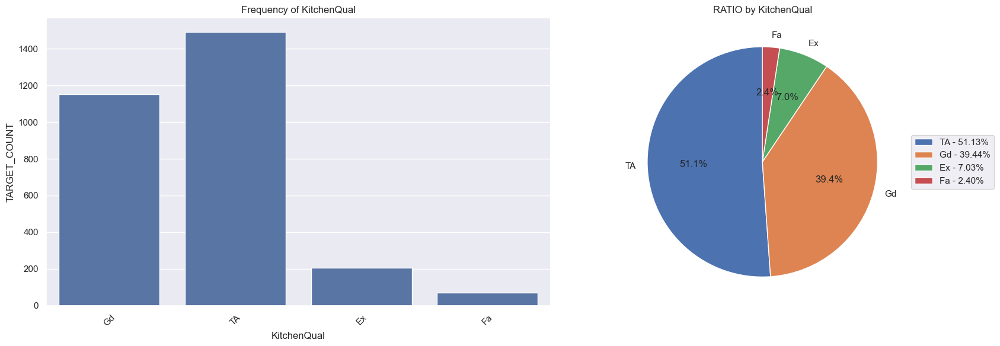

            Functional  Ratio
Functional                   
Typ               2717 93.080
Min2                70  2.398
Min1                65  2.227
Mod                 35  1.199
Maj1                19  0.651
Maj2                 9  0.308
Sev                  2  0.069
##########################################


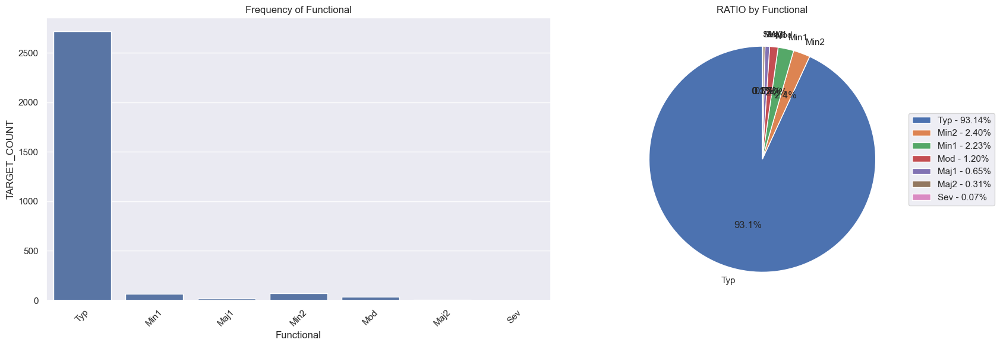

             FireplaceQu  Ratio
FireplaceQu                    
Gd                   744 25.488
TA                   592 20.281
Fa                    74  2.535
Po                    46  1.576
Ex                    43  1.473
##########################################


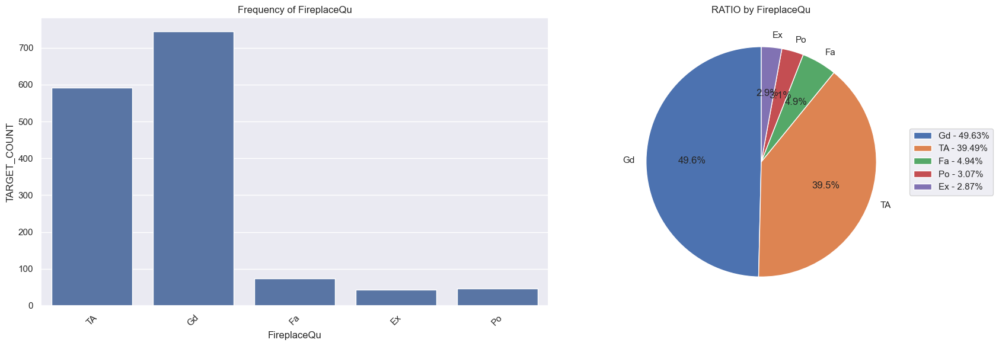

            GarageType  Ratio
GarageType                   
Attchd            1723 59.027
Detchd             779 26.687
BuiltIn            186  6.372
Basment             36  1.233
2Types              23  0.788
CarPort             15  0.514
##########################################


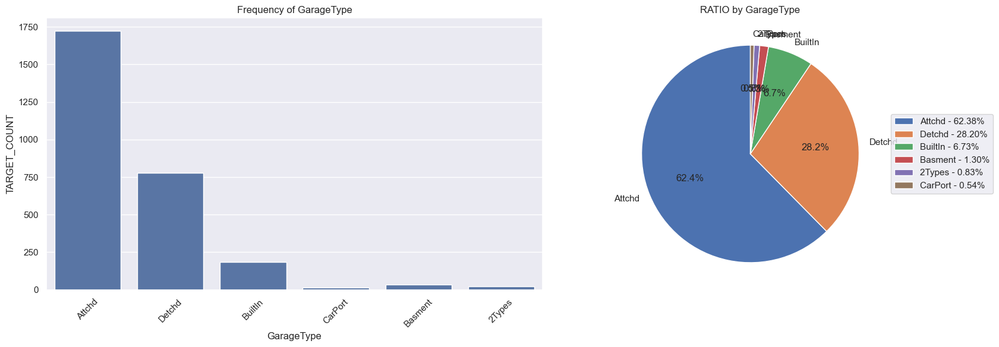

              GarageFinish  Ratio
GarageFinish                     
Unf                   1230 42.138
RFn                    811 27.783
Fin                    719 24.632
##########################################


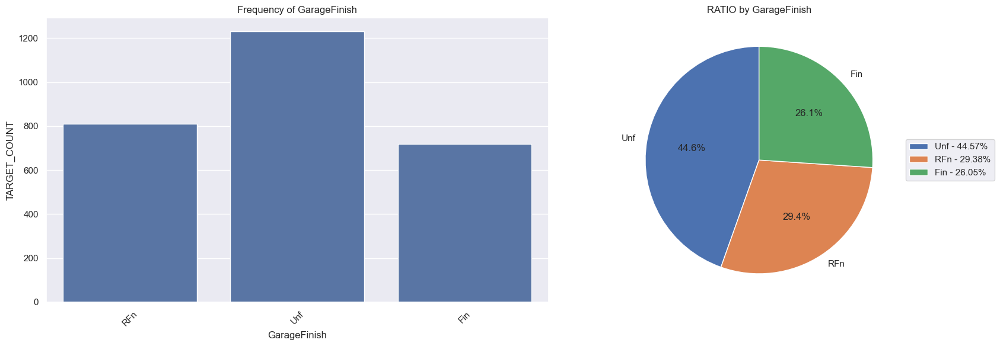

            GarageQual  Ratio
GarageQual                   
TA                2604 89.209
Fa                 124  4.248
Gd                  24  0.822
Po                   5  0.171
Ex                   3  0.103
##########################################


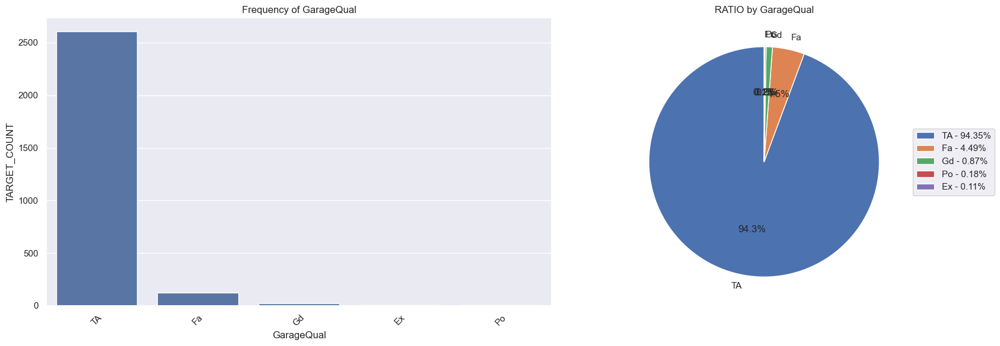

            GarageCond  Ratio
GarageCond                   
TA                2654 90.922
Fa                  74  2.535
Gd                  15  0.514
Po                  14  0.480
Ex                   3  0.103
##########################################


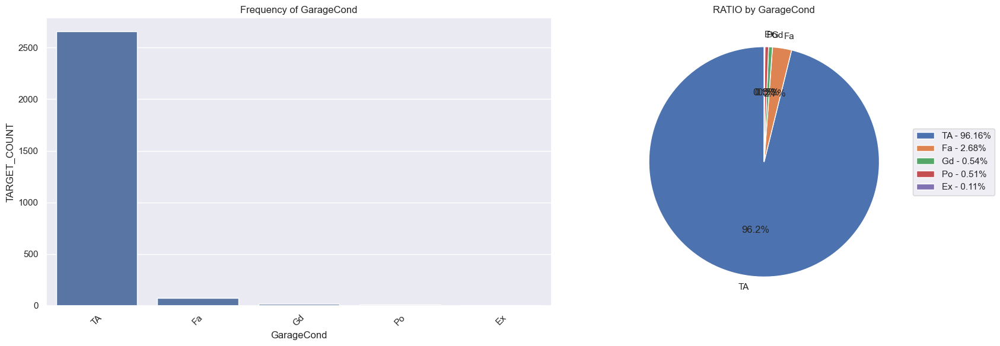

            PavedDrive  Ratio
PavedDrive                   
Y                 2641 90.476
N                  216  7.400
P                   62  2.124
##########################################


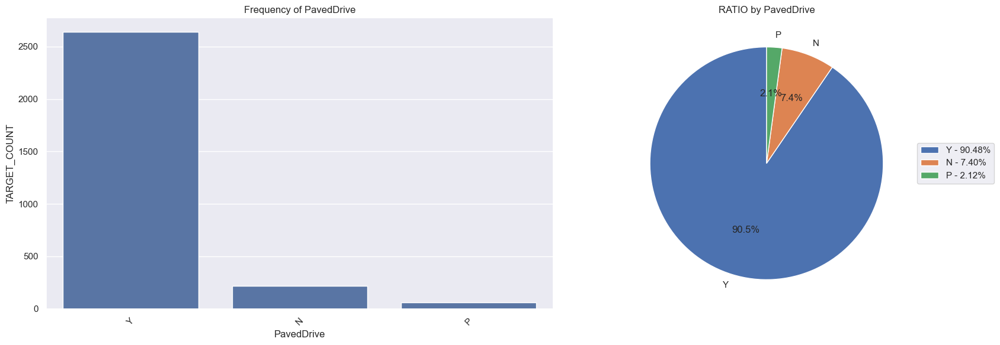

        PoolQC  Ratio
PoolQC               
Ex           4  0.137
Gd           4  0.137
Fa           2  0.069
##########################################


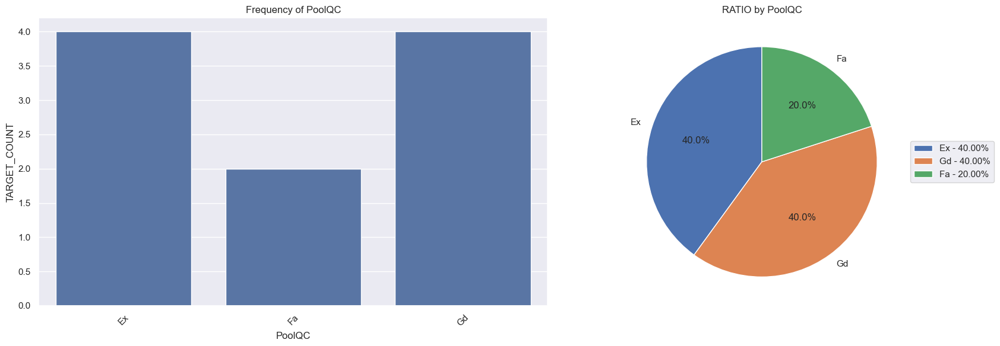

       Fence  Ratio
Fence              
MnPrv    329 11.271
GdPrv    118  4.042
GdWo     112  3.837
MnWw      12  0.411
##########################################


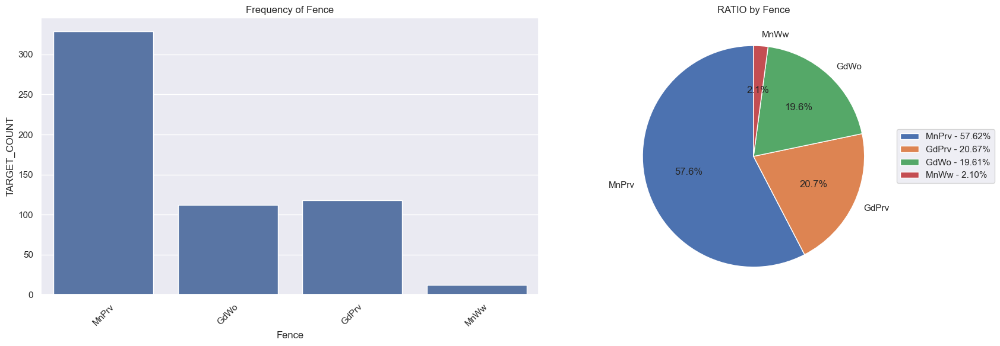

             MiscFeature  Ratio
MiscFeature                    
Shed                  95  3.255
Gar2                   5  0.171
Othr                   4  0.137
TenC                   1  0.034
##########################################


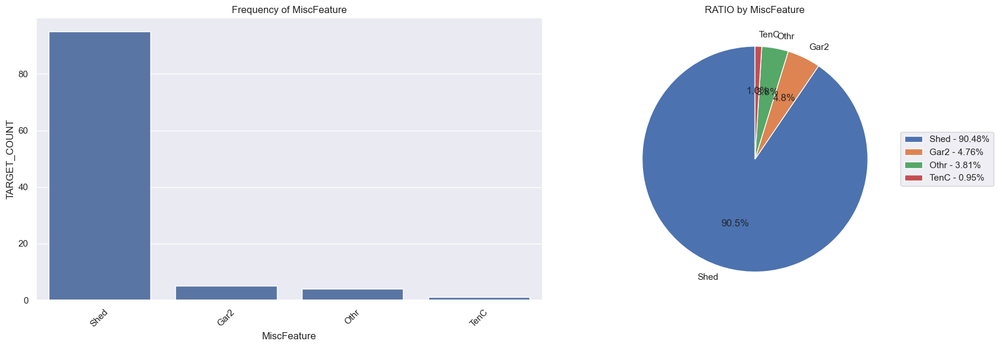

          SaleType  Ratio
SaleType                 
WD            2525 86.502
New            239  8.188
COD             87  2.980
ConLD           26  0.891
CWD             12  0.411
ConLI            9  0.308
ConLw            8  0.274
Oth              7  0.240
Con              5  0.171
##########################################


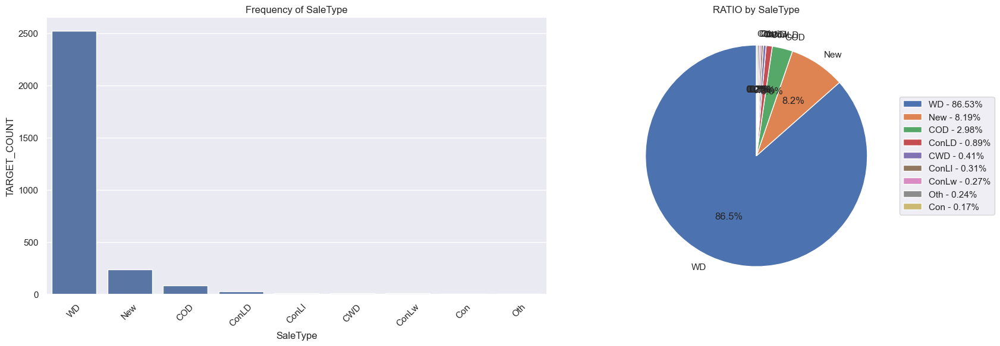

               SaleCondition  Ratio
SaleCondition                      
Normal                  2402 82.288
Partial                  245  8.393
Abnorml                  190  6.509
Family                    46  1.576
Alloca                    24  0.822
AdjLand                   12  0.411
##########################################


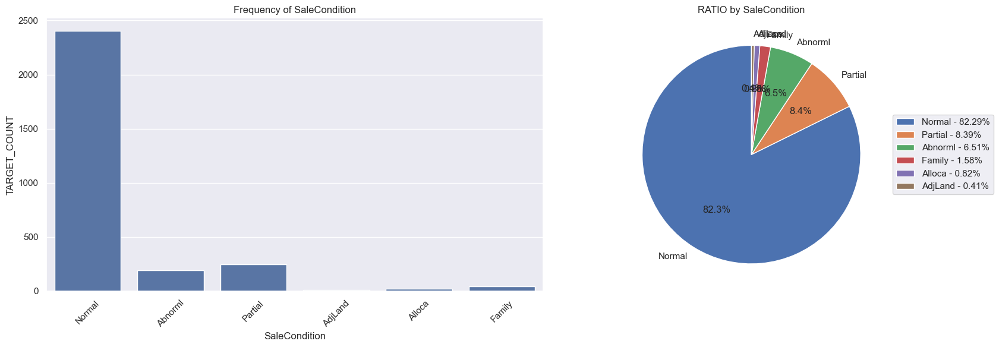

             OverallCond  Ratio
OverallCond                    
5                   1645 56.355
6                    531 18.191
7                    390 13.361
8                    144  4.933
4                    101  3.460
3                     50  1.713
9                     41  1.405
2                     10  0.343
1                      7  0.240
##########################################


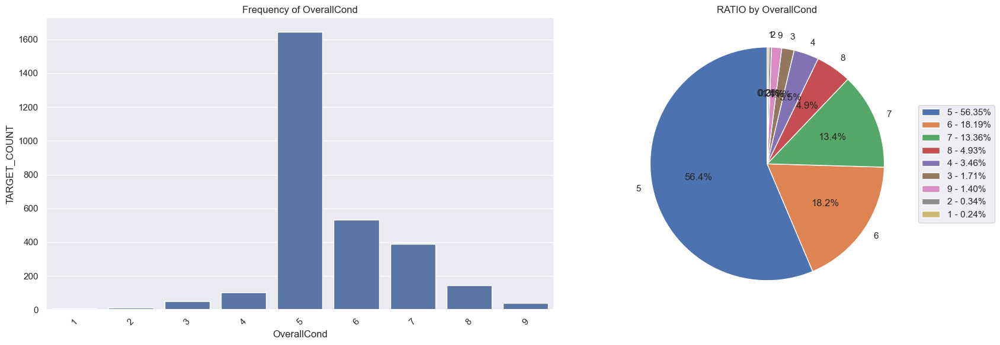

              BsmtFullBath  Ratio
BsmtFullBath                     
0.000                 1705 58.410
1.000                 1172 40.151
2.000                   38  1.302
3.000                    2  0.069
##########################################


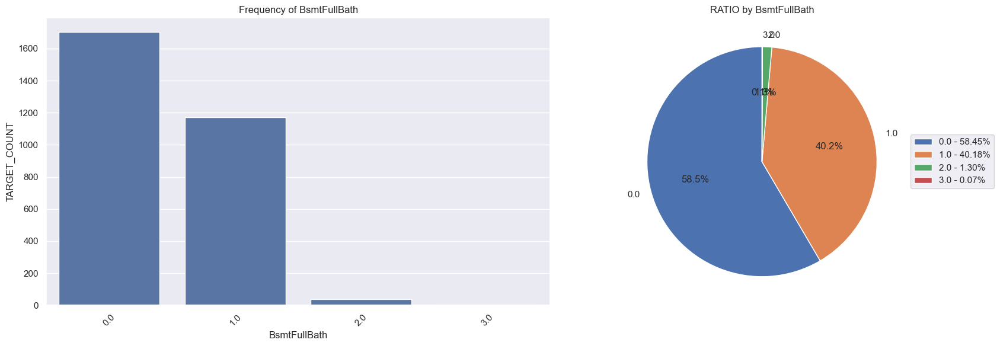

              BsmtHalfBath  Ratio
BsmtHalfBath                     
0.000                 2742 93.936
1.000                  171  5.858
2.000                    4  0.137
##########################################


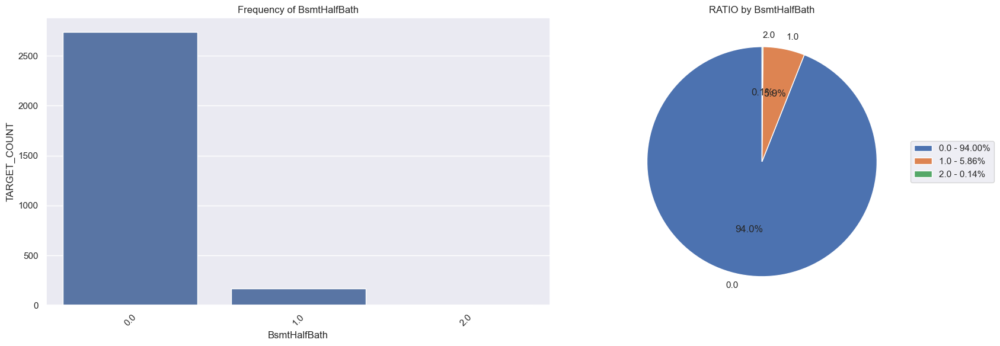

          FullBath  Ratio
FullBath                 
2             1530 52.415
1             1309 44.844
3               64  2.193
0               12  0.411
4                4  0.137
##########################################


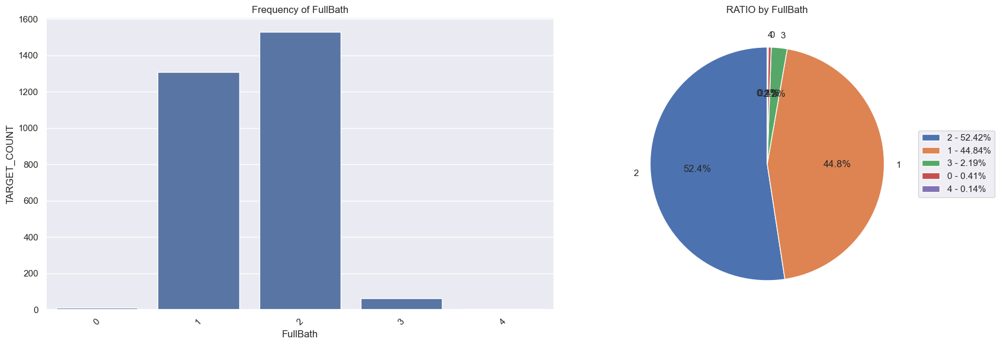

          HalfBath  Ratio
HalfBath                 
0             1834 62.830
1             1060 36.314
2               25  0.856
##########################################


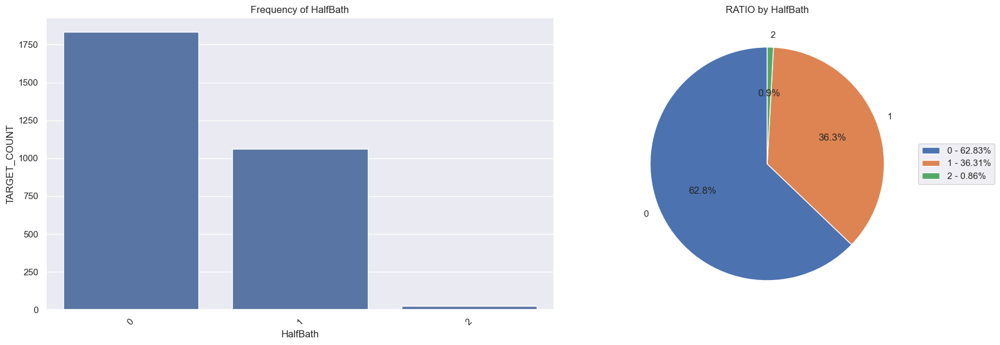

              BedroomAbvGr  Ratio
BedroomAbvGr                     
3                     1596 54.676
2                      742 25.420
4                      400 13.703
1                      103  3.529
5                       48  1.644
6                       21  0.719
0                        8  0.274
8                        1  0.034
##########################################


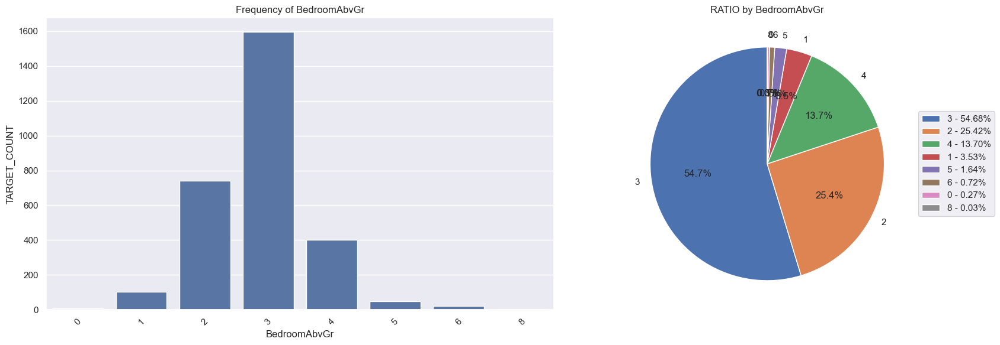

              KitchenAbvGr  Ratio
KitchenAbvGr                     
1                     2785 95.409
2                      129  4.419
0                        3  0.103
3                        2  0.069
##########################################


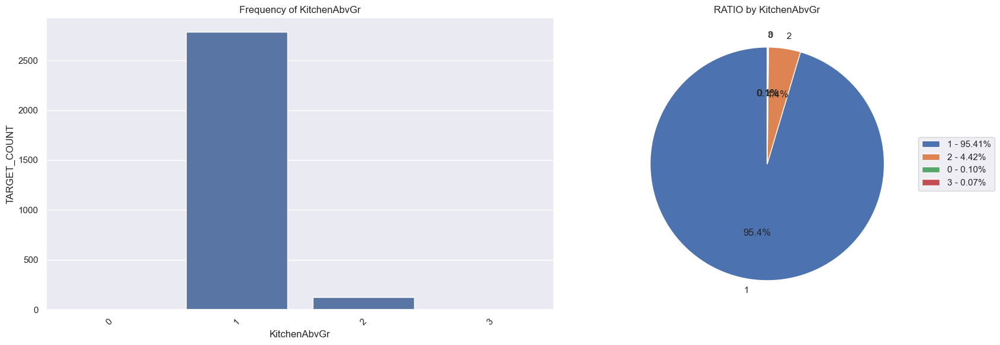

            Fireplaces  Ratio
Fireplaces                   
0                 1420 48.647
1                 1268 43.440
2                  219  7.503
3                   11  0.377
4                    1  0.034
##########################################


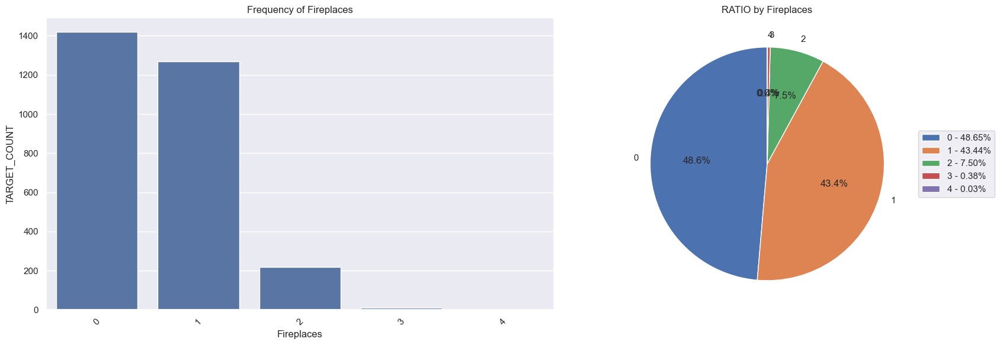

            GarageCars  Ratio
GarageCars                   
2.000             1594 54.608
1.000              776 26.584
3.000              374 12.813
0.000              157  5.379
4.000               16  0.548
5.000                1  0.034
##########################################


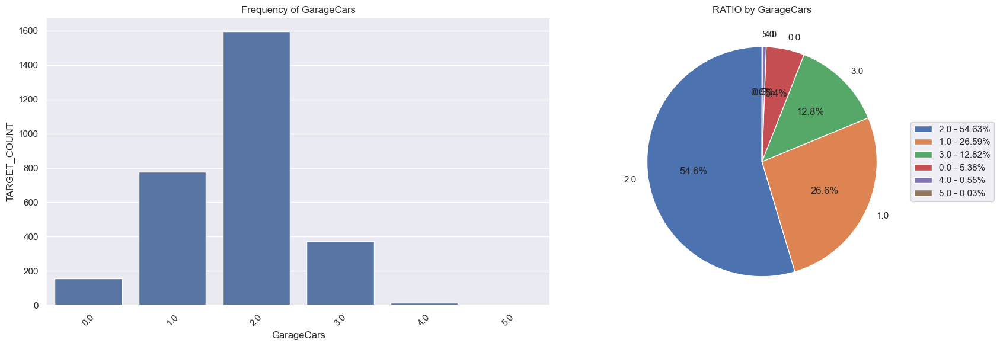

        YrSold  Ratio
YrSold               
2007       692 23.707
2009       647 22.165
2008       622 21.309
2006       619 21.206
2010       339 11.614
##########################################


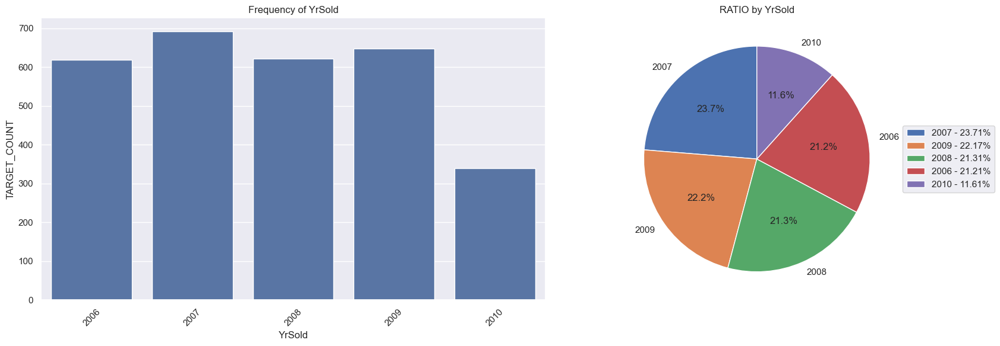

In [18]:
for col in cat_cols:
    cat_summary(df, col, plot=True)

In [19]:
def num_summary(dataframe, numerical_col, plot=False, hist_bins=20):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(numerical_col)
    print("##########################################")
    print(dataframe[numerical_col].describe(quantiles).T)
    print("##########################################")

    if plot:
        fig, axs = plt.subplots(2, 2, figsize=(12, 10))
        
        # Histogram
        plt.subplot(2, 2, 1)
        dataframe[numerical_col].hist(bins=hist_bins)
        plt.xlabel(numerical_col)
        plt.title(numerical_col + " Distribution")
        
        # Boxplot
        plt.subplot(2, 2, 2)
        sns.boxplot(y=numerical_col, data=dataframe)
        plt.title("Boxplot of " + numerical_col)
        plt.xticks(rotation=90)
        
        # Density Plot
        plt.subplot(2, 2, 3)
        sns.kdeplot(dataframe[numerical_col], fill=True)
        plt.xlabel(numerical_col)
        plt.title(numerical_col + " Density")
        
        # QQ Plot
        plt.subplot(2, 2, 4)
        stats.probplot(dataframe[numerical_col], dist="norm", plot=plt)
        plt.title(numerical_col + " QQ Plot")
        
        plt.tight_layout()
        plt.show(block=True)

MSSubClass
##########################################
count   2919.000
mean      57.138
std       42.518
min       20.000
5%        20.000
10%       20.000
20%       20.000
30%       20.000
40%       30.000
50%       50.000
60%       60.000
70%       60.000
80%       80.000
90%      120.000
95%      160.000
99%      190.000
max      190.000
Name: MSSubClass, dtype: float64
##########################################


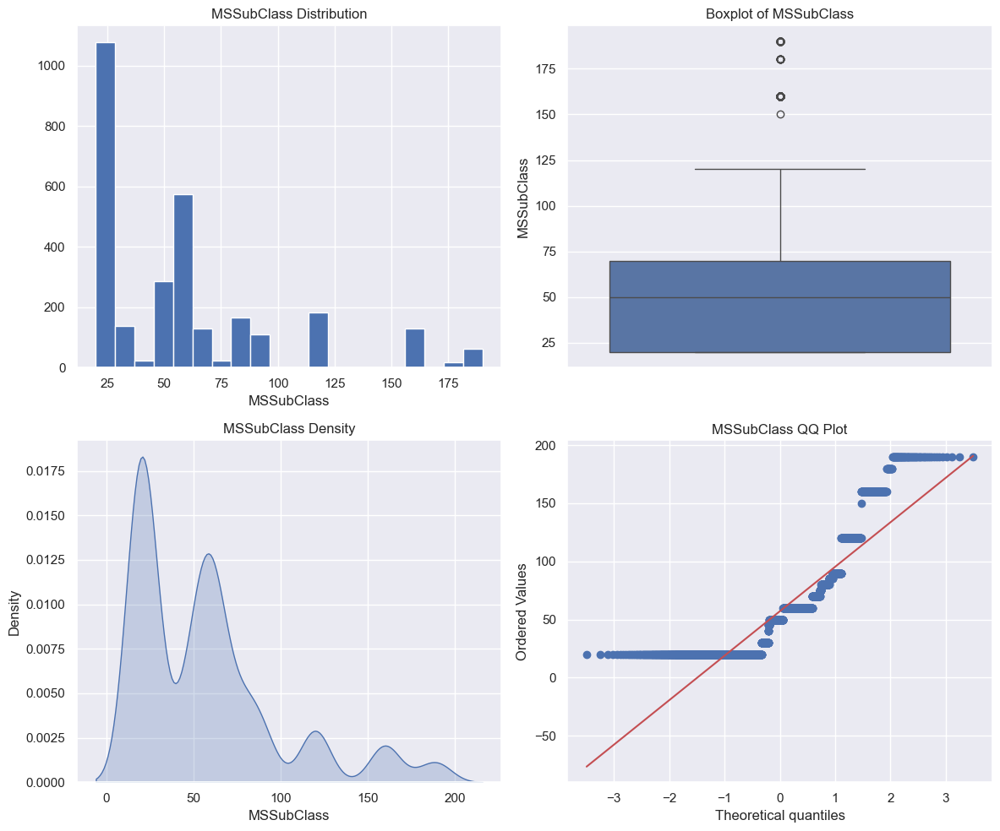

LotFrontage
##########################################
count   2433.000
mean      69.306
std       23.345
min       21.000
5%        32.000
10%       43.000
20%       53.000
30%       60.000
40%       63.000
50%       68.000
60%       73.000
70%       78.000
80%       84.000
90%       95.000
95%      107.000
99%      135.680
max      313.000
Name: LotFrontage, dtype: float64
##########################################


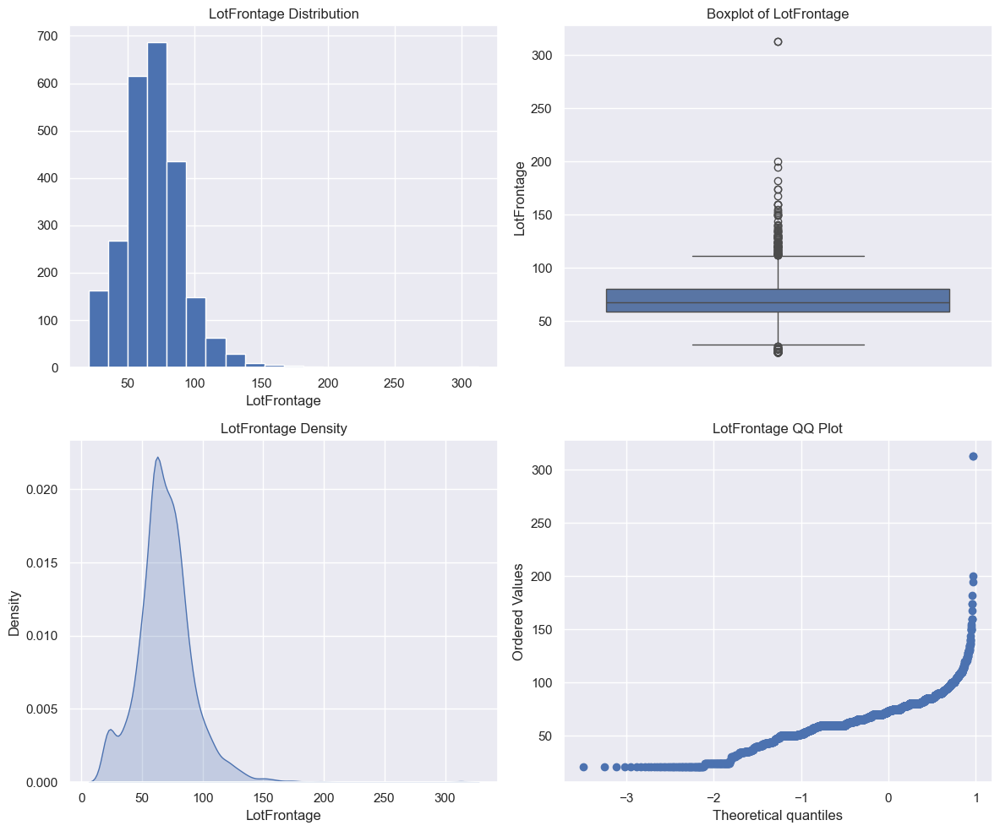

LotArea
##########################################
count     2919.000
mean     10168.114
std       7886.996
min       1300.000
5%        3182.000
10%       4922.400
20%       7007.600
30%       7960.400
40%       8741.000
50%       9453.000
60%      10151.600
70%      11001.200
80%      12203.800
90%      14300.600
95%      17142.900
99%      33038.640
max     215245.000
Name: LotArea, dtype: float64
##########################################


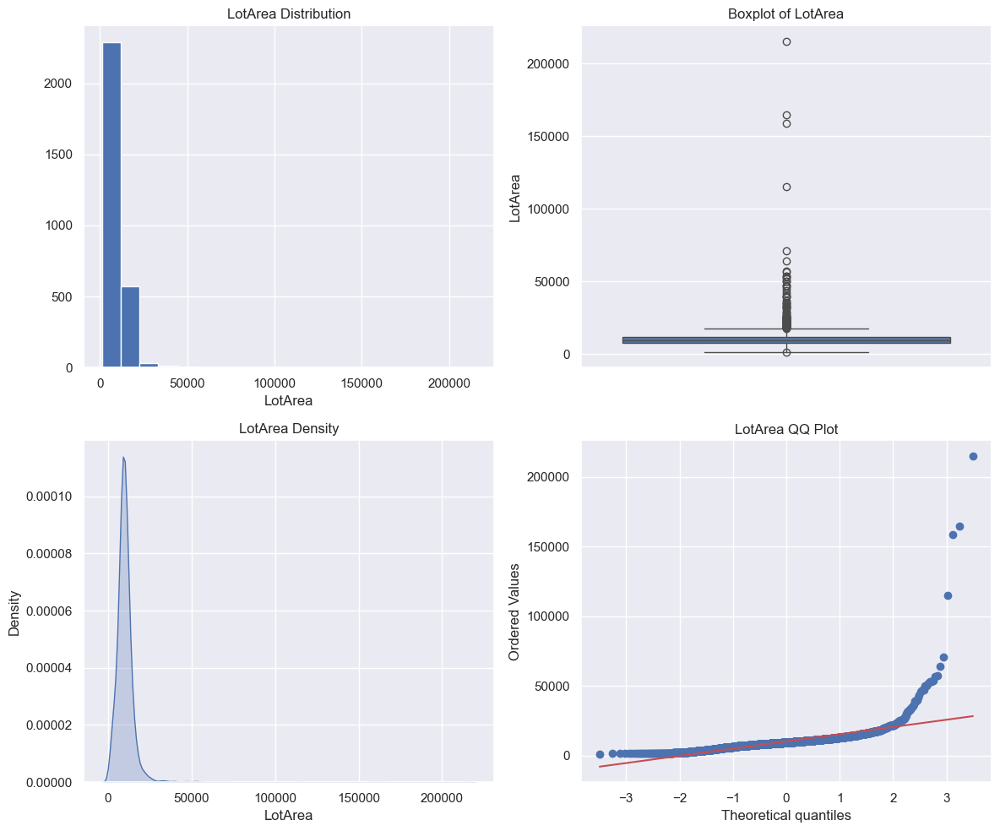

OverallQual
##########################################
count   2919.000
mean       6.089
std        1.410
min        1.000
5%         4.000
10%        5.000
20%        5.000
30%        5.000
40%        6.000
50%        6.000
60%        6.000
70%        7.000
80%        7.000
90%        8.000
95%        8.000
99%       10.000
max       10.000
Name: OverallQual, dtype: float64
##########################################


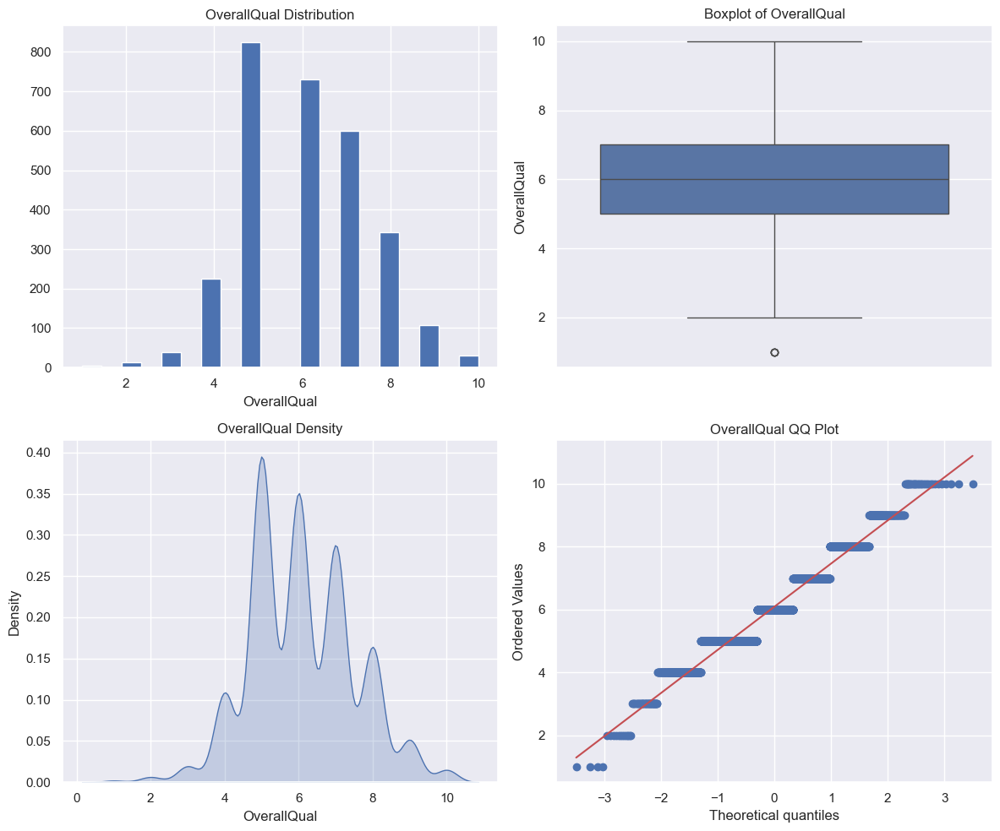

YearBuilt
##########################################
count   2919.000
mean    1971.313
std       30.291
min     1872.000
5%      1915.000
10%     1924.000
20%     1947.000
30%     1957.000
40%     1965.000
50%     1973.000
60%     1984.000
70%     1998.000
80%     2003.000
90%     2006.000
95%     2007.000
99%     2008.000
max     2010.000
Name: YearBuilt, dtype: float64
##########################################


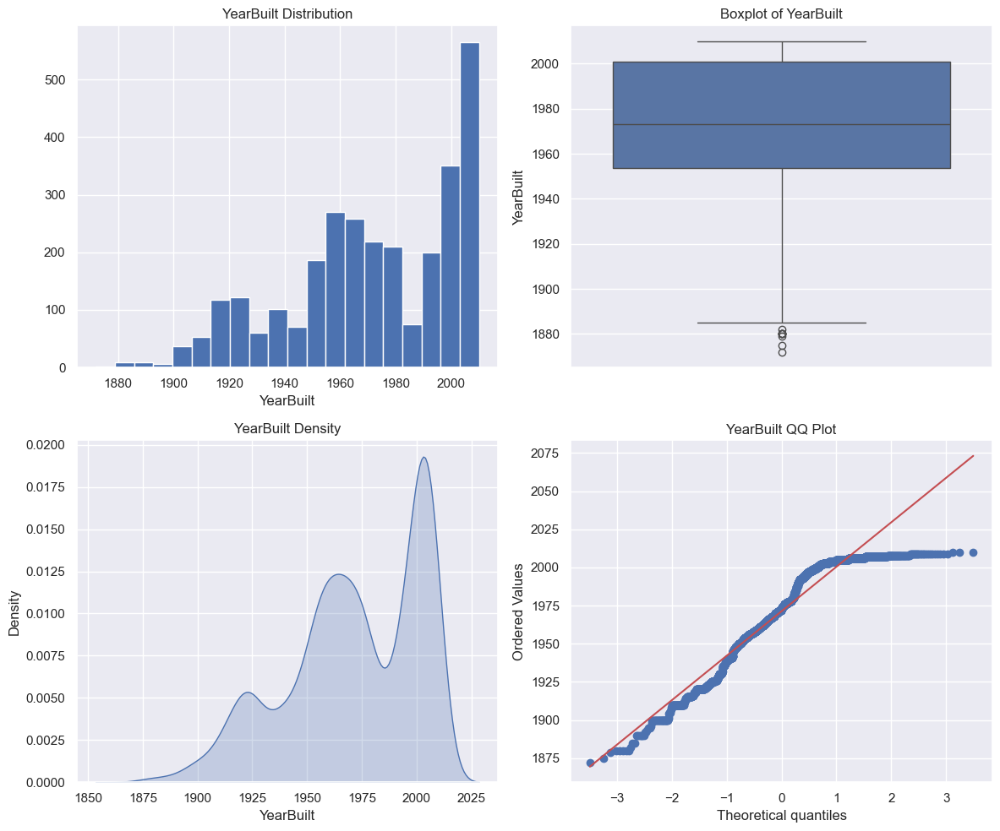

YearRemodAdd
##########################################
count   2919.000
mean    1984.264
std       20.894
min     1950.000
5%      1950.000
10%     1950.000
20%     1960.000
30%     1970.000
40%     1978.000
50%     1993.000
60%     1998.000
70%     2002.000
80%     2005.000
90%     2006.200
95%     2007.000
99%     2009.000
max     2010.000
Name: YearRemodAdd, dtype: float64
##########################################


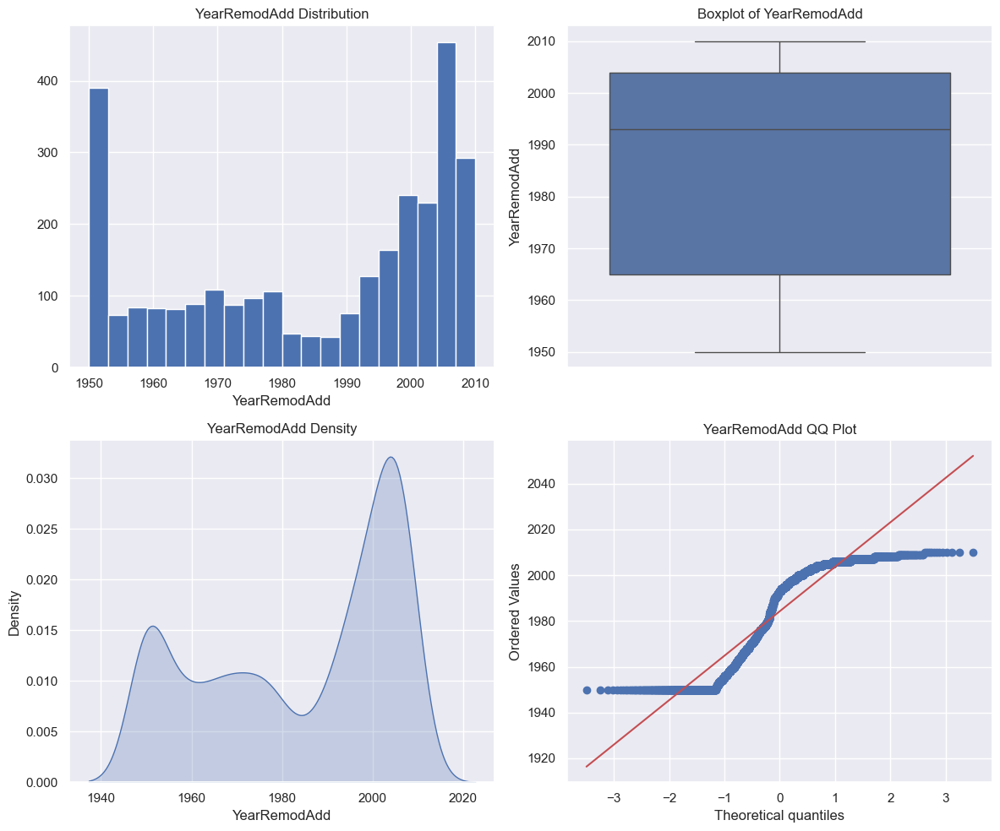

MasVnrArea
##########################################
count   2896.000
mean     102.201
std      179.334
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%      120.000
80%      202.000
90%      325.500
95%      466.500
99%      771.050
max     1600.000
Name: MasVnrArea, dtype: float64
##########################################


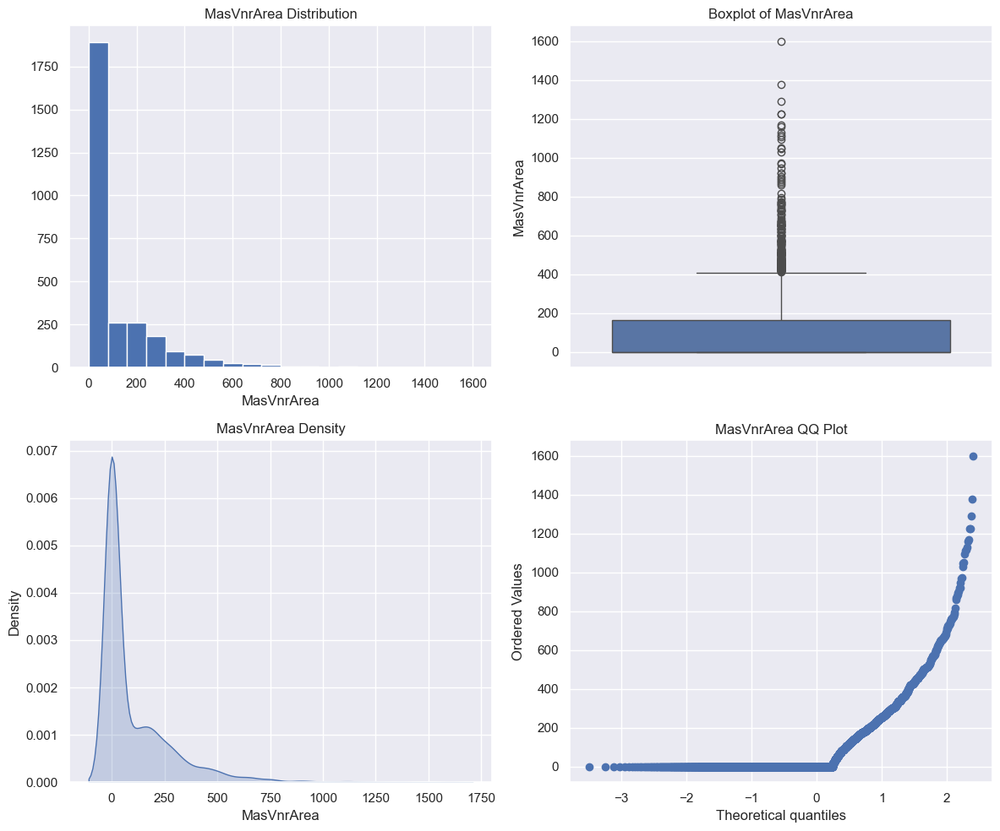

BsmtFinSF1
##########################################
count   2918.000
mean     441.423
std      455.611
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%      202.600
50%      368.500
60%      515.200
70%      656.000
80%      812.000
90%     1056.900
95%     1274.000
99%     1635.320
max     5644.000
Name: BsmtFinSF1, dtype: float64
##########################################


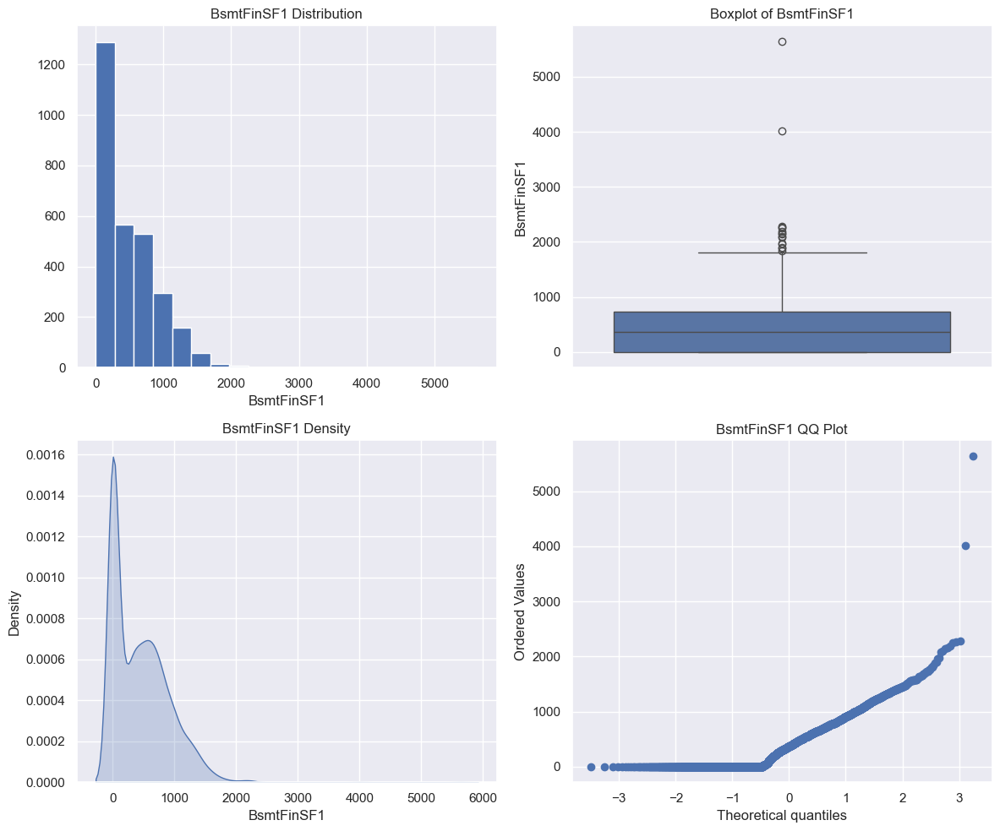

BsmtFinSF2
##########################################
count   2918.000
mean      49.582
std      169.206
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%      125.600
95%      435.000
99%      874.660
max     1526.000
Name: BsmtFinSF2, dtype: float64
##########################################


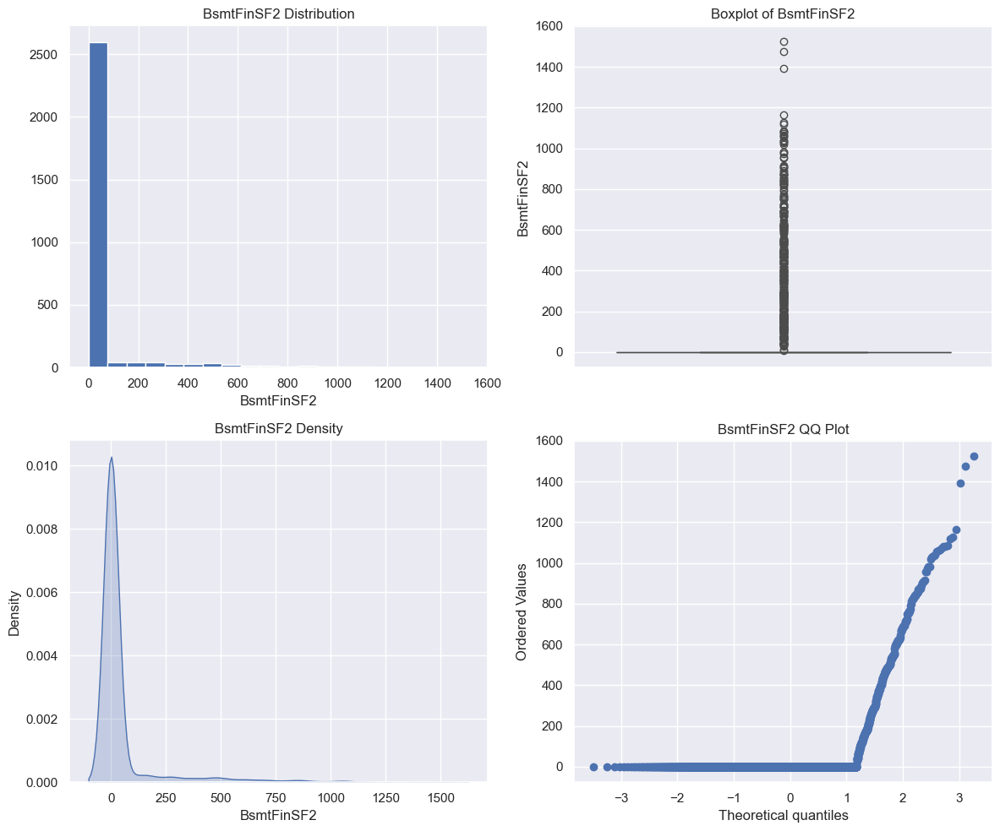

BsmtUnfSF
##########################################
count   2918.000
mean     560.772
std      439.544
min        0.000
5%         0.000
10%       56.000
20%      174.000
30%      270.000
40%      365.800
50%      467.000
60%      595.000
70%      732.000
80%      892.600
90%     1212.600
95%     1474.900
99%     1776.490
max     2336.000
Name: BsmtUnfSF, dtype: float64
##########################################


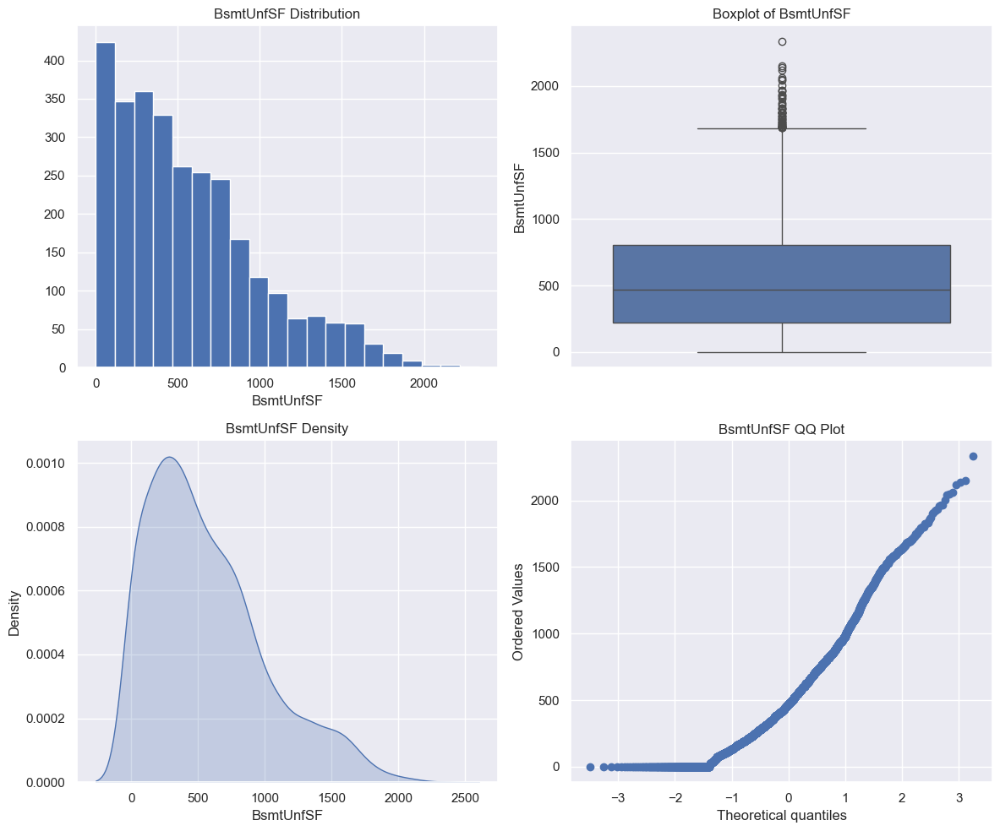

TotalBsmtSF
##########################################
count   2918.000
mean    1051.778
std      440.766
min        0.000
5%       455.250
10%      600.000
20%      741.000
30%      836.000
40%      911.000
50%      989.500
60%     1089.200
70%     1216.000
80%     1392.000
90%     1614.000
95%     1776.150
99%     2198.300
max     6110.000
Name: TotalBsmtSF, dtype: float64
##########################################


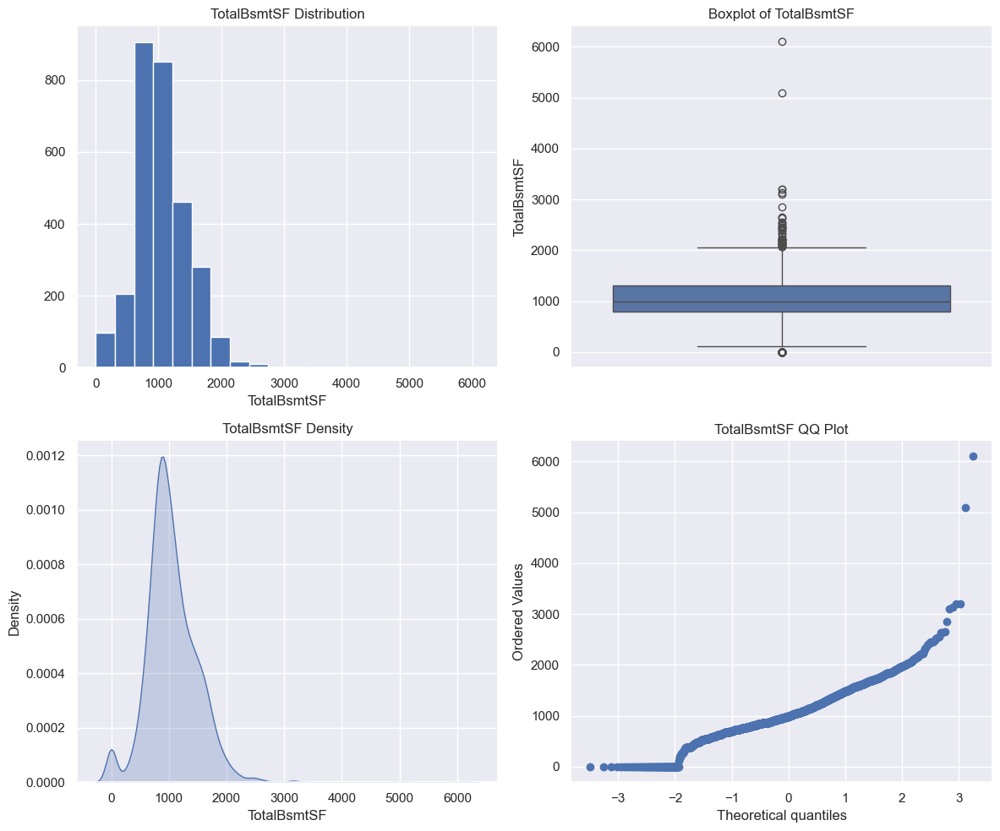

1stFlrSF
##########################################
count   2919.000
mean    1159.582
std      392.362
min      334.000
5%       665.900
10%      744.800
20%      847.000
30%      914.000
40%      996.200
50%     1082.000
60%     1180.000
70%     1314.000
80%     1483.400
90%     1675.000
95%     1830.100
99%     2288.020
max     5095.000
Name: 1stFlrSF, dtype: float64
##########################################


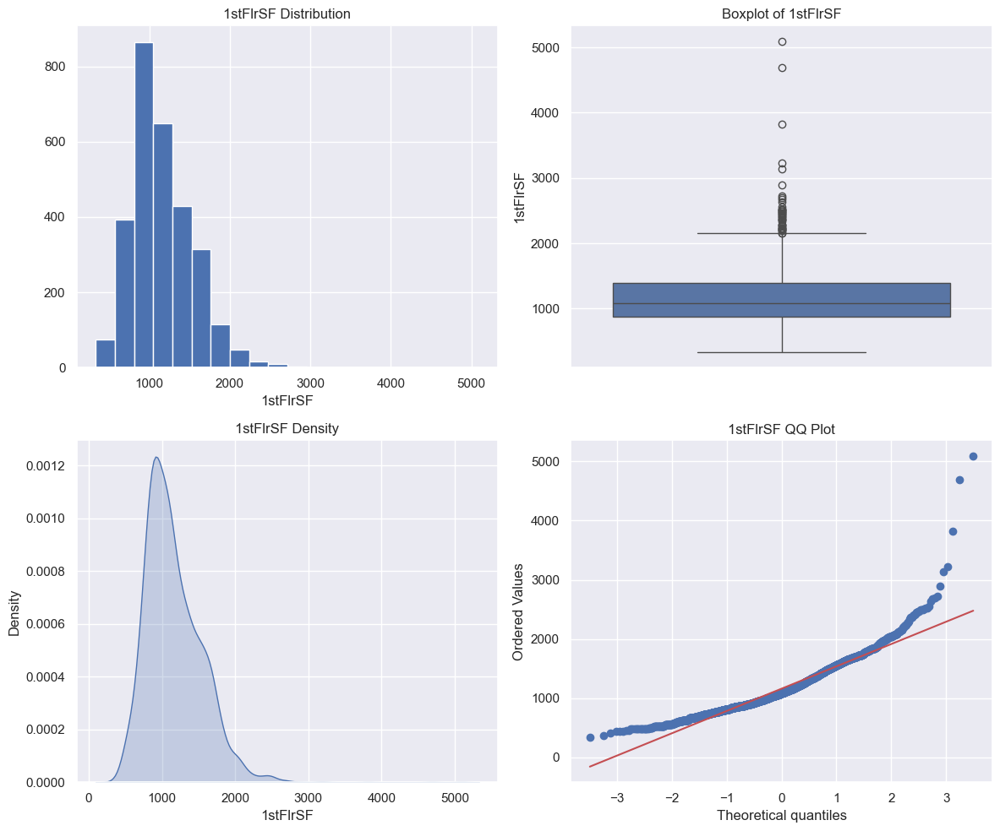

2ndFlrSF
##########################################
count   2919.000
mean     336.484
std      428.701
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%      427.400
70%      636.000
80%      770.800
90%      925.000
95%     1131.200
99%     1400.200
max     2065.000
Name: 2ndFlrSF, dtype: float64
##########################################


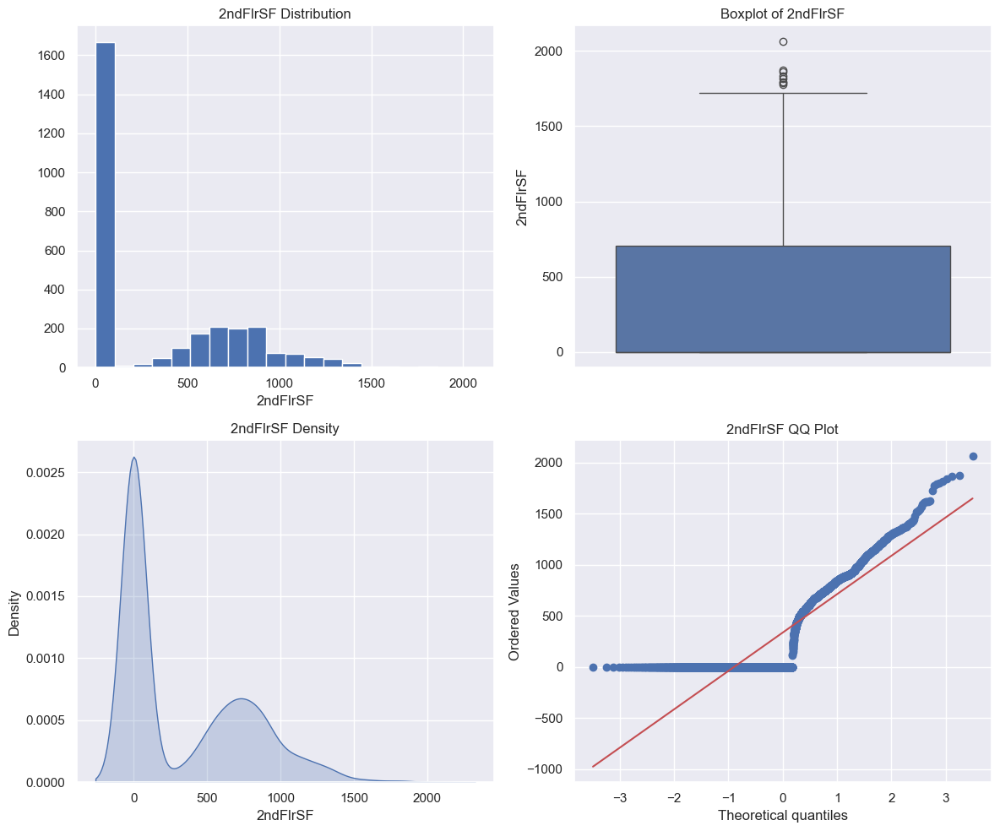

LowQualFinSF
##########################################
count   2919.000
mean       4.694
std       46.397
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%      153.840
max     1064.000
Name: LowQualFinSF, dtype: float64
##########################################


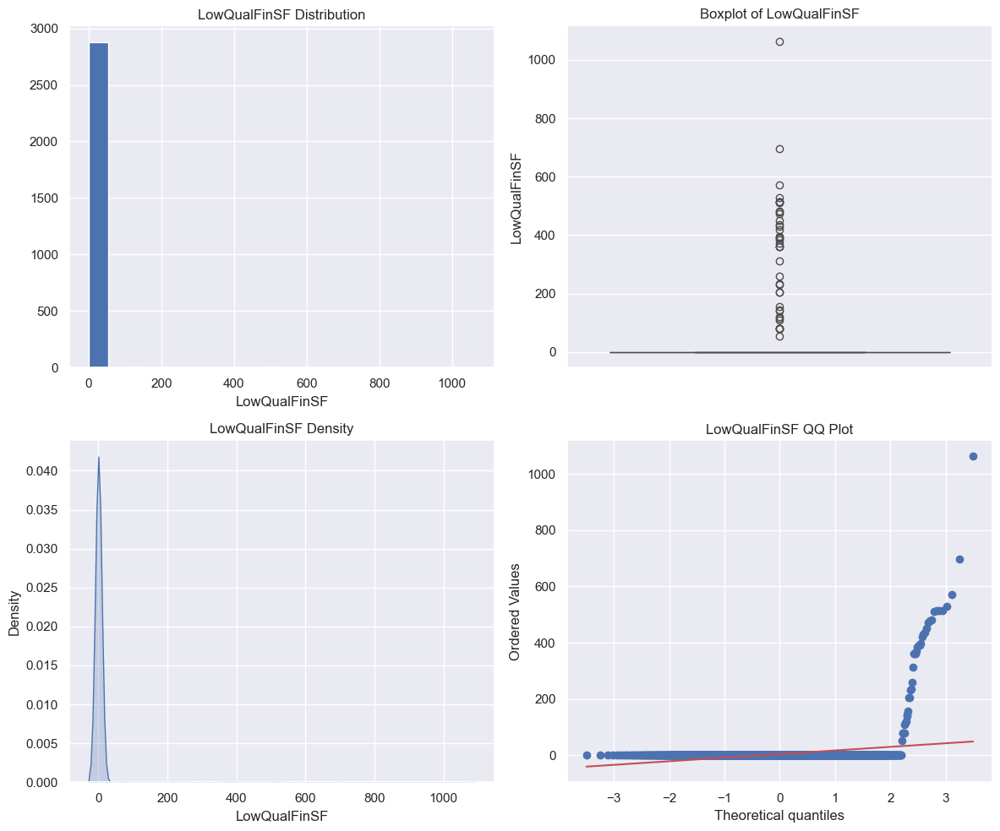

GrLivArea
##########################################
count   2919.000
mean    1500.760
std      506.051
min      334.000
5%       861.000
10%      923.800
20%     1064.600
30%     1200.000
40%     1329.200
50%     1444.000
60%     1560.000
70%     1680.000
80%     1838.400
90%     2153.200
95%     2464.200
99%     2935.720
max     5642.000
Name: GrLivArea, dtype: float64
##########################################


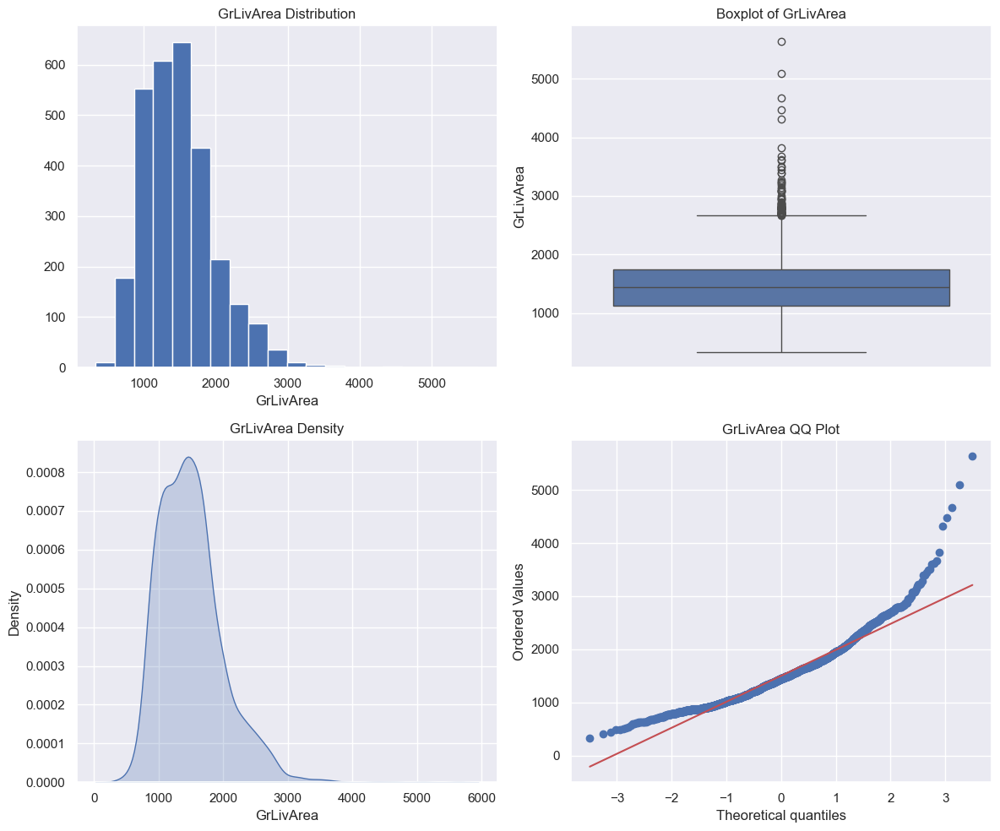

TotRmsAbvGrd
##########################################
count   2919.000
mean       6.452
std        1.569
min        2.000
5%         4.000
10%        5.000
20%        5.000
30%        6.000
40%        6.000
50%        6.000
60%        7.000
70%        7.000
80%        8.000
90%        8.000
95%        9.000
99%       11.000
max       15.000
Name: TotRmsAbvGrd, dtype: float64
##########################################


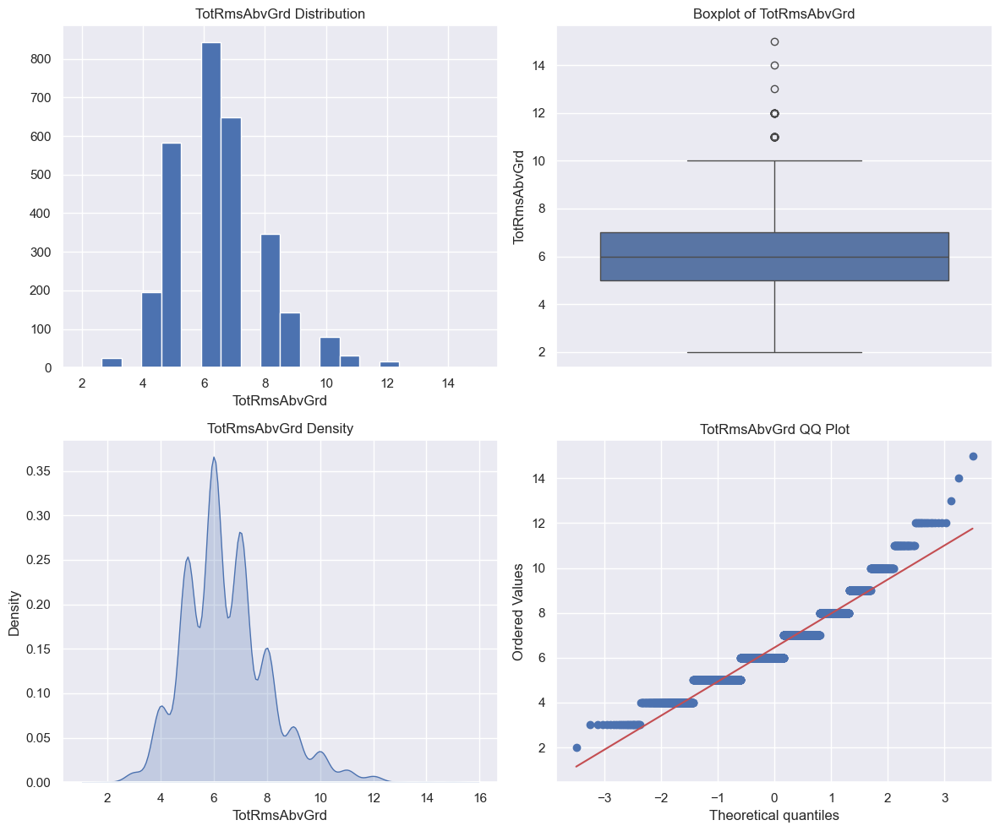

GarageYrBlt
##########################################
count   2760.000
mean    1978.113
std       25.574
min     1895.000
5%      1928.000
10%     1941.000
20%     1957.000
30%     1964.000
40%     1972.000
50%     1979.000
60%     1993.000
70%     1999.000
80%     2004.000
90%     2006.000
95%     2007.000
99%     2009.000
max     2207.000
Name: GarageYrBlt, dtype: float64
##########################################


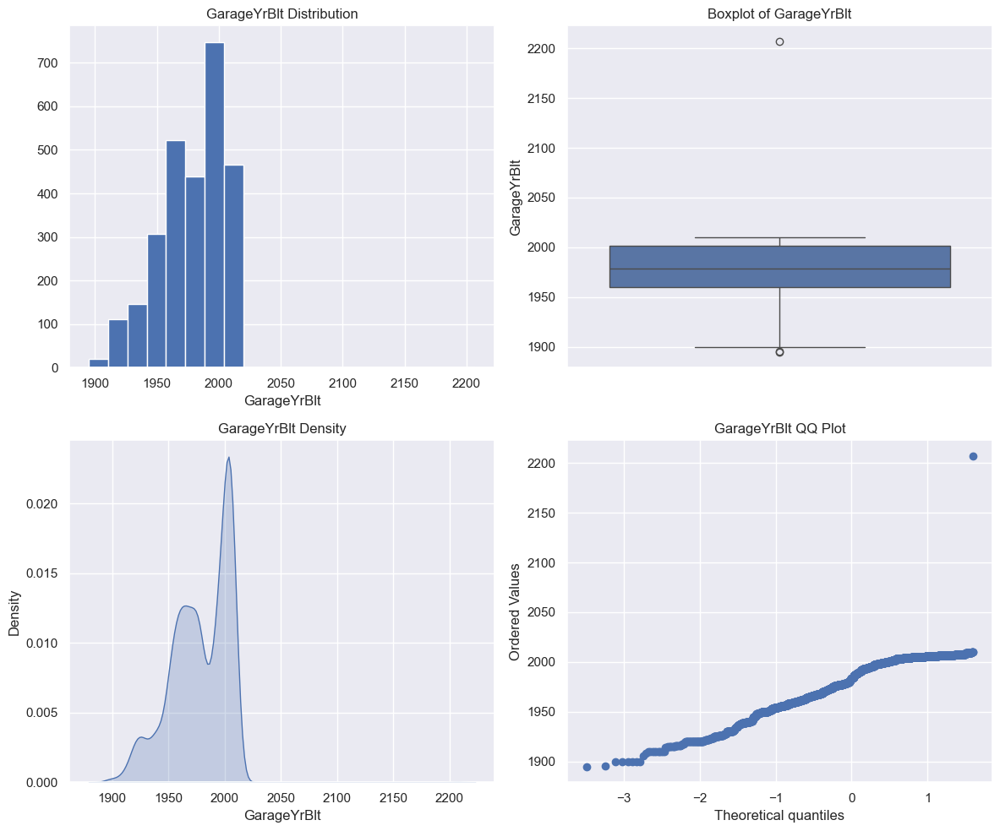

GarageArea
##########################################
count   2918.000
mean     472.875
std      215.395
min        0.000
5%         0.000
10%      240.000
20%      296.000
30%      379.000
40%      440.000
50%      480.000
60%      513.000
70%      560.900
80%      621.000
90%      758.000
95%      856.150
99%     1019.490
max     1488.000
Name: GarageArea, dtype: float64
##########################################


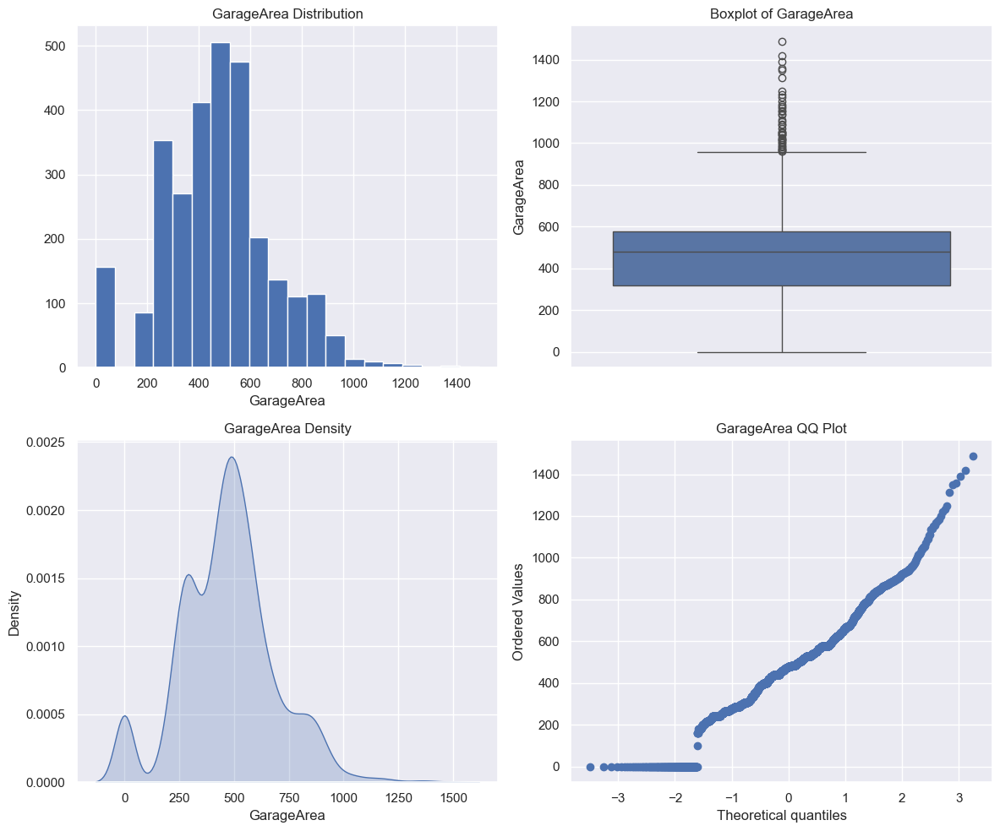

WoodDeckSF
##########################################
count   2919.000
mean      93.710
std      126.527
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%      100.000
70%      144.000
80%      192.000
90%      257.000
95%      328.000
99%      500.820
max     1424.000
Name: WoodDeckSF, dtype: float64
##########################################


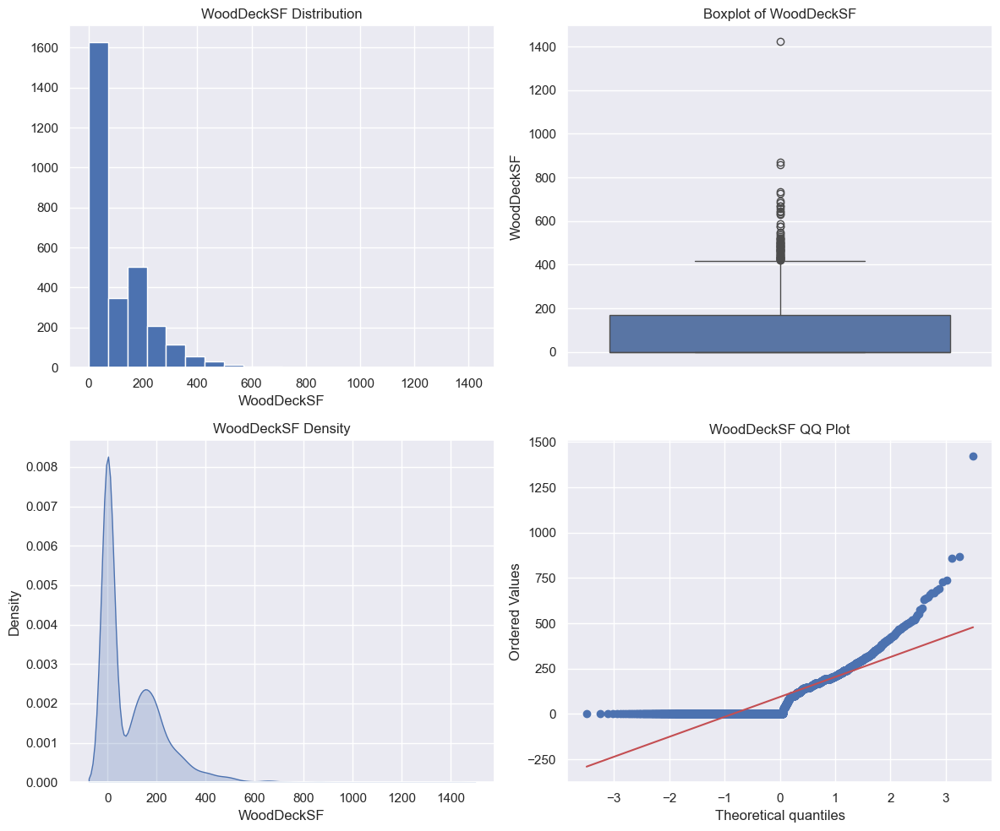

OpenPorchSF
##########################################
count   2919.000
mean      47.487
std       67.575
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%       26.000
60%       40.000
70%       58.000
80%       85.000
90%      131.200
95%      183.100
99%      284.460
max      742.000
Name: OpenPorchSF, dtype: float64
##########################################


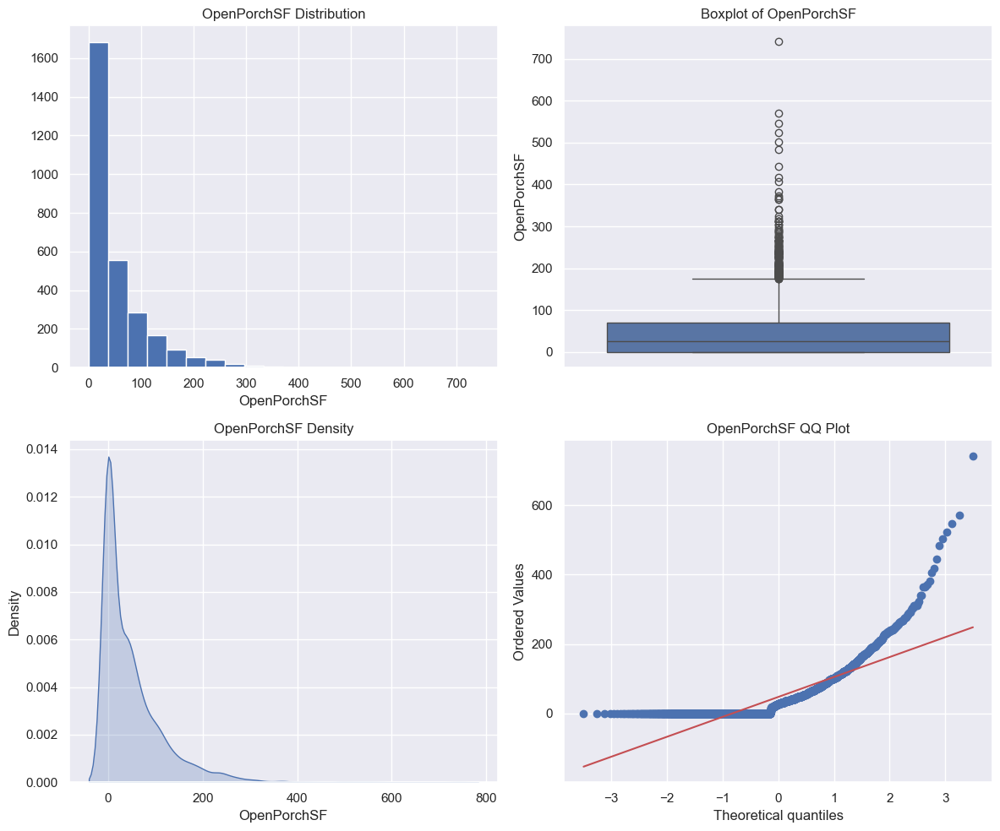

EnclosedPorch
##########################################
count   2919.000
mean      23.098
std       64.244
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%      112.000
95%      176.000
99%      264.000
max     1012.000
Name: EnclosedPorch, dtype: float64
##########################################


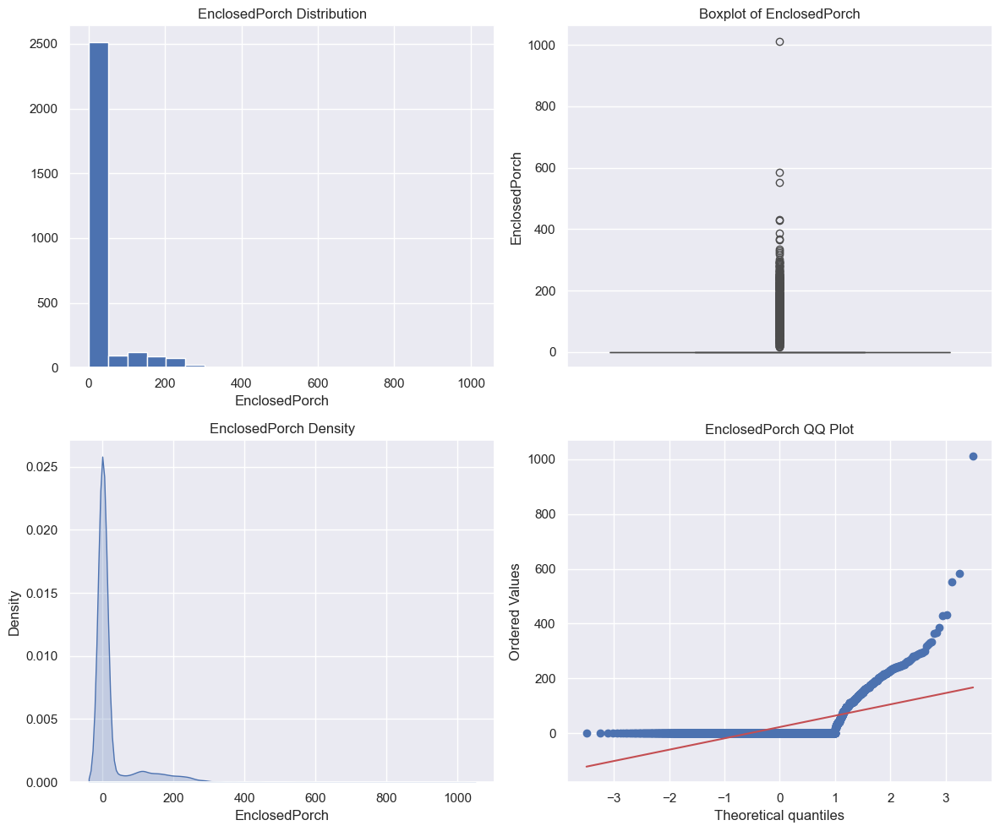

3SsnPorch
##########################################
count   2919.000
mean       2.602
std       25.188
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%      144.000
max      508.000
Name: 3SsnPorch, dtype: float64
##########################################


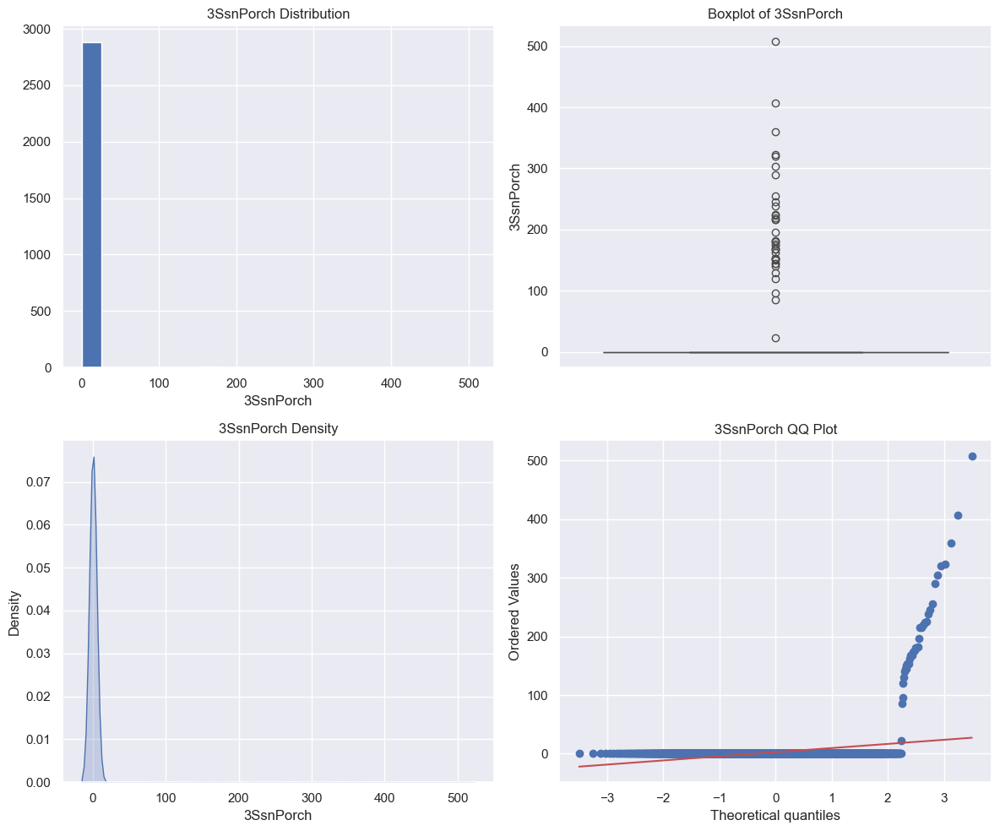

ScreenPorch
##########################################
count   2919.000
mean      16.062
std       56.184
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%      161.000
99%      259.820
max      576.000
Name: ScreenPorch, dtype: float64
##########################################


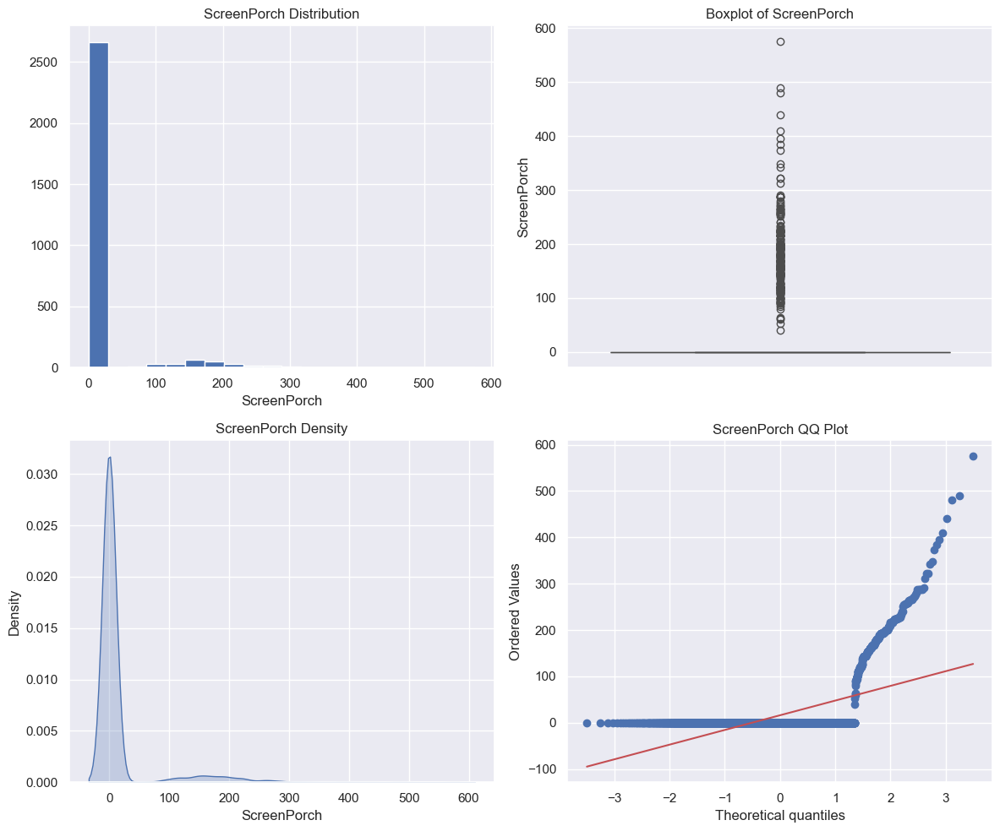

PoolArea
##########################################
count   2919.000
mean       2.252
std       35.664
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%        0.000
max      800.000
Name: PoolArea, dtype: float64
##########################################


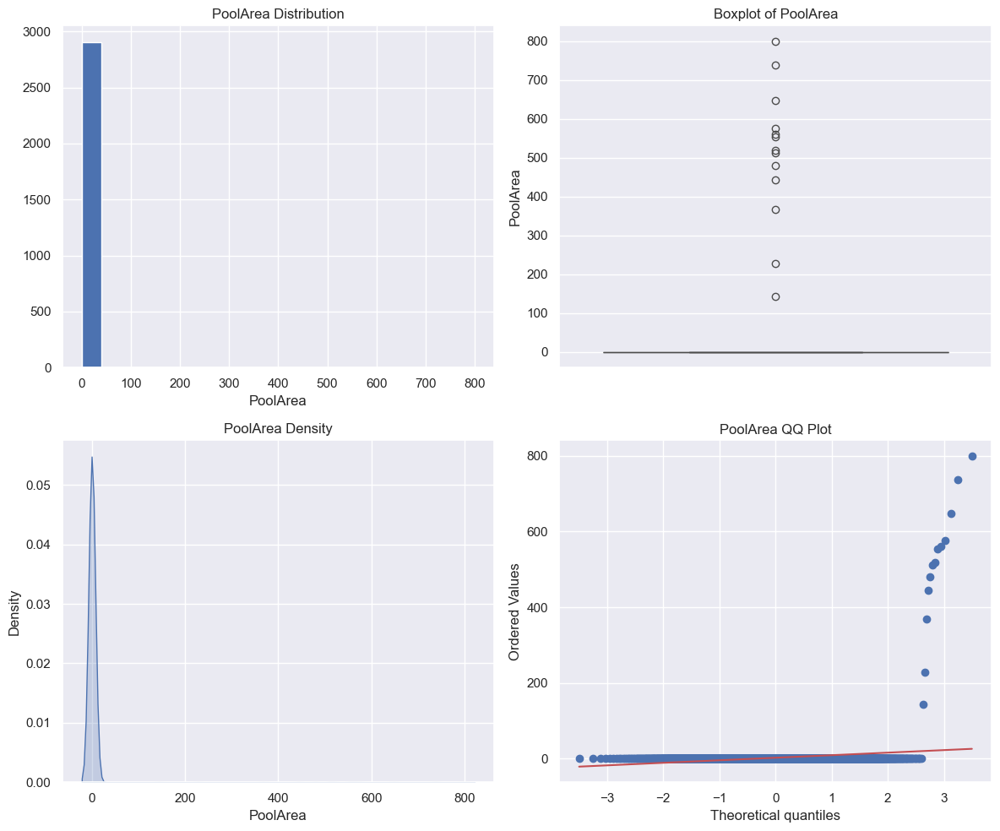

MiscVal
##########################################
count    2919.000
mean       50.826
std       567.402
min         0.000
5%          0.000
10%         0.000
20%         0.000
30%         0.000
40%         0.000
50%         0.000
60%         0.000
70%         0.000
80%         0.000
90%         0.000
95%         0.000
99%       982.000
max     17000.000
Name: MiscVal, dtype: float64
##########################################


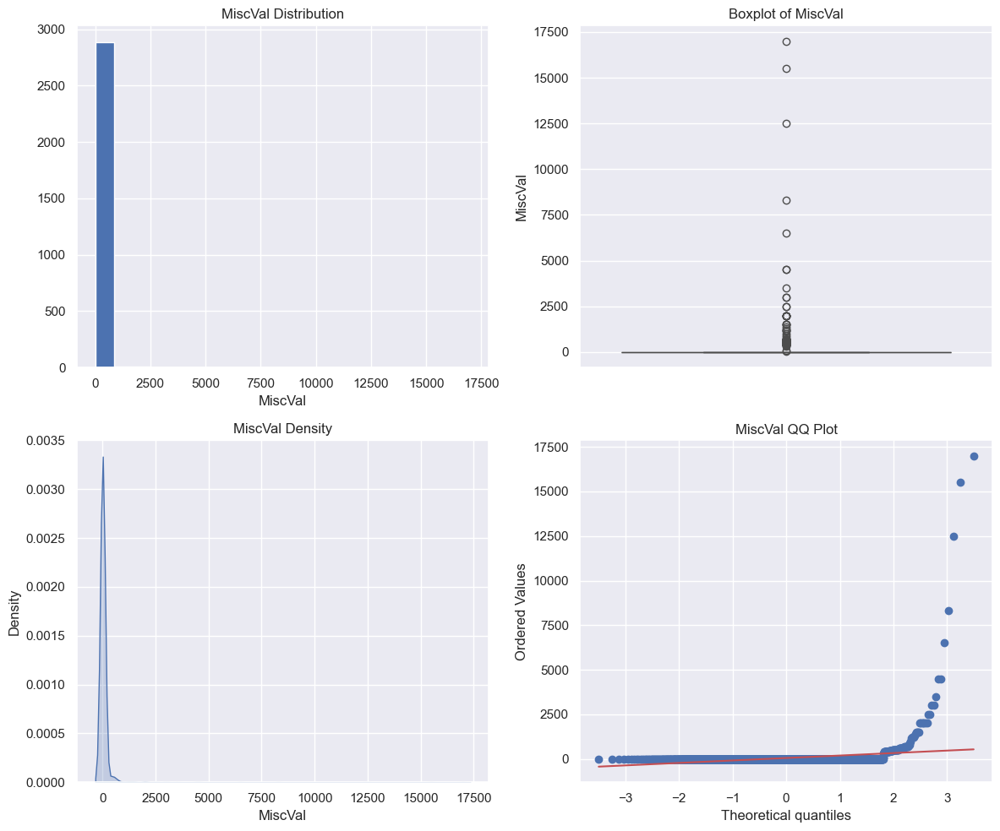

MoSold
##########################################
count   2919.000
mean       6.213
std        2.715
min        1.000
5%         2.000
10%        3.000
20%        4.000
30%        5.000
40%        6.000
50%        6.000
60%        7.000
70%        7.000
80%        8.000
90%       10.000
95%       11.000
99%       12.000
max       12.000
Name: MoSold, dtype: float64
##########################################


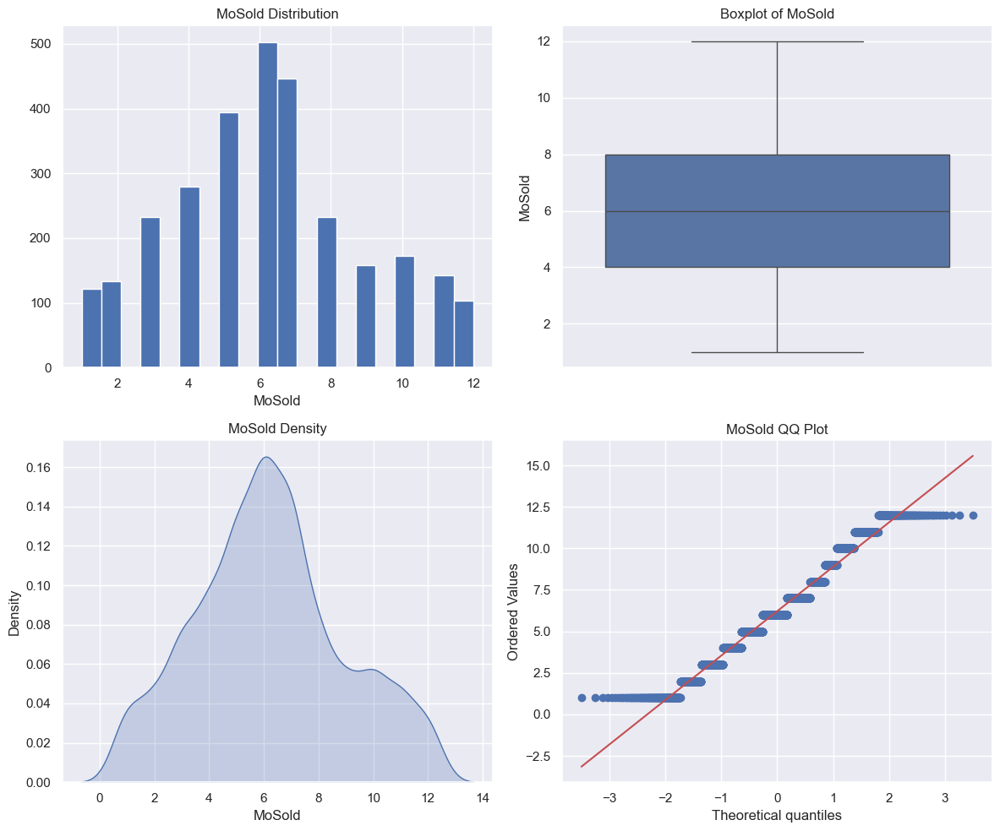

In [20]:
for col in num_cols:
    num_summary(df, col, plot=True)

In [21]:
def target_summary_with_cat(dataframe, target, categorical_col, plot=False):
    summary = pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean(),
                            "TARGET_COUNT": dataframe.groupby(categorical_col)[target].count(),
                            "RATIO": 100 * dataframe[categorical_col].value_counts() / len(dataframe)})
    
    print(summary, end="\n\n\n")
    print("##########################################")

    if plot:
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
        
        # TARGET_MEAN
        summary["TARGET_MEAN"].plot(kind="bar", ax=ax1)
        ax1.set_title(f"TARGET_MEAN by {categorical_col}")
        ax1.set_ylabel("TARGET_MEAN")
        ax1.tick_params(axis="x", rotation=45)
        
        # TARGET_COUNT
        sns.countplot(x=categorical_col, data=dataframe, ax=ax2)
        ax2.set_title(f"Frequency of {categorical_col}")
        ax2.set_ylabel("TARGET_COUNT")
        ax2.tick_params(axis="x", rotation=45)
        
        # RATIO
        values = dataframe[categorical_col].value_counts()
        ax3.pie(x=values, labels=values.index, autopct="%1.1f%%", startangle=90)
        ax3.set_title(f"RATIO by {categorical_col}")
        ax3.legend(labels=[f"{index} - {value/sum(values)*100:.2f}%" for index, value in zip(values.index, values)],
                   loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
        
        plt.tight_layout()
        plt.show(block=True)

In [22]:
def target_summary_with_num(dataframe, target, numerical_col, bins=10):
    df = dataframe.copy()
    
    summary_df = df.groupby(target).agg({numerical_col: "mean"})

    df["binned"] = pd.cut(df[numerical_col], bins=bins)
    binned_summary_df = df.groupby("binned").agg({target: "mean"})

    return binned_summary_df, numerical_col

          TARGET_MEAN  TARGET_COUNT  RATIO
MSZoning                                  
C (all)     74528.000            10  0.856
FV         214014.062            65  4.762
RH         131558.375            16  0.891
RL         191004.995          1151 77.595
RM         126316.830           218 15.759


##########################################


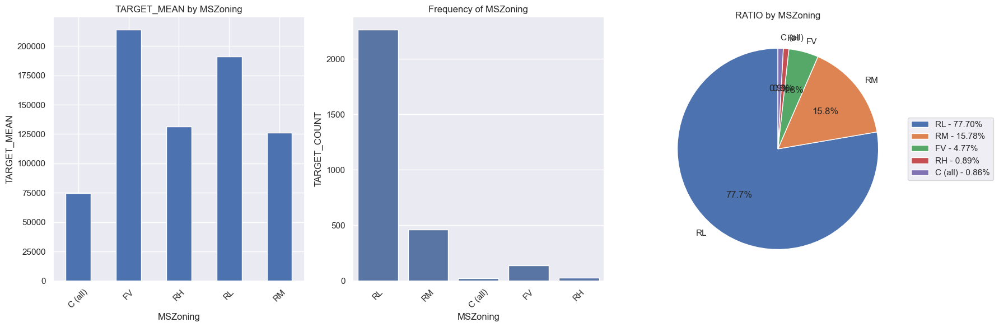

        TARGET_MEAN  TARGET_COUNT  RATIO
Street                                  
Grvl     130190.500             6  0.411
Pave     181130.539          1454 99.589


##########################################


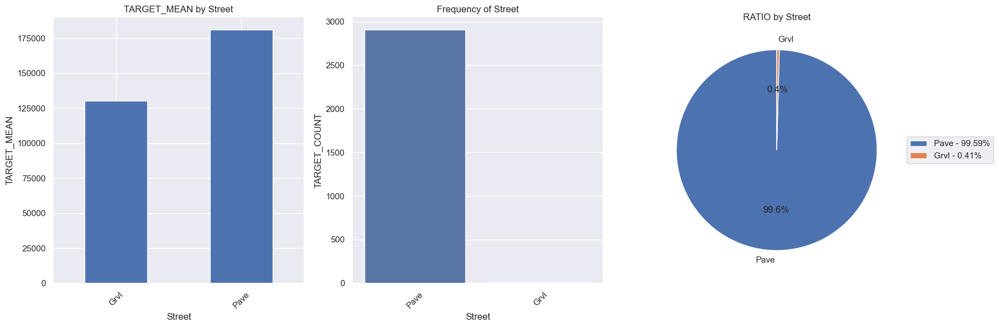

       TARGET_MEAN  TARGET_COUNT  RATIO
Alley                                  
Grvl    122219.080            50  4.111
Pave    168000.585            41  2.672


##########################################


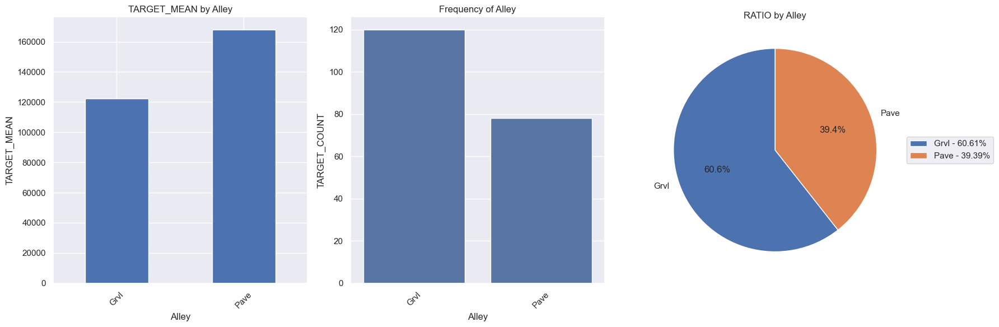

          TARGET_MEAN  TARGET_COUNT  RATIO
LotShape                                  
IR1        206101.665           484 33.162
IR2        239833.366            41  2.604
IR3        216036.500            10  0.548
Reg        164754.818           925 63.686


##########################################


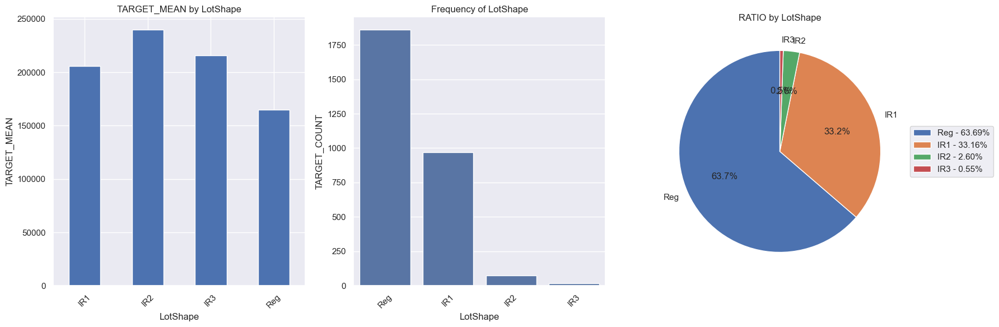

             TARGET_MEAN  TARGET_COUNT  RATIO
LandContour                                  
Bnk           143104.079            63  4.008
HLS           231533.940            50  4.111
Low           203661.111            36  2.055
Lvl           180183.747          1311 89.825


##########################################


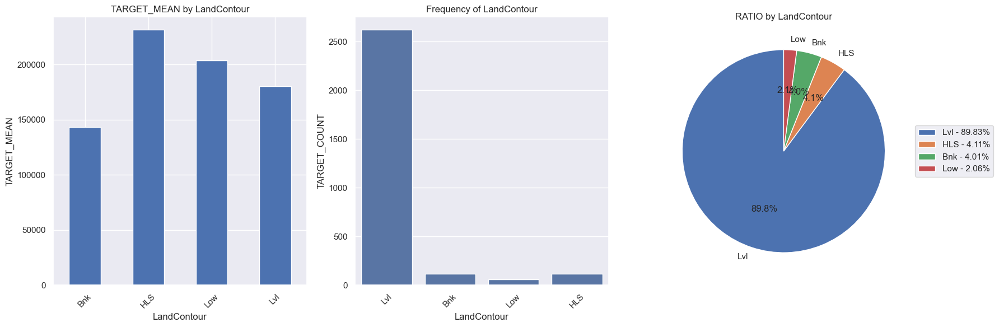

           TARGET_MEAN  TARGET_COUNT  RATIO
Utilities                                  
AllPub      180950.957          1459 99.897
NoSeWa      137500.000             1  0.034


##########################################


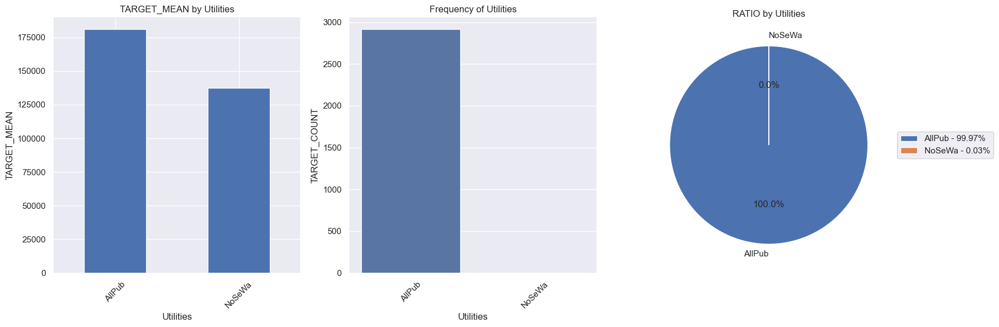

           TARGET_MEAN  TARGET_COUNT  RATIO
LotConfig                                  
Corner      181623.426           263 17.506
CulDSac     223854.617            94  6.029
FR2         177934.574            47  2.912
FR3         208475.000             4  0.480
Inside      176938.048          1052 73.073


##########################################


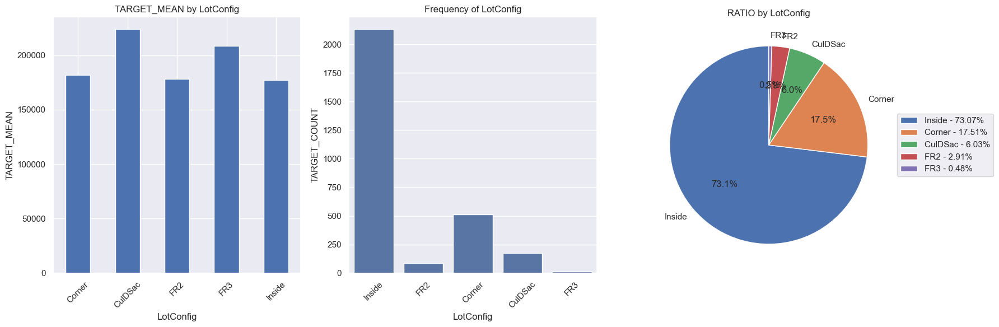

           TARGET_MEAN  TARGET_COUNT  RATIO
LandSlope                                  
Gtl         179956.800          1382 95.170
Mod         196734.138            65  4.282
Sev         204379.231            13  0.548


##########################################


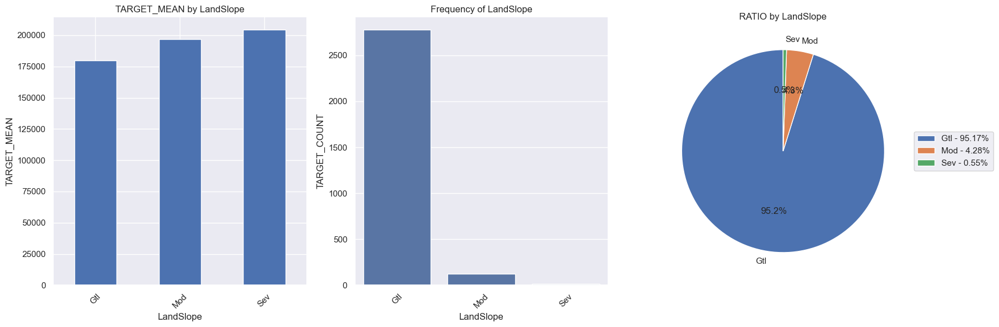

              TARGET_MEAN  TARGET_COUNT  RATIO
Neighborhood                                  
Blmngtn        194870.882            17  0.959
Blueste        137500.000             2  0.343
BrDale         104493.750            16  1.028
BrkSide        124834.052            58  3.700
ClearCr        212565.429            28  1.507
CollgCr        197965.773           150  9.147
Crawfor        210624.725            51  3.529
Edwards        128219.700           100  6.646
Gilbert        192854.506            79  5.653
IDOTRR         100123.784            37  3.186
MeadowV         98576.471            17  1.268
Mitchel        156270.122            49  3.905
NAmes          145847.080           225 15.176
NPkVill        142694.444             9  0.788
NWAmes         189050.068            73  4.488
NoRidge        335295.317            41  2.432
NridgHt        316270.623            77  5.687
OldTown        128225.301           113  8.188
SWISU          142591.360            25  1.644
Sawyer       

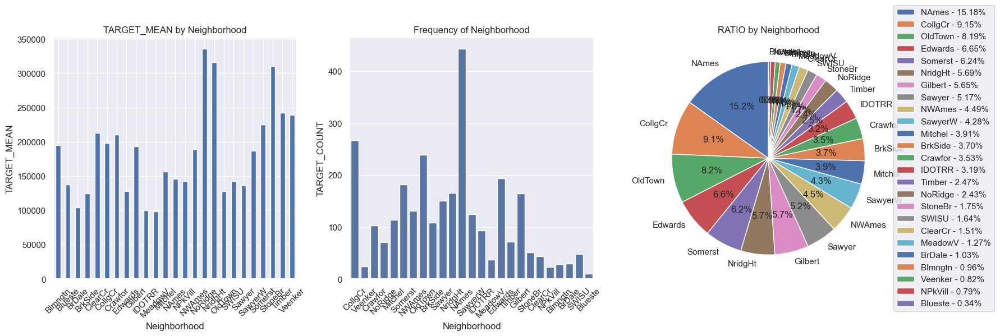

            TARGET_MEAN  TARGET_COUNT  RATIO
Condition1                                  
Artery       135091.667            48  3.152
Feedr        142475.481            81  5.618
Norm         184495.492          1260 86.023
PosA         225875.000             8  0.685
PosN         215184.211            19  1.336
RRAe         138400.000            11  0.959
RRAn         184396.615            26  1.713
RRNe         190750.000             2  0.206
RRNn         212400.000             5  0.308


##########################################


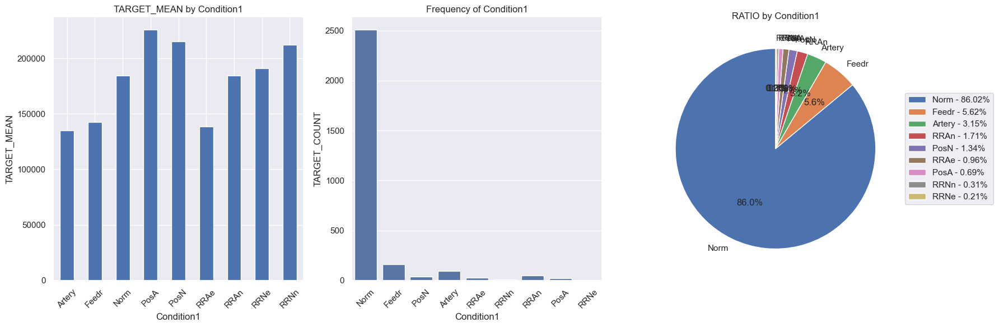

            TARGET_MEAN  TARGET_COUNT  RATIO
Condition2                                  
Artery       106500.000             2  0.171
Feedr        121166.667             6  0.445
Norm         181169.406          1445 98.972
PosA         325000.000             1  0.137
PosN         284875.000             2  0.137
RRAe         190000.000             1  0.034
RRAn         136905.000             1  0.034
RRNn          96750.000             2  0.069


##########################################


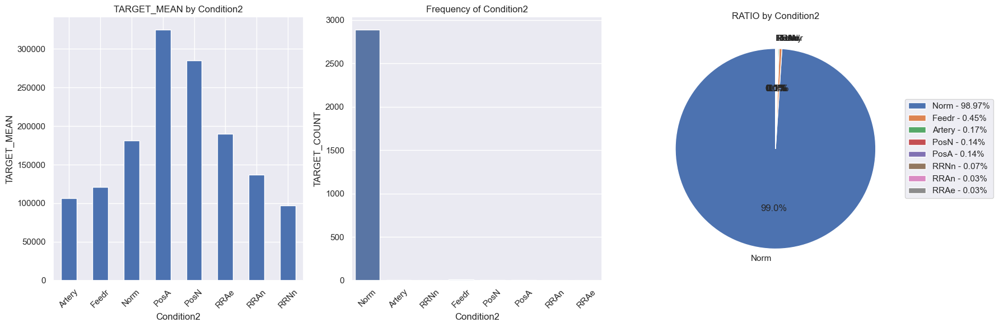

          TARGET_MEAN  TARGET_COUNT  RATIO
BldgType                                  
1Fam       185763.807          1220 83.076
2fmCon     128432.258            31  2.124
Duplex     133541.077            52  3.734
Twnhs      135911.628            43  3.289
TwnhsE     181959.342           114  7.777


##########################################


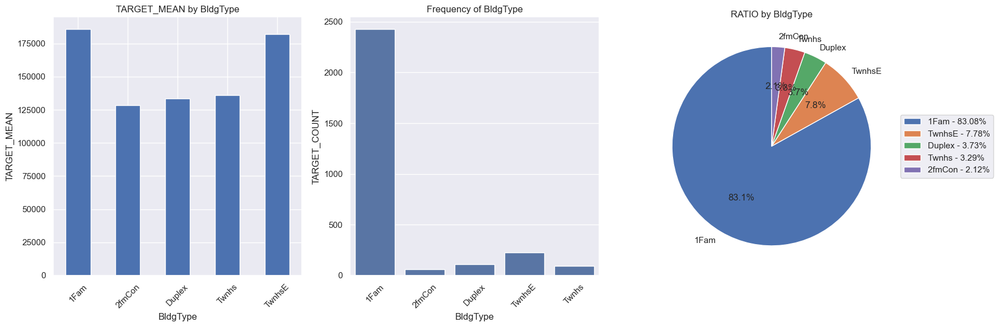

            TARGET_MEAN  TARGET_COUNT  RATIO
HouseStyle                                  
1.5Fin       143116.740           154 10.757
1.5Unf       110150.000            14  0.651
1Story       175985.478           726 50.394
2.5Fin       220000.000             8  0.274
2.5Unf       157354.545            11  0.822
2Story       210051.764           445 29.873
SFoyer       135074.486            37  2.843
SLvl         166703.385            65  4.385


##########################################


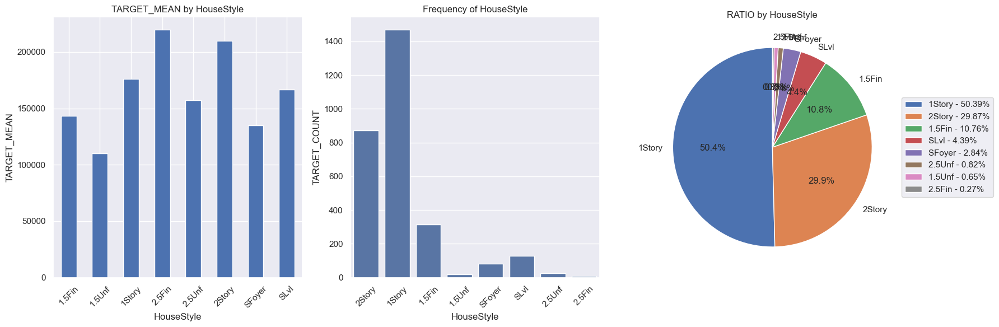

           TARGET_MEAN  TARGET_COUNT  RATIO
RoofStyle                                  
Flat        194690.000            13  0.685
Gable       171483.956          1141 79.137
Gambrel     148909.091            11  0.754
Hip         218876.934           286 18.876
Mansard     180568.429             7  0.377
Shed        225000.000             2  0.171


##########################################


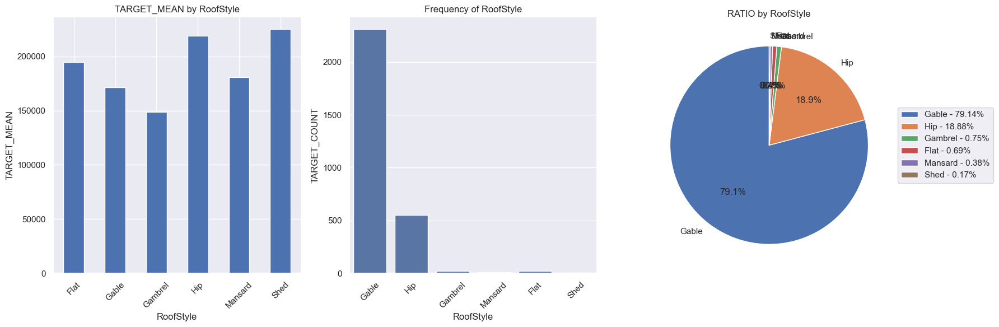

          TARGET_MEAN  TARGET_COUNT  RATIO
RoofMatl                                  
ClyTile    160000.000             1  0.034
CompShg    179803.679          1434 98.527
Membran    241500.000             1  0.034
Metal      180000.000             1  0.034
Roll       137000.000             1  0.034
Tar&Grv    185406.364            11  0.788
WdShake    241400.000             5  0.308
WdShngl    390250.000             6  0.240


##########################################


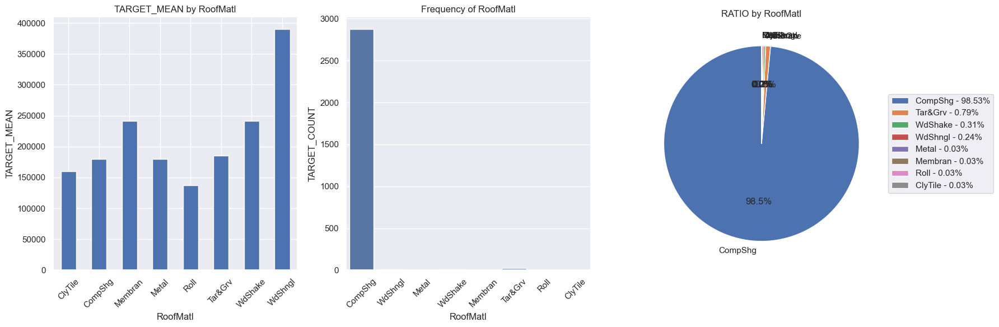

             TARGET_MEAN  TARGET_COUNT  RATIO
Exterior1st                                  
AsbShng       107385.550            20  1.507
AsphShn       100000.000             1  0.069
BrkComm        71000.000             2  0.206
BrkFace       194573.000            50  2.980
CBlock        105000.000             1  0.069
CemntBd       231690.656            61  4.317
HdBoard       163077.450           222 15.142
ImStucc       262000.000             1  0.034
MetalSd       149422.177           220 15.416
Plywood       175942.380           108  7.571
Stone         258500.000             2  0.069
Stucco        162990.000            25  1.473
VinylSd       213732.901           515 35.115
Wd Sdng       149841.646           206 14.080
WdShing       150655.077            26  1.918


##########################################


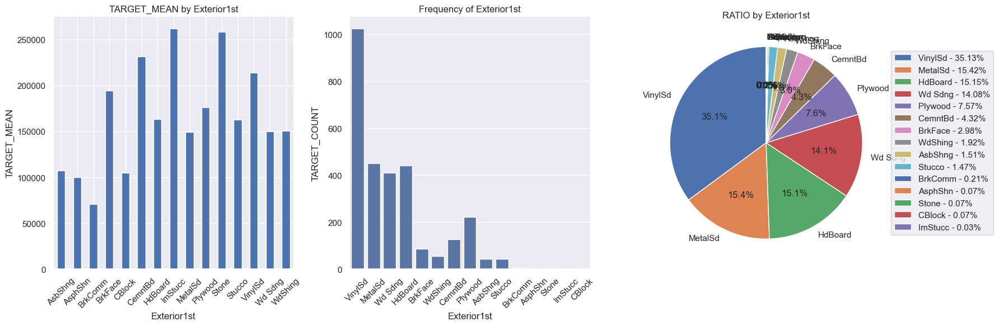

             TARGET_MEAN  TARGET_COUNT  RATIO
Exterior2nd                                  
AsbShng       114060.550            20  1.302
AsphShn       138000.000             3  0.137
Brk Cmn       126714.286             7  0.754
BrkFace       195818.000            25  1.610
CBlock        105000.000             1  0.103
CmentBd       230093.833            60  4.317
HdBoard       167661.565           207 13.909
ImStucc       252070.000            10  0.514
MetalSd       149803.173           214 15.313
Other         319000.000             1  0.034
Plywood       168112.387           142  9.250
Stone         158224.800             5  0.206
Stucco        155905.154            26  1.610
VinylSd       214432.460           504 34.738
Wd Sdng       148386.066           197 13.395
Wd Shng       161328.947            38  2.775


##########################################


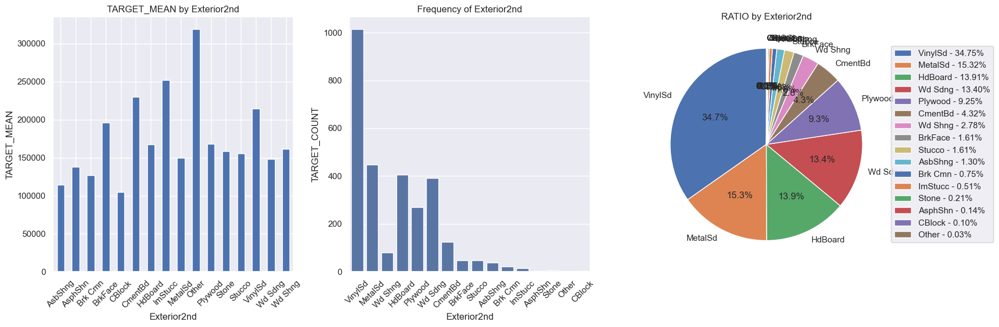

            TARGET_MEAN  TARGET_COUNT  RATIO
MasVnrType                                  
BrkCmn       146318.067            15  0.856
BrkFace      204691.872           445 30.113
Stone        265583.625           128  8.530


##########################################


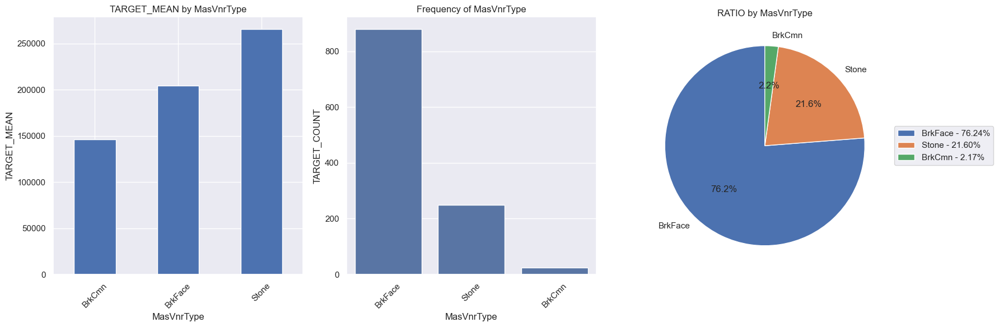

           TARGET_MEAN  TARGET_COUNT  RATIO
ExterQual                                  
Ex          367360.962            52  3.666
Fa           87985.214            14  1.199
Gd          231633.510           488 33.539
TA          144341.313           906 61.596


##########################################


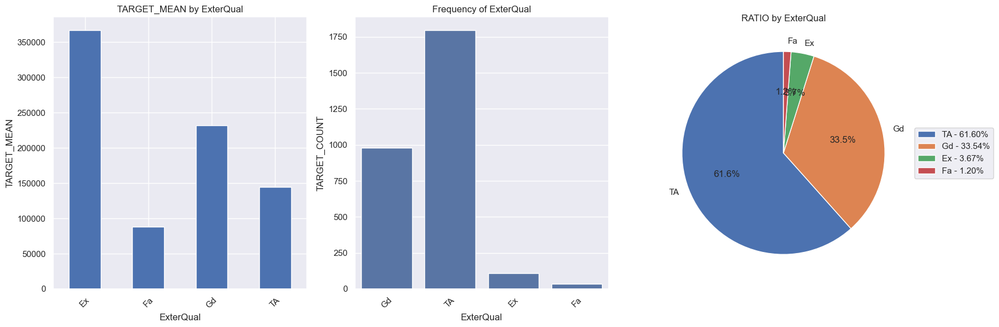

           TARGET_MEAN  TARGET_COUNT  RATIO
ExterCond                                  
Ex          201333.333             3  0.411
Fa          102595.143            28  2.295
Gd          168897.568           146 10.243
Po           76500.000             1  0.103
TA          184034.896          1282 86.948


##########################################


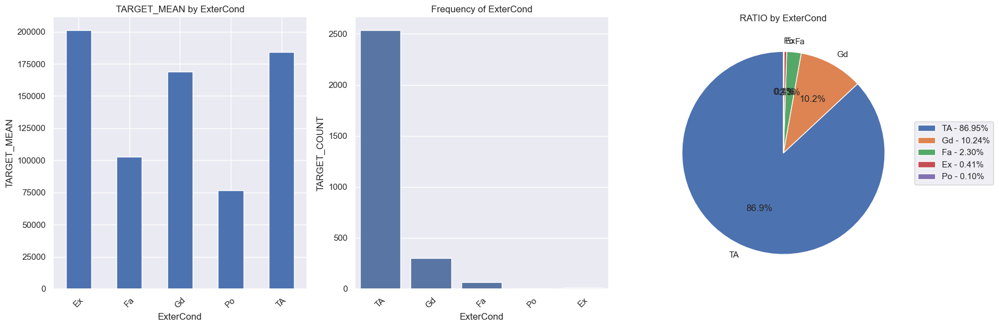

            TARGET_MEAN  TARGET_COUNT  RATIO
Foundation                                  
BrkTil       132291.075           146 10.654
CBlock       149805.715           634 42.309
PConc        225230.442           647 44.810
Slab         107365.625            24  1.679
Stone        165959.167             6  0.377
Wood         185666.667             3  0.171


##########################################


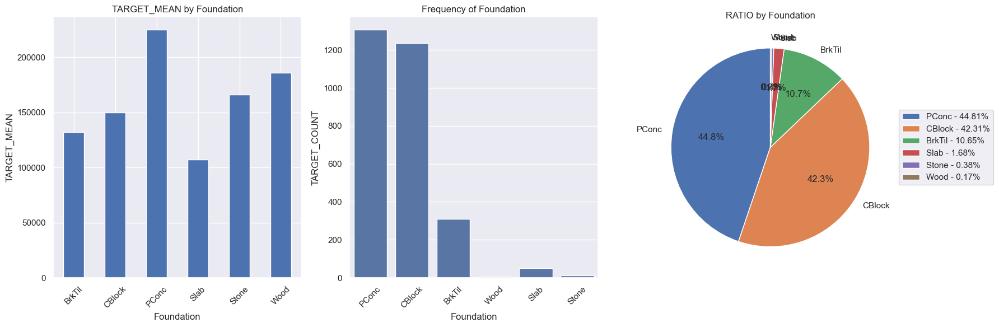

          TARGET_MEAN  TARGET_COUNT  RATIO
BsmtQual                                  
Ex         327041.041           121  8.839
Fa         115692.029            35  3.015
Gd         202688.479           618 41.418
TA         140759.818           649 43.953


##########################################


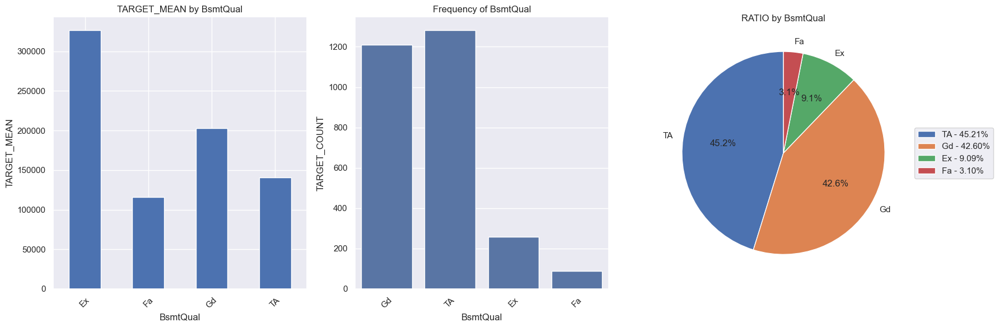

          TARGET_MEAN  TARGET_COUNT  RATIO
BsmtCond                                  
Fa         121809.533            45  3.563
Gd         213599.908            65  4.180
Po          64000.000             2  0.171
TA         183632.621          1311 89.277


##########################################


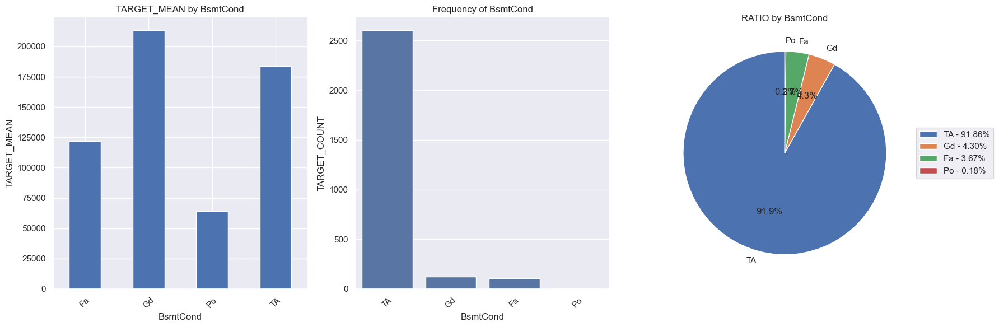

              TARGET_MEAN  TARGET_COUNT  RATIO
BsmtExposure                                  
Av             206643.421           221 14.320
Gd             257689.806           134  9.455
Mn             192789.658           114  8.188
No             165652.296           953 65.228


##########################################


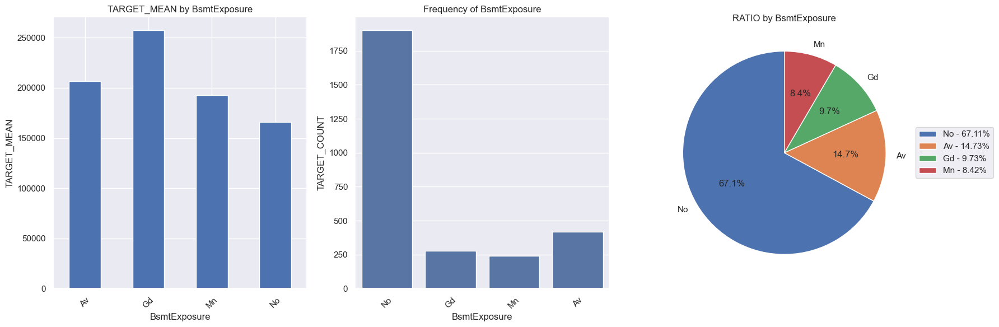

              TARGET_MEAN  TARGET_COUNT  RATIO
BsmtFinType1                                  
ALQ            161573.068           220 14.697
BLQ            149493.655           148  9.215
GLQ            235413.720           418 29.085
LwQ            151852.703            74  5.276
Rec            146889.248           133  9.866
Unf            170670.577           430 29.154


##########################################


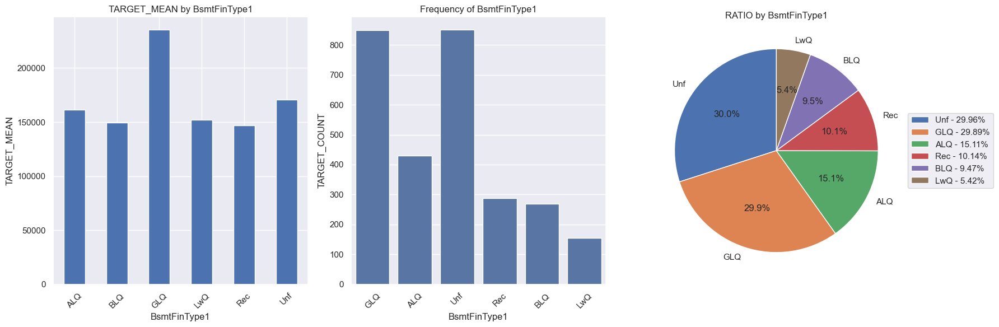

              TARGET_MEAN  TARGET_COUNT  RATIO
BsmtFinType2                                  
ALQ            209942.105            19  1.781
BLQ            151101.000            33  2.330
GLQ            180982.143            14  1.165
LwQ            164364.130            46  2.980
Rec            164917.130            54  3.597
Unf            184694.690          1256 85.406


##########################################


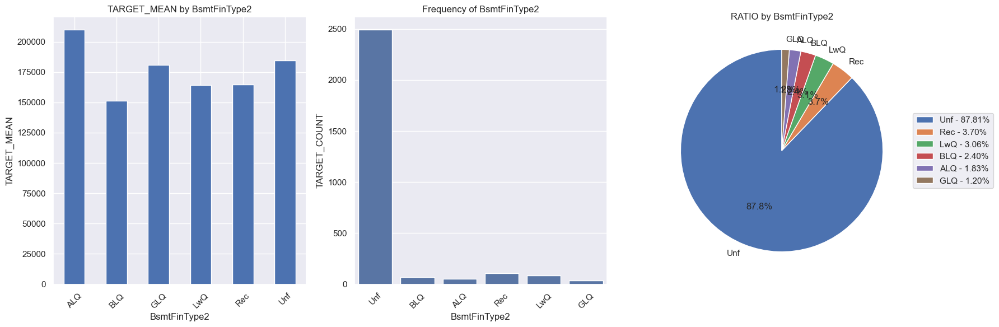

         TARGET_MEAN  TARGET_COUNT  RATIO
Heating                                  
Floor      72500.000             1  0.034
GasA      182021.195          1428 98.458
GasW      166632.167            18  0.925
Grav       75271.429             7  0.308
OthW      125750.000             2  0.069
Wall       92100.000             4  0.206


##########################################


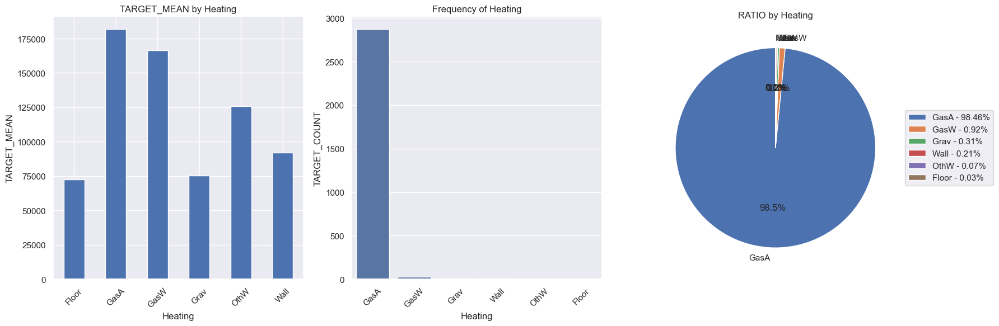

           TARGET_MEAN  TARGET_COUNT  RATIO
HeatingQC                                  
Ex          214914.429           741 51.148
Fa          123919.490            49  3.152
Gd          156858.871           241 16.238
Po           87000.000             1  0.103
TA          142362.876           428 29.359


##########################################


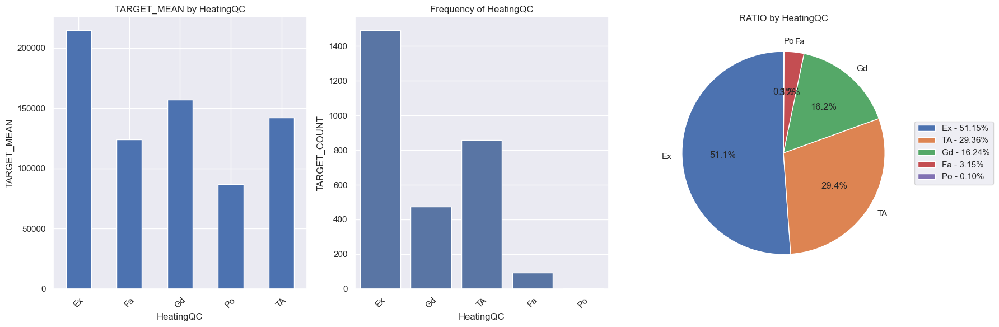

            TARGET_MEAN  TARGET_COUNT  RATIO
CentralAir                                  
N            105264.074            95  6.715
Y            186186.710          1365 93.285


##########################################


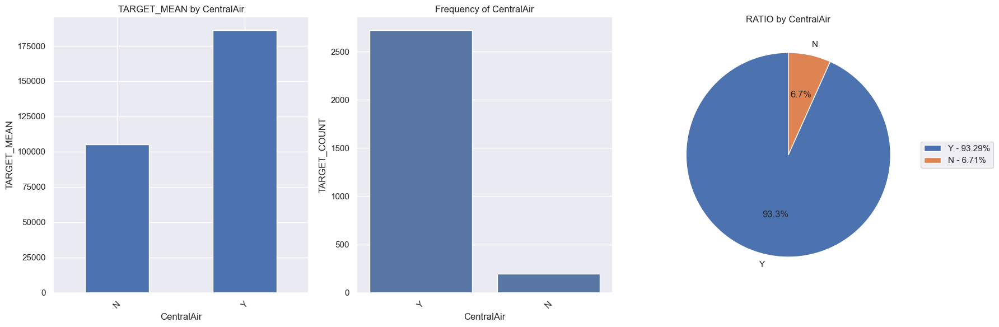

            TARGET_MEAN  TARGET_COUNT  RATIO
Electrical                                  
FuseA        122196.894            94  6.441
FuseF        107675.444            27  1.713
FuseP         97333.333             3  0.274
Mix           67000.000             1  0.034
SBrkr        186825.113          1334 91.504


##########################################


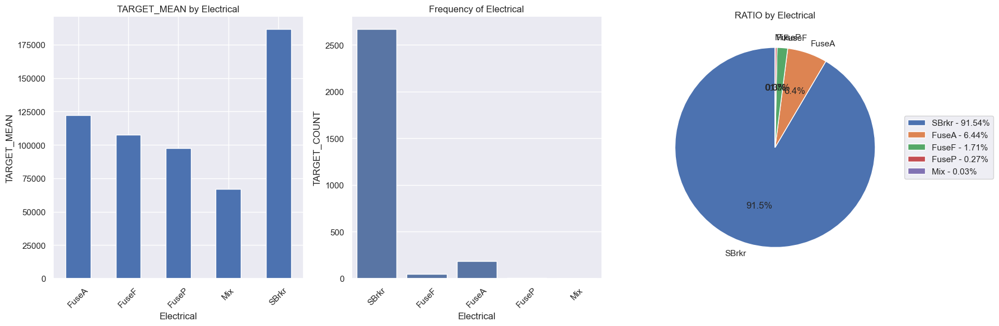

             TARGET_MEAN  TARGET_COUNT  RATIO
KitchenQual                                  
Ex            328554.670           100  7.023
Fa            105565.205            39  2.398
Gd            212116.024           586 39.431
TA            139962.512           735 51.113


##########################################


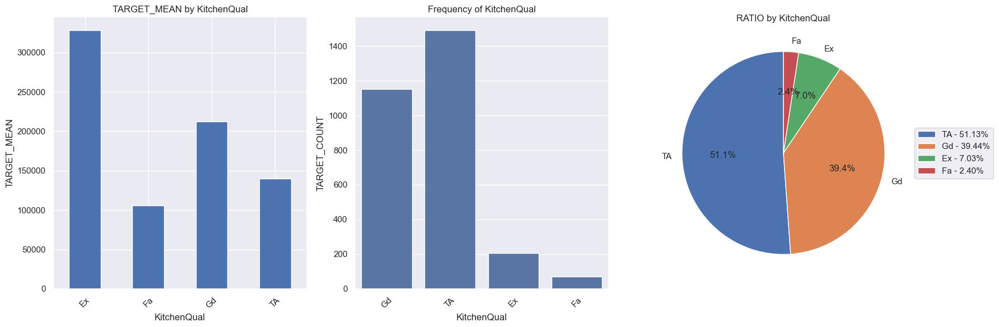

            TARGET_MEAN  TARGET_COUNT  RATIO
Functional                                  
Maj1         153948.143            14  0.651
Maj2          85800.000             5  0.308
Min1         146385.484            31  2.227
Min2         144240.647            34  2.398
Mod          168393.333            15  1.199
Sev          129000.000             1  0.069
Typ          183429.147          1360 93.080


##########################################


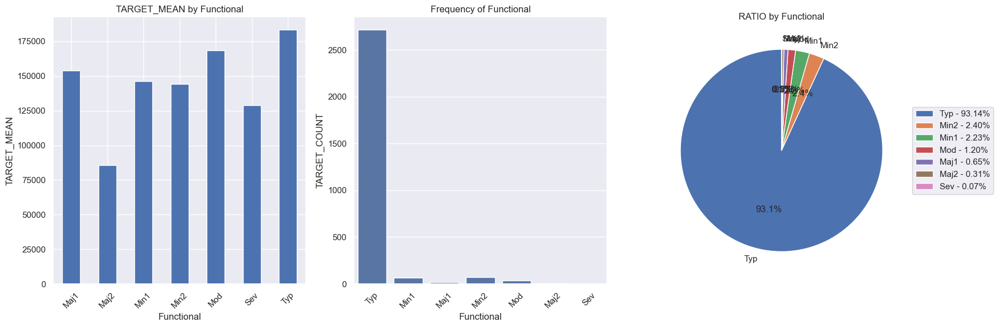

             TARGET_MEAN  TARGET_COUNT  RATIO
FireplaceQu                                  
Ex            337712.500            24  1.473
Fa            167298.485            33  2.535
Gd            226351.416           380 25.488
Po            129764.150            20  1.576
TA            205723.489           313 20.281


##########################################


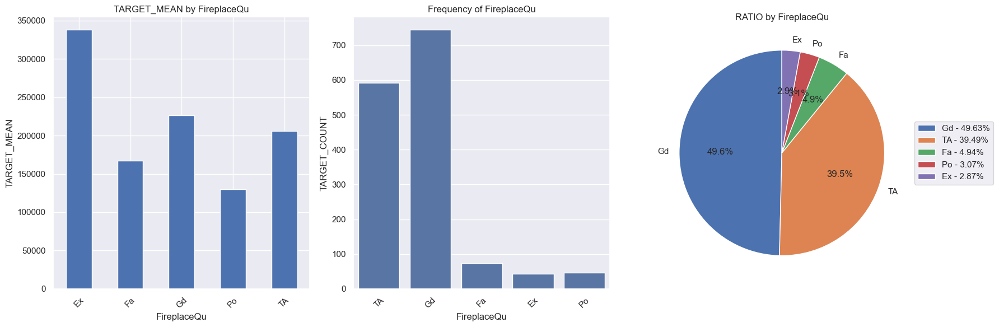

            TARGET_MEAN  TARGET_COUNT  RATIO
GarageType                                  
2Types       151283.333             6  0.788
Attchd       202892.656           870 59.027
Basment      160570.684            19  1.233
BuiltIn      254751.739            88  6.372
CarPort      109962.111             9  0.514
Detchd       134091.163           387 26.687


##########################################


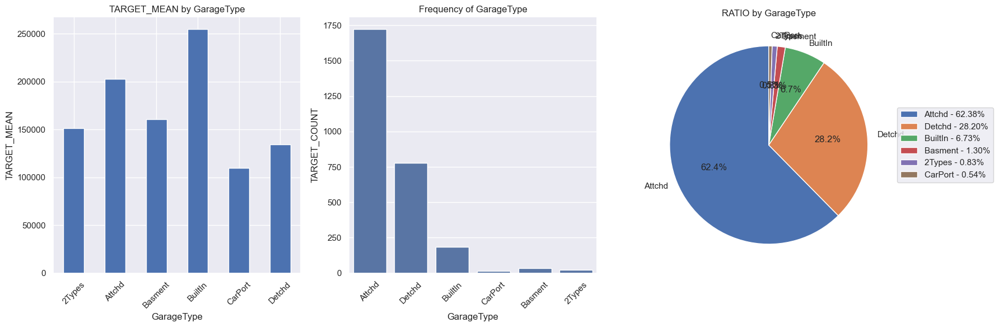

              TARGET_MEAN  TARGET_COUNT  RATIO
GarageFinish                                  
Fin            240052.690           352 24.632
RFn            202068.870           422 27.783
Unf            142156.423           605 42.138


##########################################


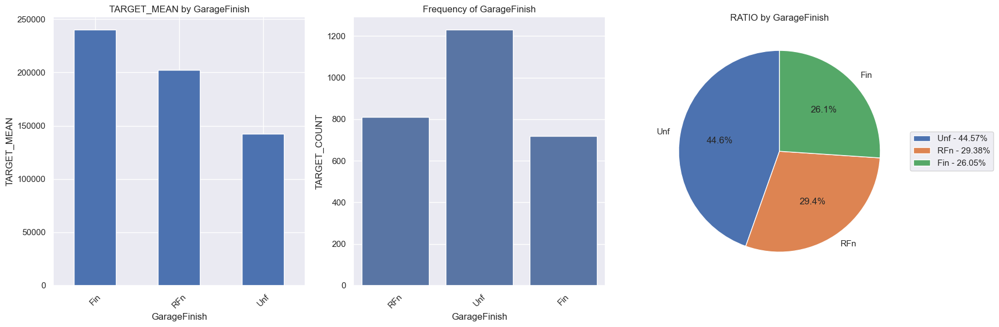

            TARGET_MEAN  TARGET_COUNT  RATIO
GarageQual                                  
Ex           241000.000             3  0.103
Fa           123573.354            48  4.248
Gd           215860.714            14  0.822
Po           100166.667             3  0.171
TA           187489.836          1311 89.209


##########################################


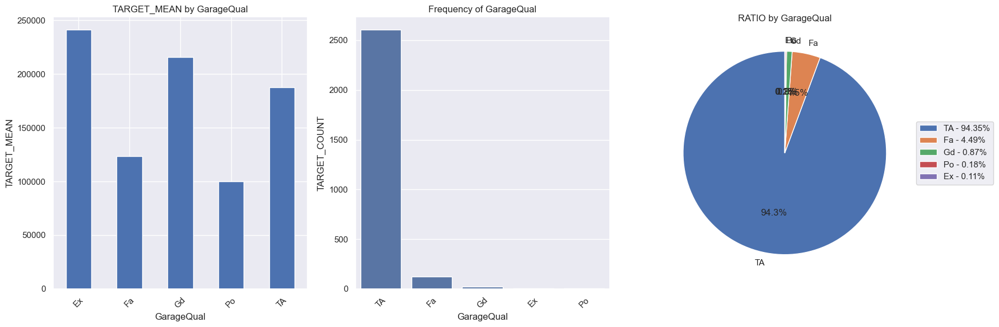

            TARGET_MEAN  TARGET_COUNT  RATIO
GarageCond                                  
Ex           124000.000             2  0.103
Fa           114654.029            35  2.535
Gd           179930.000             9  0.514
Po           108500.000             7  0.480
TA           187885.735          1326 90.922


##########################################


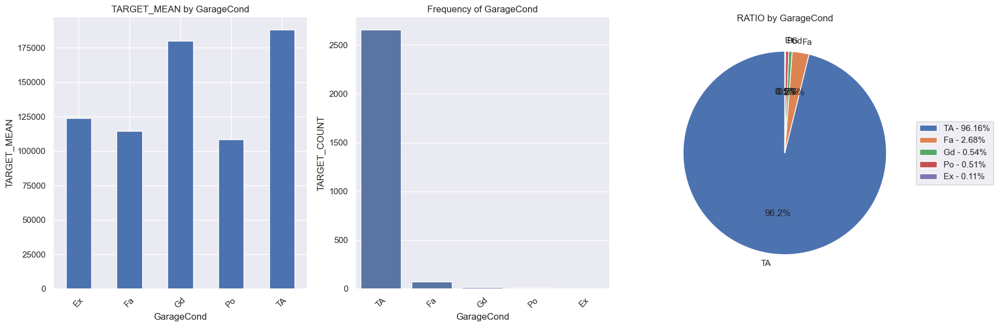

            TARGET_MEAN  TARGET_COUNT  RATIO
PavedDrive                                  
N            115039.122            90  7.400
P            132330.000            30  2.124
Y            186433.974          1340 90.476


##########################################


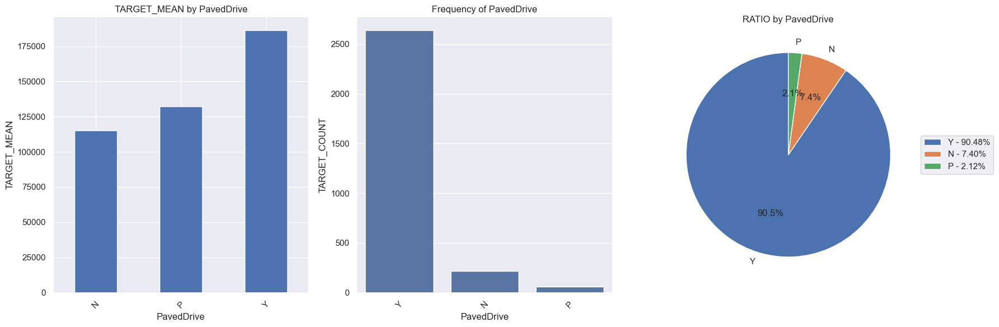

        TARGET_MEAN  TARGET_COUNT  RATIO
PoolQC                                  
Ex       490000.000             2  0.137
Fa       215500.000             2  0.069
Gd       201990.000             3  0.137


##########################################


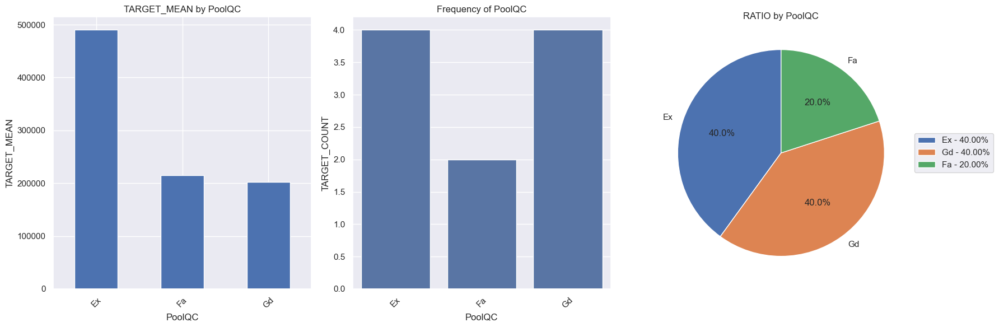

       TARGET_MEAN  TARGET_COUNT  RATIO
Fence                                  
GdPrv   178927.458            59  4.042
GdWo    140379.315            54  3.837
MnPrv   148751.089           157 11.271
MnWw    134286.364            11  0.411


##########################################


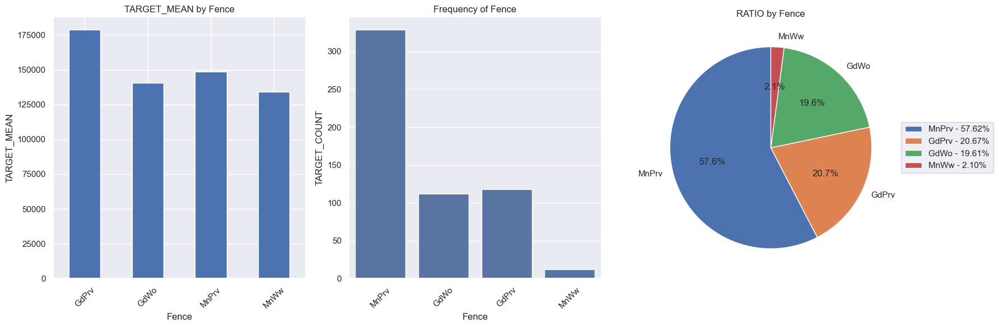

             TARGET_MEAN  TARGET_COUNT  RATIO
MiscFeature                                  
Gar2          170750.000             2  0.171
Othr           94000.000             2  0.137
Shed          151187.612            49  3.255
TenC          250000.000             1  0.034


##########################################


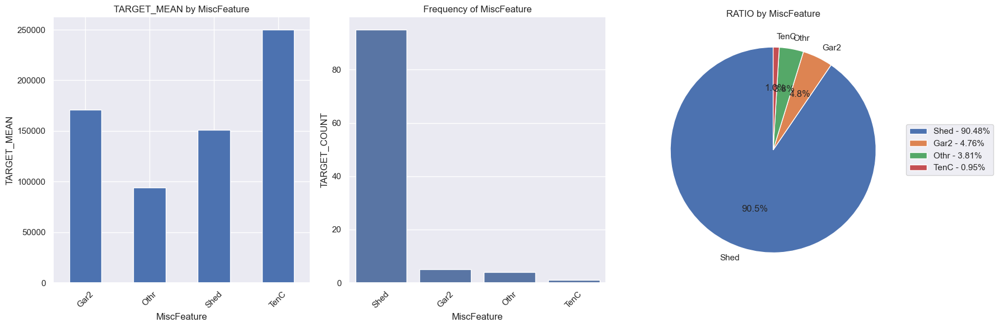

          TARGET_MEAN  TARGET_COUNT  RATIO
SaleType                                  
COD        143973.256            43  2.980
CWD        210600.000             4  0.411
Con        269600.000             2  0.171
ConLD      138780.889             9  0.891
ConLI      200390.000             5  0.308
ConLw      143700.000             5  0.274
New        274945.418           122  8.188
Oth        119850.000             3  0.240
WD         173401.837          1267 86.502


##########################################


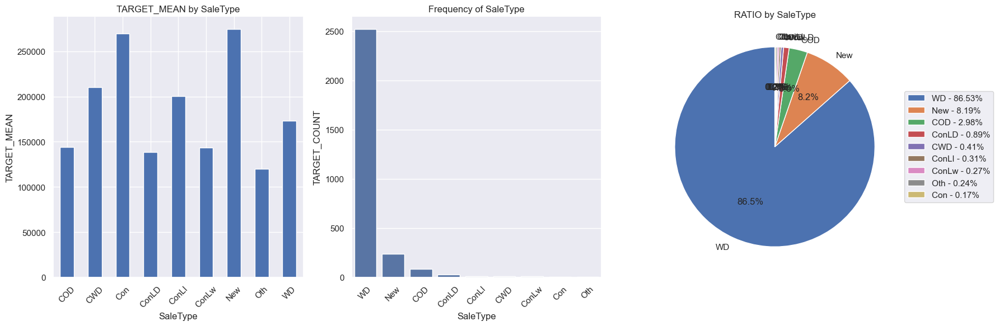

               TARGET_MEAN  TARGET_COUNT  RATIO
SaleCondition                                  
Abnorml         146526.624           101  6.509
AdjLand         104125.000             4  0.411
Alloca          167377.417            12  0.822
Family          149600.000            20  1.576
Normal          175202.220          1198 82.288
Partial         272291.752           125  8.393


##########################################


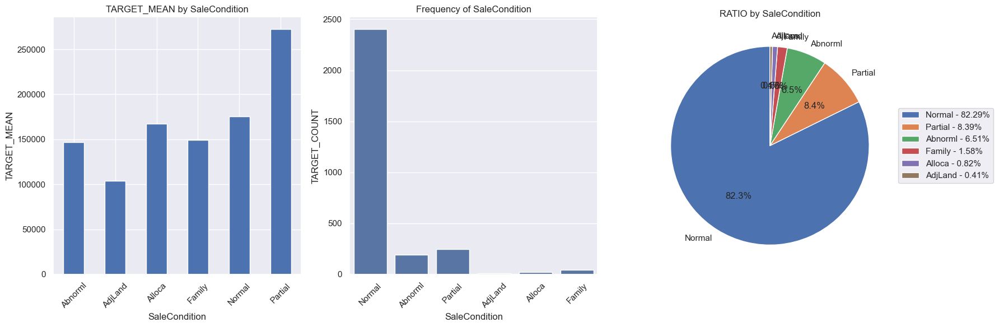

             TARGET_MEAN  TARGET_COUNT  RATIO
OverallCond                                  
1              61000.000             1  0.240
2             141986.400             5  0.343
3             101929.400            25  1.713
4             120438.439            57  3.460
5             203146.915           821 56.355
6             153961.591           252 18.191
7             158145.488           205 13.361
8             155651.736            72  4.933
9             216004.545            22  1.405


##########################################


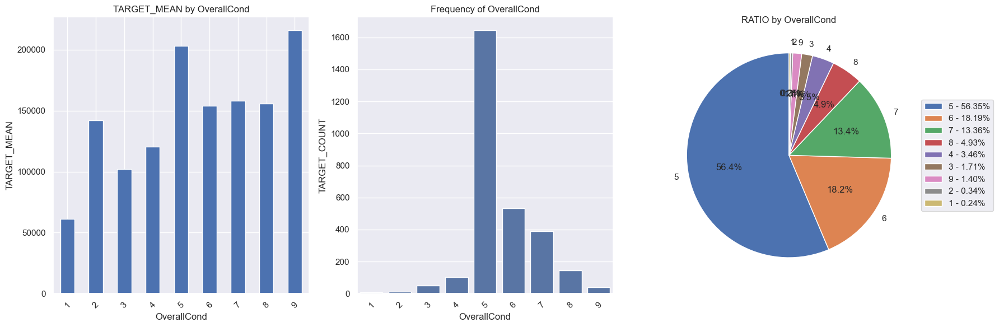

              TARGET_MEAN  TARGET_COUNT  RATIO
BsmtFullBath                                  
0.000          165521.640           856 58.410
1.000          202522.918           588 40.151
2.000          213063.067            15  1.302
3.000          179000.000             1  0.069


##########################################


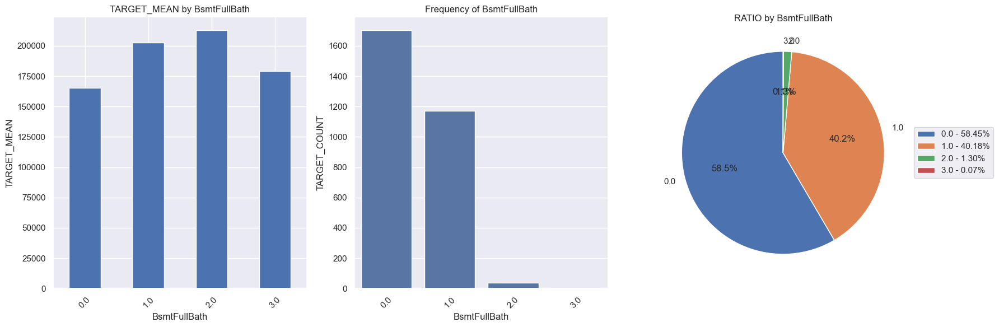

              TARGET_MEAN  TARGET_COUNT  RATIO
BsmtHalfBath                                  
0.000          181230.330          1378 93.936
1.000          176098.125            80  5.858
2.000          160850.500             2  0.137


##########################################


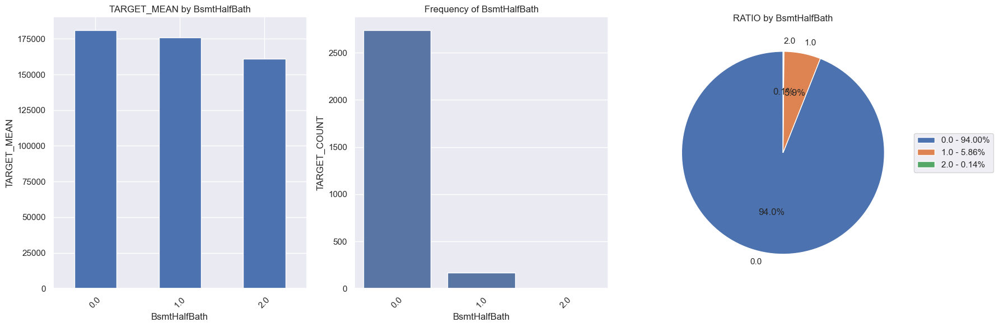

          TARGET_MEAN  TARGET_COUNT  RATIO
FullBath                                  
0          165200.889             9  0.411
1          134751.440           650 44.844
2          213009.826           768 52.415
3          347822.909            33  2.193
4                 NaN             0  0.137


##########################################


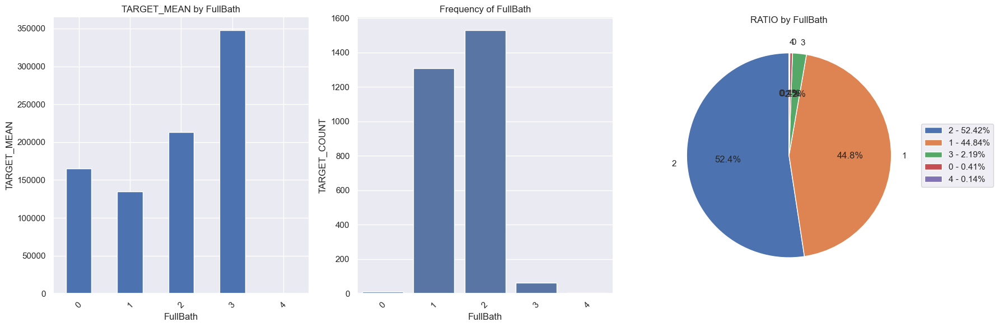

          TARGET_MEAN  TARGET_COUNT  RATIO
HalfBath                                  
0          162534.885           913 62.830
1          212721.961           535 36.314
2          162028.917            12  0.856


##########################################


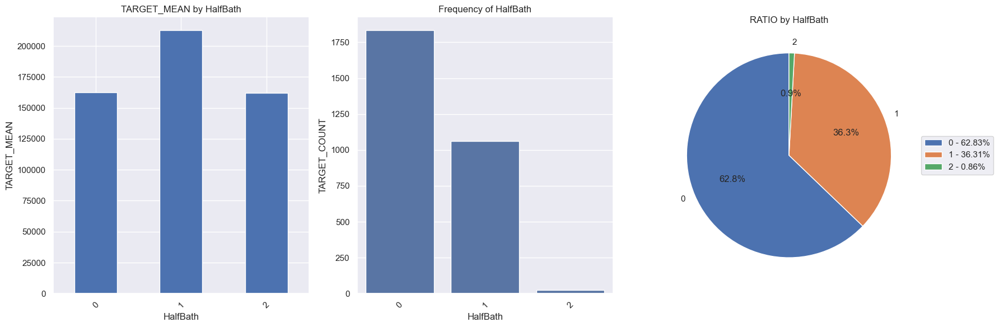

              TARGET_MEAN  TARGET_COUNT  RATIO
BedroomAbvGr                                  
0              221493.167             6  0.274
1              173162.420            50  3.529
2              158197.659           358 25.420
3              181056.871           804 54.676
4              220421.254           213 13.703
5              180819.048            21  1.644
6              143779.000             7  0.719
8              200000.000             1  0.034


##########################################


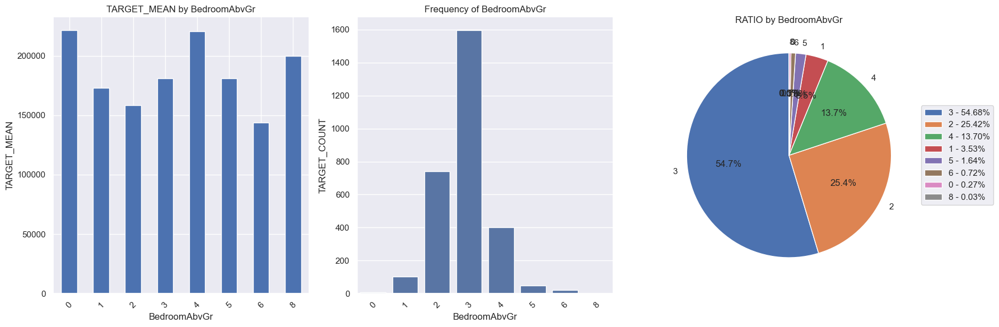

              TARGET_MEAN  TARGET_COUNT  RATIO
KitchenAbvGr                                  
0              127500.000             1  0.103
1              183388.790          1392 95.409
2              131096.154            65  4.419
3              109500.000             2  0.069


##########################################


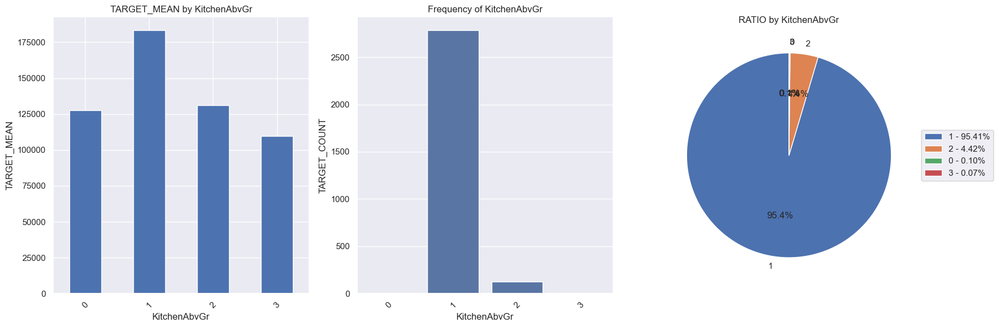

            TARGET_MEAN  TARGET_COUNT  RATIO
Fireplaces                                  
0            141331.483           690 48.647
1            211843.909           650 43.440
2            240588.539           115  7.503
3            252000.000             5  0.377
4                   NaN             0  0.034


##########################################


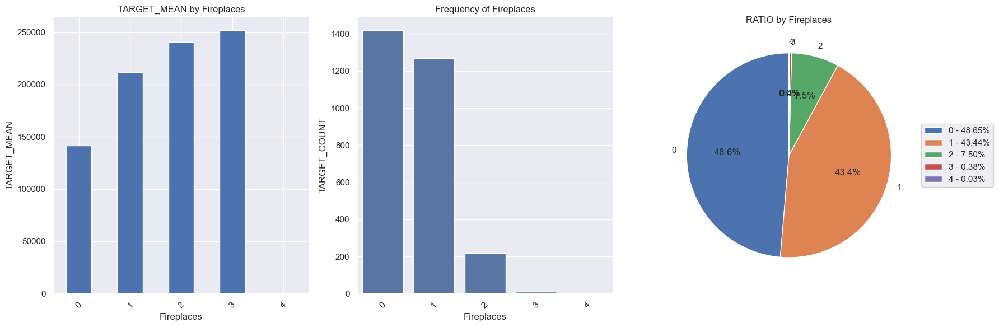

            TARGET_MEAN  TARGET_COUNT  RATIO
GarageCars                                  
0.000        103317.284            81  5.379
1.000        128116.688           369 26.584
2.000        183851.664           824 54.608
3.000        309636.122           181 12.813
4.000        192655.800             5  0.548
5.000               NaN             0  0.034


##########################################


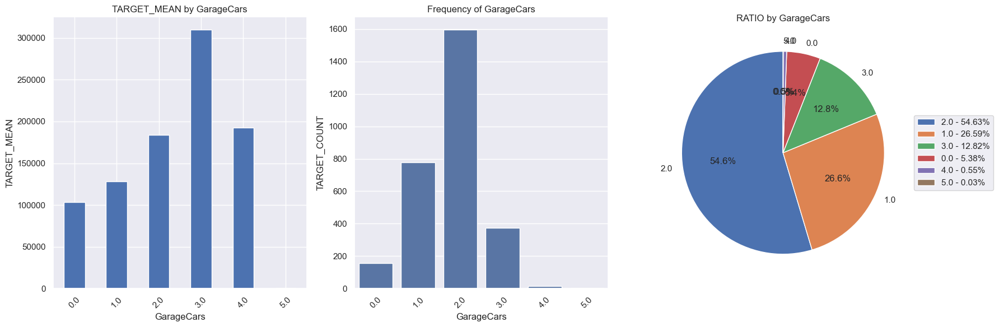

        TARGET_MEAN  TARGET_COUNT  RATIO
YrSold                                  
2006     182549.459           314 21.206
2007     186063.152           329 23.707
2008     177360.839           304 21.309
2009     179432.104           338 22.165
2010     177393.674           175 11.614


##########################################


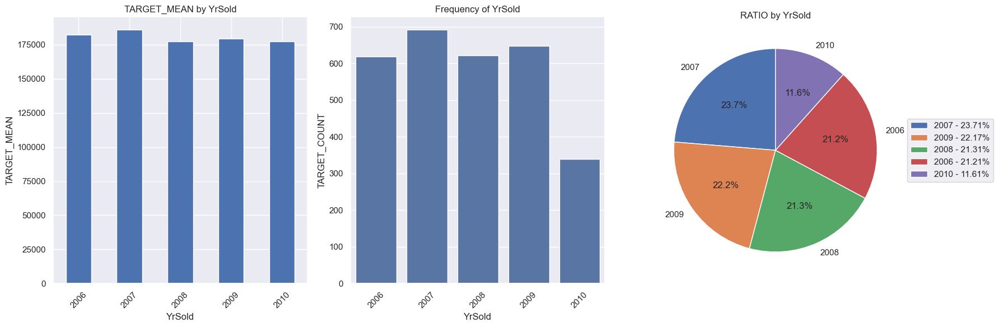

In [23]:
for col in cat_cols:
    target_summary_with_cat(df, "SalePrice", col, plot=True)

In [24]:
def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].shape[0] > 0:
        return True
    else:
        return False

In [25]:
for col in num_cols:
    print(col, check_outlier(df, col))

MSSubClass False
LotFrontage True
LotArea True
OverallQual False
YearBuilt False
YearRemodAdd False
MasVnrArea True
BsmtFinSF1 True
BsmtFinSF2 True
BsmtUnfSF False
TotalBsmtSF True
1stFlrSF True
2ndFlrSF False
LowQualFinSF True
GrLivArea True
TotRmsAbvGrd False
GarageYrBlt True
GarageArea False
WoodDeckSF True
OpenPorchSF True
EnclosedPorch True
3SsnPorch True
ScreenPorch True
PoolArea True
MiscVal True
MoSold False


In [26]:
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [27]:
for col in num_cols:
    replace_with_thresholds(df, col)

In [28]:
def missing_values_table(dataframe, na_name=False, plot=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]
    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=["n_miss", "ratio"])
    print(missing_df, end="\n")
    print("##########################################")
    
    if plot:
        plt.figure(figsize=(10, 8))
        bars = plt.bar(missing_df.index, missing_df["ratio"]) 
        plt.xlabel("Features")
        plt.ylabel("Percentage of Missing Values")
        plt.title("Missing Values by Feature")

        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width() / 2, yval, f"{yval:.2f}%", ha="center", va="bottom", fontsize=8, rotation=90) 
        
        plt.xticks(rotation=90, fontsize=8) 
        plt.yticks(fontsize=8) 
        plt.grid(True)  
        plt.tight_layout()
        plt.show()

    if na_name:
        return na_columns

              n_miss  ratio
PoolQC          2909 99.660
MiscFeature     2814 96.400
Alley           2721 93.220
Fence           2348 80.440
MasVnrType      1766 60.500
SalePrice       1459 49.980
FireplaceQu     1420 48.650
LotFrontage      486 16.650
GarageCond       159  5.450
GarageYrBlt      159  5.450
GarageFinish     159  5.450
GarageQual       159  5.450
GarageType       157  5.380
BsmtExposure      82  2.810
BsmtCond          82  2.810
BsmtQual          81  2.770
BsmtFinType2      80  2.740
BsmtFinType1      79  2.710
MasVnrArea        23  0.790
MSZoning           4  0.140
Functional         2  0.070
BsmtHalfBath       2  0.070
BsmtFullBath       2  0.070
Utilities          2  0.070
KitchenQual        1  0.030
TotalBsmtSF        1  0.030
BsmtUnfSF          1  0.030
GarageCars         1  0.030
GarageArea         1  0.030
BsmtFinSF2         1  0.030
BsmtFinSF1         1  0.030
Exterior2nd        1  0.030
Exterior1st        1  0.030
SaleType           1  0.030
Electrical         1

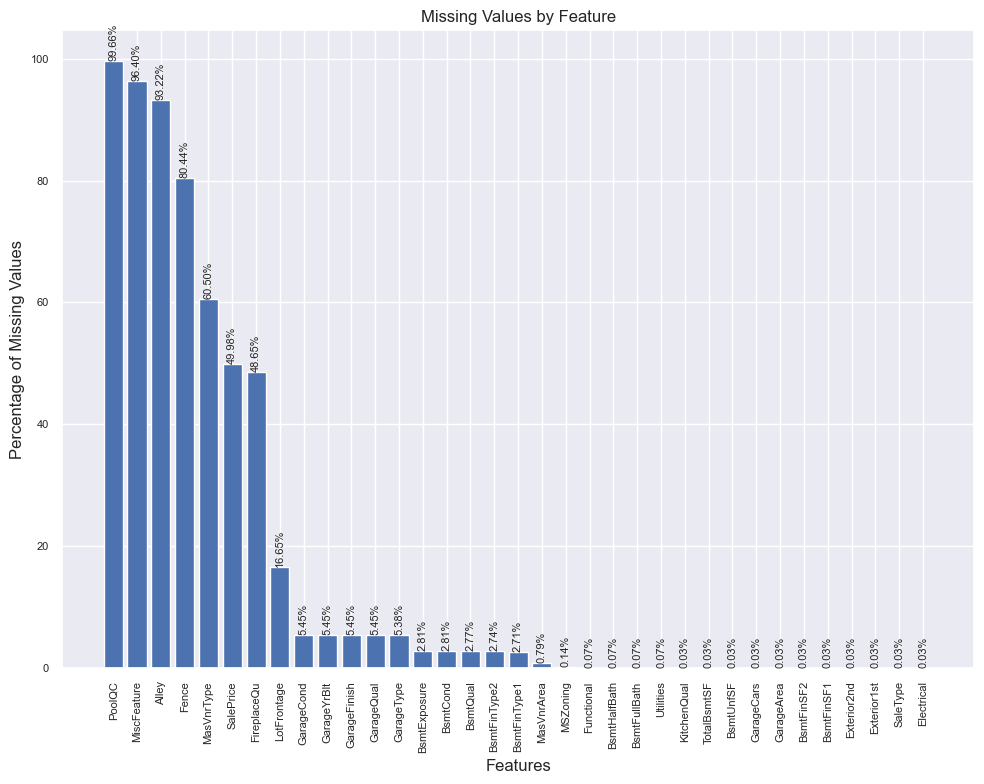

In [29]:
missing_values_table(df, plot=True)

In [30]:
na_cols = missing_values_table(df, na_name= True)

              n_miss  ratio
PoolQC          2909 99.660
MiscFeature     2814 96.400
Alley           2721 93.220
Fence           2348 80.440
MasVnrType      1766 60.500
SalePrice       1459 49.980
FireplaceQu     1420 48.650
LotFrontage      486 16.650
GarageCond       159  5.450
GarageYrBlt      159  5.450
GarageFinish     159  5.450
GarageQual       159  5.450
GarageType       157  5.380
BsmtExposure      82  2.810
BsmtCond          82  2.810
BsmtQual          81  2.770
BsmtFinType2      80  2.740
BsmtFinType1      79  2.710
MasVnrArea        23  0.790
MSZoning           4  0.140
Functional         2  0.070
BsmtHalfBath       2  0.070
BsmtFullBath       2  0.070
Utilities          2  0.070
KitchenQual        1  0.030
TotalBsmtSF        1  0.030
BsmtUnfSF          1  0.030
GarageCars         1  0.030
GarageArea         1  0.030
BsmtFinSF2         1  0.030
BsmtFinSF1         1  0.030
Exterior2nd        1  0.030
Exterior1st        1  0.030
SaleType           1  0.030
Electrical         1

In [31]:
def get_categorical_missing_columns(cat_cols, missing_value_cols):
    return [col for col in missing_value_cols if col in cat_cols]


cat_miss_cols = get_categorical_missing_columns(cat_cols, na_cols)
print(cat_miss_cols)

['MSZoning', 'Alley', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType']


In [32]:
for col in cat_miss_cols:
    df[col].fillna("No",inplace=True)

In [33]:
df[cat_cols].isnull().sum()

MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
SaleType         0
SaleCondition    0
OverallCond      0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
Fireplaces       0
GarageCars       0
YrSold      

In [34]:
missing_values_table(df)

             n_miss  ratio
SalePrice      1459 49.980
LotFrontage     486 16.650
GarageYrBlt     159  5.450
MasVnrArea       23  0.790
BsmtFinSF1        1  0.030
BsmtFinSF2        1  0.030
BsmtUnfSF         1  0.030
TotalBsmtSF       1  0.030
GarageArea        1  0.030
##########################################


In [35]:
na_num_cols = missing_values_table(df, na_name= True)

             n_miss  ratio
SalePrice      1459 49.980
LotFrontage     486 16.650
GarageYrBlt     159  5.450
MasVnrArea       23  0.790
BsmtFinSF1        1  0.030
BsmtFinSF2        1  0.030
BsmtUnfSF         1  0.030
TotalBsmtSF       1  0.030
GarageArea        1  0.030
##########################################


In [36]:
na_num_cols = [col for col in na_num_cols if "SalePrice" not in col]

na_num_cols

['LotFrontage',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'GarageYrBlt',
 'GarageArea']

In [37]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
X_imputed = imputer.fit_transform(df[na_num_cols])

In [38]:
df[na_num_cols] = X_imputed

In [39]:
missing_values_table(df)

           n_miss  ratio
SalePrice    1459 49.980
##########################################


In [40]:
num_cols

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'TotRmsAbvGrd',
 'GarageYrBlt',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold']

In [41]:
cat_cols

['MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition',
 'OverallCond',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'Fireplaces',
 'GarageCars',
 'YrSold']

In [151]:
dff = df.copy()
def label_encoder(dataframe, binary_col):
    labelencoder = LabelEncoder()
    dataframe[binary_col] = labelencoder.fit_transform(dataframe[binary_col])
    return dataframe

In [43]:
binary_cols = [col for col in df.columns if dff[col].dtypes == "O" and len(dff[col].unique()) == 2]

In [44]:
for col in binary_cols:
    label_encoder(dff, col)

In [45]:
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first, dtype=int)
    return dataframe

In [46]:
dff = one_hot_encoder(dff, cat_cols, drop_first=True)

In [47]:
dff.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,MSZoning_FV,MSZoning_No,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_1,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_No,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_No,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_No,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_No,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_No,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_No,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_No,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No,MiscFeature_No,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_No,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Norma

In [48]:

train = dff[dff["SalePrice"].notnull()]
test = dff[dff["SalePrice"].isnull()]

In [49]:
train.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,MSZoning_FV,MSZoning_No,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_1,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_No,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_No,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_No,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_No,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_No,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_No,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_No,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No,MiscFeature_No,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_No,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Norma

In [50]:
test.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,MSZoning_FV,MSZoning_No,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_1,Alley_No,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_No,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_No,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_No,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_1,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_No,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_No,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_No,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,PoolQC_Fa,PoolQC_Gd,PoolQC_No,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No,MiscFeature_No,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_No,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Norma

In [51]:
y = train["SalePrice"]
X = train.drop(["Id", "SalePrice"], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

models = [("LR", LinearRegression()),
          ("KNN", KNeighborsRegressor()),
          ("CART", DecisionTreeRegressor()),
          ("RF", RandomForestRegressor()),
          ("SVM", SVR()),
          ("XGB", XGBRegressor()),
          ("LightGBM", LGBMRegressor(force_row_wise=True)),
          ("CatBoost", CatBoostRegressor(verbose=False))]

for name, model in models:
    rmse = np.mean(np.sqrt(-cross_val_score(model, X, y, cv=5, scoring="neg_mean_squared_error")))
    
    print(f"RMSE: {round(rmse, 4)} ({name})")

RMSE: 54273.842 (LR)
RMSE: 45958.9974 (KNN)
RMSE: 40772.998 (CART)
RMSE: 29952.2128 (RF)
RMSE: 81138.8717 (SVM)
RMSE: 29016.7341 (XGB)
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3194
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 187
[LightGBM] [Info] Start training from score 180717.091610
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3184
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 181
[LightGBM] [Info] Start training from score 180407.575342
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3196
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 185
[LightGBM] [Info] Start training from score 180007.375000
[LightGBM] [Warning] Found whitespace in feature_names, replace with u

In [52]:
cat_model = CatBoostRegressor(verbose=False, random_state=42).fit(X_train, y_train)

In [53]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({"Value": model.feature_importances_, "Feature": features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title("Features")
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig("importances.png")

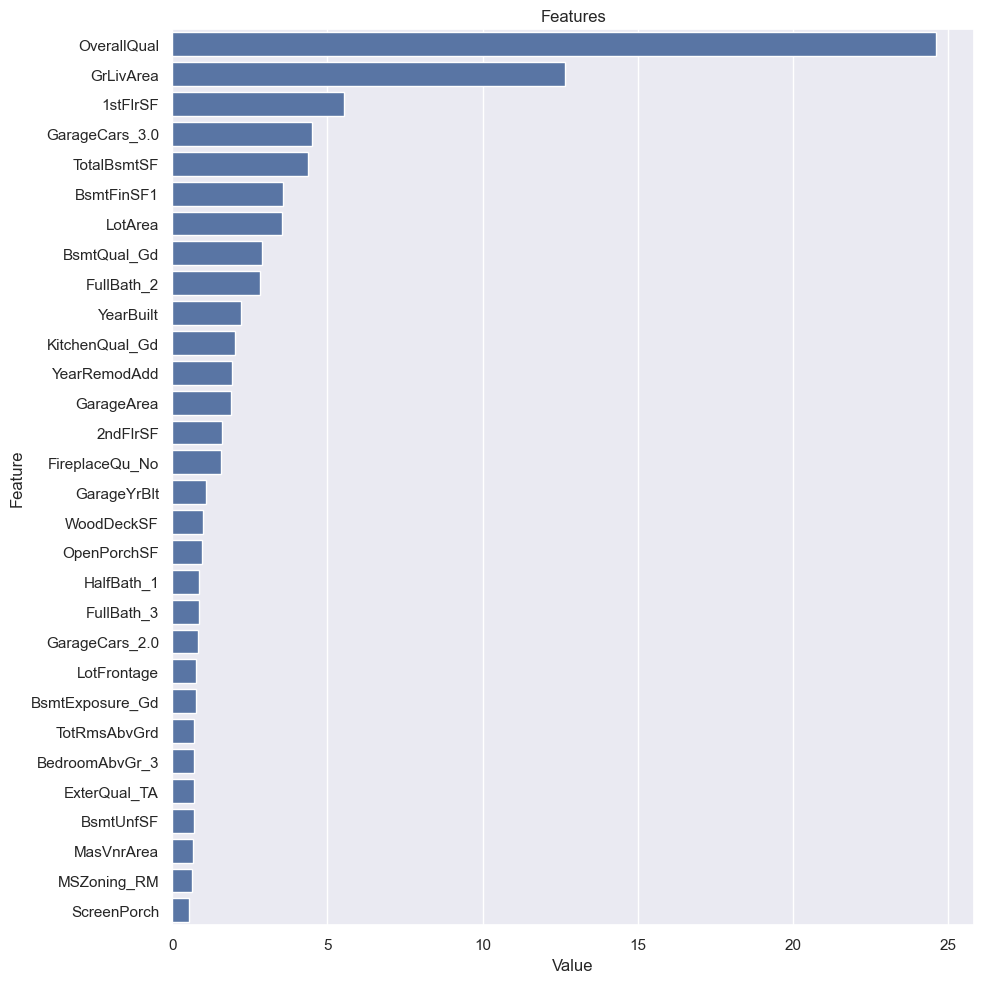

In [54]:
plot_importance(cat_model, X, num=30)

In [55]:
import numpy as np
import pandas as pd
from scipy import stats

def engineered_features(df):
    df_new = df.copy()

    # Metin değerleri float'a dönüştürülemeyecek olan sütunları belirleyin ve gerekli işlemleri yapın
    problematic_columns = ["LotFrontage", "MasVnrArea", "GarageYrBlt", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "BsmtFullBath", "BsmtHalfBath", "GarageCars", "GarageArea"]
    
    for col in problematic_columns:
        df_new[col] = pd.to_numeric(df_new[col], errors='coerce').fillna(0)
    # 1. Age of the house
    df_new["NEW_HouseAge"] = df_new["YrSold"].astype(int) - df_new["YearBuilt"].astype(int)
    
    # 2. Total square footage
    df_new["NEW_TotalSF"] = df_new["TotalBsmtSF"].astype(float) + df_new["1stFlrSF"].astype(float) + df_new["2ndFlrSF"].astype(float)
    
    # 3. Total bathrooms
    df_new["NEW_TotalBathrooms"] = df_new["FullBath"].astype(float) + 0.5 * df_new["HalfBath"].astype(float) + df_new["BsmtFullBath"].astype(float) + 0.5 * df_new["BsmtHalfBath"].astype(float)
    
    # 4. House quality score
    df_new["NEW_QualityScore"] = df_new["OverallQual"].astype(int) * df_new["OverallCond"].astype(int)
    
    # 5. Garage area per car
    df_new["NEW_GarageAreaPerCar"] = df_new["GarageArea"].astype(float) / (df_new["GarageCars"].astype(float) + 1)  # Adding 1 to avoid division by zero
    
    # 6. Total porch area
    df_new["NEW_TotalPorchArea"] = df_new["OpenPorchSF"].astype(float) + df_new["EnclosedPorch"].astype(float) + df_new["3SsnPorch"].astype(float) + df_new["ScreenPorch"].astype(float)
    
    # 7. Has pool
    df_new["NEW_HasPool"] = (df_new["PoolArea"].astype(float) > 0).astype(int)
    
    # 8. Has fireplace
    df_new["NEW_HasFireplace"] = (df_new["Fireplaces"].astype(int) > 0).astype(int)
    
    # 9. Remodel age
    df_new["NEW_ReModelAge"] = df_new["YrSold"].astype(int) - df_new["YearRemodAdd"].astype(int)
    
    # 10. Total outdoor area
    df_new["NEW_TotalOutdoorSF"] = df_new["LotArea"].astype(float) - df_new["1stFlrSF"].astype(float)
    
    # 11. Living area ratio
    df_new["NEW_LivingAreaRatio"] = df_new["GrLivArea"].astype(float) / df_new["LotArea"].astype(float)
    
    # 12. Is new construction
    df_new["NEW_IsNewConstruction"] = (df_new["YearBuilt"].astype(int) == df_new["YrSold"].astype(int)).astype(int)
    
    # 13. Age when sold category
    df_new["NEW_AgeSoldCategory"] = pd.cut(df_new["NEW_HouseAge"], bins=[0, 5, 10, 20, 30, 50, 100, np.inf], labels=["New", "5-10", "10-20", "20-30", "30-50", "50-100", "100+"])
    
    # 14. Total rooms above ground to total area ratio
    df_new["NEW_RoomsPerArea"] = df_new["TotRmsAbvGrd"].astype(float) / df_new["GrLivArea"].astype(float)
    
    # 15. Masonry veneer area percentage
    df_new["NEW_MasonryVeneerPercentage"] = df_new["MasVnrArea"].astype(float) / df_new["NEW_TotalSF"].astype(float)
    
    # 16. Overall material and finish quality category
    df_new["NEW_OverallQualCategory"] = pd.cut(df_new["OverallQual"], bins=[0, 3, 5, 7, 10], labels=["Low", "Average", "Good", "Excellent"])
    
    # 17. Z-score normalization for key metrics
    key_metrics = ["GrLivArea", "TotalBsmtSF", "GarageArea", "LotArea"]
    
    for metric in key_metrics:
        df_new[f"NEW_{metric}ZScore"] = stats.zscore(df_new[metric].astype(float))
    
    # 18. Total value of miscellaneous features
    df_new["NEW_TotalMiscValue"] = df_new["MiscVal"].astype(float) + df_new["PoolArea"].astype(float) * 100  # Assuming $100 per sq ft for pool
    
    # 19. Total SF to lot area ratio
    df_new["NEW_TotalSFtoLotRatio"] = df_new["NEW_TotalSF"].astype(float) / df_new["LotArea"].astype(float)
    
    # 20. Age since remodel category
    df_new["NEW_RemodelAgeCategory"] = pd.cut(df_new["NEW_ReModelAge"], bins=[-1, 0, 5, 10, 20, 30, np.inf], labels=["Recent", "1-5", "6-10", "11-20", "21-30", "30+"])

    # 21. Kitchen and bathroom score
    df_new["NEW_KitchenBathScore"] = df_new["KitchenQual"].map({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1}).fillna(0) * df_new["NEW_TotalBathrooms"]

    # 22. Exterior quality score
    df_new["NEW_ExteriorScore"] = df_new["ExterQual"].map({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1}).fillna(0) + df_new["ExterCond"].map({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1}).fillna(0)
    
    # 23. Total quality score (combination of various quality indicators)
    df_new["NEW_TotalQualityScore"] = df_new["OverallQual"].astype(int) + df_new["OverallCond"].astype(int) + df_new["NEW_ExteriorScore"] + df_new["NEW_KitchenBathScore"]
    
    # 24. Has second floor
    df_new["NEW_Has2ndFloor"] = (df_new["2ndFlrSF"].astype(float) > 0).astype(int)
    
    # 25. Lot frontage to lot area ratio
    df_new["NEW_FrontagetoLotRatio"] = df_new["LotFrontage"].astype(float) / df_new["LotArea"].astype(float)
    
    # 26. Total number of rooms (including basement)
    df_new["NEW_TotalRooms"] = df_new["TotRmsAbvGrd"].astype(int) + df_new["TotalBsmtSF"].astype(int) // 100  # Assuming average room size of 100 sq ft in basement
    
    return df_new

# Test the function with the dataframe
df_new = engineered_features(df)
df_new.head()



,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_HouseAge,NEW_TotalSF,NEW_TotalBathrooms,NEW_QualityScore,NEW_GarageAreaPerCar,NEW_TotalPorchArea,NEW_HasPool,NEW_HasFireplace,NEW_ReModelAge,NEW_TotalOutdoorSF,NEW_LivingAreaRatio,NEW_IsNewConstruction,NEW_AgeSoldCategory,NEW_RoomsPerArea,NEW_MasonryVeneerPercentage,NEW_OverallQualCategory,NEW_GrLivAreaZScore,NEW_TotalBsmtSFZScore,NEW_GarageAreaZScore,NEW_LotAreaZScore,NEW_TotalMiscValue,NEW_TotalSFtoLotRatio,NEW_RemodelAgeCategory,NEW_KitchenBathScore,NEW_ExteriorScore,NEW_TotalQualityScore,NEW_Has2ndFloor,NEW_FrontagetoLotRatio,NEW_TotalRooms
0,1,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000,5,2566.000,3.500,35,182.667,61.000,0,0,5,7594.000,0.202,0,New,0.005,0.076,Good,0.416,-0.452,0.349,-0.303,0.000,0.304,1-5,14.000,7,33.000,1,0.008,16
1,2,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,No,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000,31,2524.000,2.500,48,153.333,0.000,0,1,31,8338.000,0.131,0,30-50,0.005,0.000,Good,-0.474,0.492,-0.060,-0.066,0.000,0.263,30+,7.500,6,27.500,0,0.008,18
2,3,60,RL,68.000,11250.000,Pave,No,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000,7,2706.000,3.500,35,202.667,42.000,0,1,6,10330.000,0.159,0,5-10,0.003,0.060,Good,0.567,-0.303,0.628,0.275,0.000,0.241,6-10,14.000,7,33.000,1,0.006,15
3,4,70,RL,60.000,9550.000,Pave,No,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,No,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000,91,2473.000,2.000,35,160.500,307.000,0,1,36,8589.000,0.180,0,50-100,0.004,0.000,Good,0.430,-0.685,0.786,-0.076,0.000,0.259,30+,8.000,6,26.000,1,0.006,14
4,5,60,RL,84.000,14260.000,Pave,No,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84.000,0,0,0.000,0,No,No,No,0,12.000,2008,WD,Normal,250

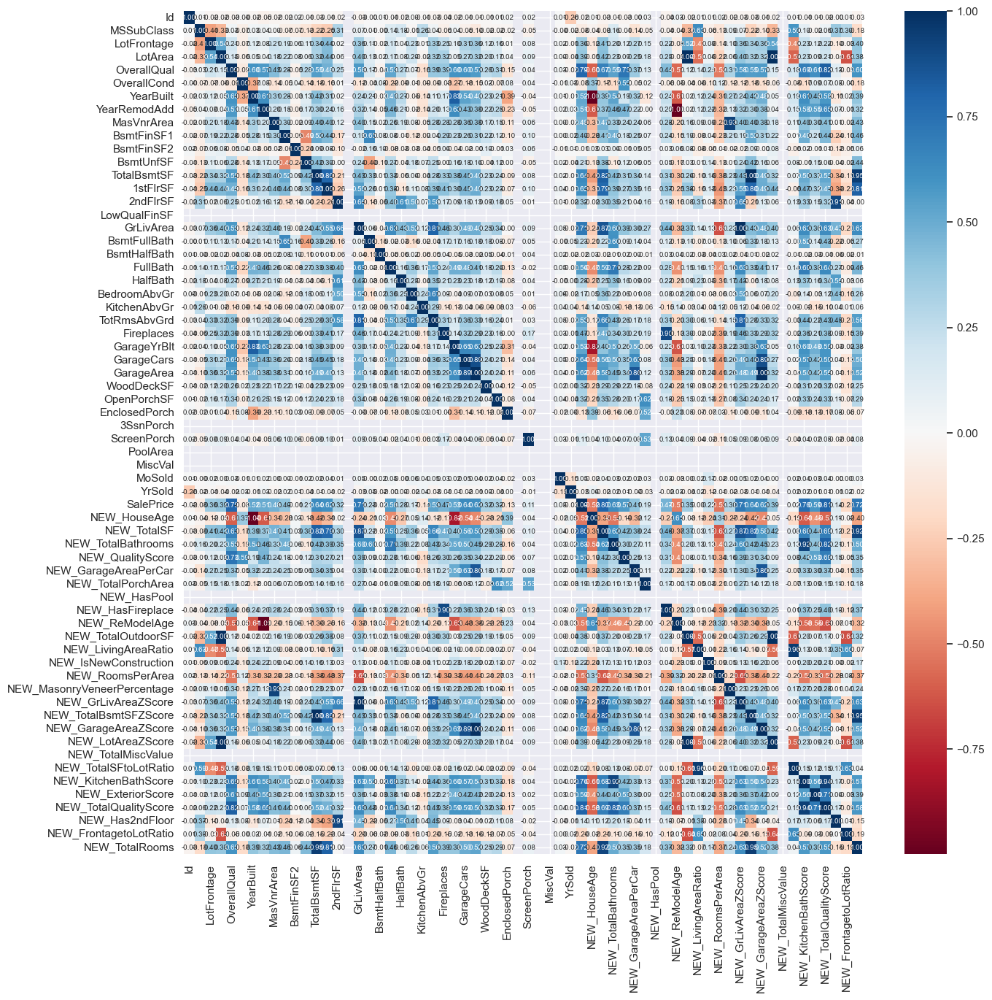

['NEW_HouseAge',
 'NEW_ReModelAge',
 'NEW_TotalOutdoorSF',
 'NEW_MasonryVeneerPercentage',
 'NEW_GrLivAreaZScore',
 'NEW_TotalBsmtSFZScore',
 'NEW_GarageAreaZScore',
 'NEW_LotAreaZScore',
 'NEW_TotalSFtoLotRatio',
 'NEW_KitchenBathScore',
 'NEW_TotalQualityScore',
 'NEW_Has2ndFloor',
 'NEW_TotalRooms']

In [56]:
drop_list = high_correlated_cols(df_new, plot=True, corr_th=0.90)

drop_list

In [57]:
df_new.drop(columns=drop_list, inplace=True)

In [58]:
df_new.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_TotalSF,NEW_TotalBathrooms,NEW_QualityScore,NEW_GarageAreaPerCar,NEW_TotalPorchArea,NEW_HasPool,NEW_HasFireplace,NEW_LivingAreaRatio,NEW_IsNewConstruction,NEW_AgeSoldCategory,NEW_RoomsPerArea,NEW_OverallQualCategory,NEW_TotalMiscValue,NEW_RemodelAgeCategory,NEW_ExteriorScore,NEW_FrontagetoLotRatio
0,1,60,RL,65.000,8450.000,Pave,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,Y,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000,2566.000,3.500,35,182.667,61.000,0,0,0.202,0,New,0.005,Good,0.000,1-5,7,0.008
1,2,20,RL,80.000,9600.000,Pave,No,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,No,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,Y,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000,2524.000,2.500,48,153.333,0.000,0,1,0.131,0,30-50,0.005,Good,0.000,30+,6,0.008
2,3,60,RL,68.000,11250.000,Pave,No,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,Y,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000,2706.000,3.500,35,202.667,42.000,0,1,0.159,0,5-10,0.003,Good,0.000,6-10,7,0.006
3,4,70,RL,60.000,9550.000,Pave,No,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,No,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,Y,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000,2473.000,2.000,35,160.500,307.000,0,1,0.180,0,50-100,0.004,Good,0.000,30+,6,0.006
4,5,60,RL,84.000,14260.000,Pave,No,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,Y,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84.000,0,0,0.000,0,No,No,No,0,12.000,2008,WD,Normal,250000.000,3343.000,3.500,40,209.000,84.000,0,1,0.154,0,5-10,0.004,Excellent,0.000,6-10,7,0.006


In [59]:
cat_cols, num_cols, cat_but_car = grab_col_names(df_new, car_th=25)
print("#############")
print(f"Cat_Cols : {cat_cols}")
print("#############")
print(f"Num_Cols : {num_cols}")
print("#############")
print(f"Cat_But_Car : {cat_but_car}")

Observations: 2919
Variables: 97
cat_cols: 65
num_cols: 32
cat_but_car: 0
num_but_cat: 22
#############
Cat_Cols : ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'YrSold', 'NEW_HasPool', 'NEW_HasFireplace', 'NEW_IsNewConstruction', 'NEW_AgeSoldCategory', 'NEW_OverallQualCategory', 'N

In [60]:
num_cols = [col for col in num_cols if col not in ["Id", "SalePrice"]]

print(f"Num_Cols : {num_cols}")

Num_Cols : ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'MoSold', 'NEW_TotalSF', 'NEW_TotalBathrooms', 'NEW_QualityScore', 'NEW_GarageAreaPerCar', 'NEW_TotalPorchArea', 'NEW_LivingAreaRatio', 'NEW_RoomsPerArea', 'NEW_FrontagetoLotRatio']


In [61]:
binary_cols = [col for col in df.columns if df[col].dtypes == "O" and df[col].nunique() == 2]

for col in binary_cols:
    df = label_encoder(df_new, col)

In [62]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,NEW_TotalSF,NEW_TotalBathrooms,NEW_QualityScore,NEW_GarageAreaPerCar,NEW_TotalPorchArea,NEW_HasPool,NEW_HasFireplace,NEW_LivingAreaRatio,NEW_IsNewConstruction,NEW_AgeSoldCategory,NEW_RoomsPerArea,NEW_OverallQualCategory,NEW_TotalMiscValue,NEW_RemodelAgeCategory,NEW_ExteriorScore,NEW_FrontagetoLotRatio
0,1,60,RL,65.000,8450.000,1,No,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000,Unf,0.000,150.000,856.000,GasA,Ex,1,SBrkr,856.000,854.000,0,1710.000,1.000,0.000,2,1,3,1,Gd,8.000,Typ,0,No,Attchd,2003.000,RFn,2.000,548.000,TA,TA,Y,0,61.000,0,0,0.000,0,No,No,No,0,2.000,2008,WD,Normal,208500.000,2566.000,3.500,35,182.667,61.000,0,0,0.202,0,New,0.005,Good,0.000,1-5,7,0.008
1,2,20,RL,80.000,9600.000,1,No,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976.000,Gable,CompShg,MetalSd,MetalSd,No,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000,Unf,0.000,284.000,1262.000,GasA,Ex,1,SBrkr,1262.000,0.000,0,1262.000,0.000,1.000,2,0,3,1,TA,6.000,Typ,1,TA,Attchd,1976.000,RFn,2.000,460.000,TA,TA,Y,298,0.000,0,0,0.000,0,No,No,No,0,5.000,2007,WD,Normal,181500.000,2524.000,2.500,48,153.333,0.000,0,1,0.131,0,30-50,0.005,Good,0.000,30+,6,0.008
2,3,60,RL,68.000,11250.000,1,No,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000,Unf,0.000,434.000,920.000,GasA,Ex,1,SBrkr,920.000,866.000,0,1786.000,1.000,0.000,2,1,3,1,Gd,6.000,Typ,1,TA,Attchd,2001.000,RFn,2.000,608.000,TA,TA,Y,0,42.000,0,0,0.000,0,No,No,No,0,9.000,2008,WD,Normal,223500.000,2706.000,3.500,35,202.667,42.000,0,1,0.159,0,5-10,0.003,Good,0.000,6-10,7,0.006
3,4,70,RL,60.000,9550.000,1,No,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970.000,Gable,CompShg,Wd Sdng,Wd Shng,No,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000,Unf,0.000,540.000,756.000,GasA,Gd,1,SBrkr,961.000,756.000,0,1717.000,1.000,0.000,1,0,3,1,Gd,7.000,Typ,1,Gd,Detchd,1998.000,Unf,3.000,642.000,TA,TA,Y,0,35.000,272,0,0.000,0,No,No,No,0,2.000,2006,WD,Abnorml,140000.000,2473.000,2.000,35,160.500,307.000,0,1,0.180,0,50-100,0.004,Good,0.000,30+,6,0.006
4,5,60,RL,84.000,14260.000,1,No,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000.000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000,Unf,0.000,490.000,1145.000,GasA,Ex,1,SBrkr,1145.000,1053.000,0,2198.000,1.000,0.000,2,1,4,1,Gd,9.000,Typ,1,TA,Attchd,2000.000,RFn,3.000,836.000,TA,TA,Y,192,84.000,0,0,0.000,0,No,No,No,0,12.000,2008,WD,Normal,250000.000,3343.000,3.500,40,209.000,84.000,0,1,0.154,0,5-10,0.004,Excellent,0.000,6-10,7,0.006


In [63]:
cat_cols = [col for col in cat_cols if col not in binary_cols]

In [64]:
df = one_hot_encoder(df_new, cat_cols)

In [65]:
df.head()

,Id,MSSubClass,LotFrontage,LotArea,Street,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_TotalSF,NEW_TotalBathrooms,NEW_QualityScore,NEW_GarageAreaPerCar,NEW_TotalPorchArea,NEW_LivingAreaRatio,NEW_RoomsPerArea,NEW_FrontagetoLotRatio,MSZoning_C (all),MSZoning_FV,MSZoning_No,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_No,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_No,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_No,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_No,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_No,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_No,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_No,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_No,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_Buil

In [66]:
useless_cols = [col for col in df.columns if df[col].nunique() == 2 and (df[col].value_counts() / len(df) < 0.01).any(axis=None)]

useless_cols

['Street',
 'MSZoning_C (all)',
 'MSZoning_No',
 'MSZoning_RH',
 'LotShape_IR3',
 'Utilities_AllPub',
 'Utilities_No',
 'Utilities_NoSeWa',
 'LotConfig_FR3',
 'LandSlope_Sev',
 'Neighborhood_Blmngtn',
 'Neighborhood_Blueste',
 'Neighborhood_NPkVill',
 'Neighborhood_Veenker',
 'Condition1_PosA',
 'Condition1_RRAe',
 'Condition1_RRNe',
 'Condition1_RRNn',
 'Condition2_Artery',
 'Condition2_Feedr',
 'Condition2_PosA',
 'Condition2_PosN',
 'Condition2_RRAe',
 'Condition2_RRAn',
 'Condition2_RRNn',
 'HouseStyle_1.5Unf',
 'HouseStyle_2.5Fin',
 'HouseStyle_2.5Unf',
 'RoofStyle_Flat',
 'RoofStyle_Gambrel',
 'RoofStyle_Mansard',
 'RoofStyle_Shed',
 'RoofMatl_ClyTile',
 'RoofMatl_Membran',
 'RoofMatl_Metal',
 'RoofMatl_Roll',
 'RoofMatl_Tar&Grv',
 'RoofMatl_WdShake',
 'RoofMatl_WdShngl',
 'Exterior1st_AsphShn',
 'Exterior1st_BrkComm',
 'Exterior1st_CBlock',
 'Exterior1st_ImStucc',
 'Exterior1st_No',
 'Exterior1st_Stone',
 'Exterior2nd_AsphShn',
 'Exterior2nd_Brk Cmn',
 'Exterior2nd_CBlock',
 'Ex

In [67]:
def rare_analyser(dataframe, target, cat_cols):
    for col in cat_cols:
        print(col, ":", len(dataframe[col].value_counts()))
        print(pd.DataFrame({"COUNT": dataframe[col].value_counts(),
                            "RATIO": dataframe[col].value_counts() / len(dataframe),
                            "TARGET_MEAN": dataframe.groupby(col)[target].mean()}), end="\n\n\n")

In [68]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)
cat_cols = [col for col in cat_cols if col not in binary_cols and col not in ["Id", "SalePrice"]]

Observations: 2919
Variables: 390
cat_cols: 358
num_cols: 32
cat_but_car: 0
num_but_cat: 358


In [69]:
rare_analyser(df, "SalePrice", cat_cols)

MSZoning_C (all) : 2
                  COUNT  RATIO  TARGET_MEAN
MSZoning_C (all)                           
0                  2894  0.991   181654.942
1                    25  0.009    74528.000


MSZoning_FV : 2
             COUNT  RATIO  TARGET_MEAN
MSZoning_FV                           
0             2780  0.952   179379.234
1              139  0.048   214014.062


MSZoning_No : 2
             COUNT  RATIO  TARGET_MEAN
MSZoning_No                           
0             2915  0.999   180921.196
1                4  0.001          NaN


MSZoning_RH : 2
             COUNT  RATIO  TARGET_MEAN
MSZoning_RH                           
0             2893  0.991   181468.152
1               26  0.009   131558.375


MSZoning_RL : 2
             COUNT  RATIO  TARGET_MEAN
MSZoning_RL                           
0              654  0.224   143359.861
1             2265  0.776   191004.995


MSZoning_RM : 2
             COUNT  RATIO  TARGET_MEAN
MSZoning_RM                           
0          

In [70]:
df.drop(columns=useless_cols, axis=1, inplace=True)

df.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_TotalSF,NEW_TotalBathrooms,NEW_QualityScore,NEW_GarageAreaPerCar,NEW_TotalPorchArea,NEW_LivingAreaRatio,NEW_RoomsPerArea,NEW_FrontagetoLotRatio,MSZoning_FV,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_No,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_CompShg,Exterior1st_AsbShng,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_No,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,Electrical_FuseA,Electrical_FuseF,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageFinish_Fin,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_No,GarageQual_TA,GarageCond_Fa,GarageCond_No,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_No,MiscFeature_No,MiscFeature_Shed,SaleType_COD,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,LowQualFinSF_0,BsmtFullBath_0.0,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtHalfBath_0.0,BsmtHalfBath_1.0,FullBath_1,FullBath_2,FullBath_3,HalfBath_0,HalfBath_1,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,KitchenAbvGr_1,KitchenAbvGr_2,Fireplaces_0,Fireplaces_1,Fireplaces_2,GarageCars_0.0,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,3SsnPorch_0,PoolArea_0,MiscVal_0,YrSold_2006,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_HasPool_0,NEW_HasFireplace_0,NEW_HasFireplace_1,NEW_IsNewConstruction_0,NEW_IsNewConstruction_1,NEW_AgeSoldCategory_New,NEW_AgeSoldCategory_5-10,NEW_AgeSoldCategory_10-20,NEW_AgeSoldCategory_20-30,NEW_Ag

In [71]:
cat_cols, num_cols, cat_but_car = grab_col_names(df, car_th=25)

num_cols = [col for col in num_cols if col not in ["Id", "SalePrice"]]

print(f"Num_Cols : {num_cols}")

Observations: 2919
Variables: 273
cat_cols: 241
num_cols: 32
cat_but_car: 0
num_but_cat: 241
Num_Cols : ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'MoSold', 'NEW_TotalSF', 'NEW_TotalBathrooms', 'NEW_QualityScore', 'NEW_GarageAreaPerCar', 'NEW_TotalPorchArea', 'NEW_LivingAreaRatio', 'NEW_RoomsPerArea', 'NEW_FrontagetoLotRatio']


In [72]:
scaler = RobustScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

In [73]:
df.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,SalePrice,NEW_TotalSF,NEW_TotalBathrooms,NEW_QualityScore,NEW_GarageAreaPerCar,NEW_TotalPorchArea,NEW_LivingAreaRatio,NEW_RoomsPerArea,NEW_FrontagetoLotRatio,MSZoning_FV,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_No,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_CompShg,Exterior1st_AsbShng,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_No,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_No,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,Electrical_FuseA,Electrical_FuseF,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_Detchd,GarageType_No,GarageFinish_Fin,GarageFinish_No,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_No,GarageQual_TA,GarageCond_Fa,GarageCond_No,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_No,MiscFeature_No,MiscFeature_Shed,SaleType_COD,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,LowQualFinSF_0,BsmtFullBath_0.0,BsmtFullBath_1.0,BsmtFullBath_2.0,BsmtHalfBath_0.0,BsmtHalfBath_1.0,FullBath_1,FullBath_2,FullBath_3,HalfBath_0,HalfBath_1,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,KitchenAbvGr_1,KitchenAbvGr_2,Fireplaces_0,Fireplaces_1,Fireplaces_2,GarageCars_0.0,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,3SsnPorch_0,PoolArea_0,MiscVal_0,YrSold_2006,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,NEW_HasPool_0,NEW_HasFireplace_0,NEW_HasFireplace_1,NEW_IsNewConstruction_0,NEW_IsNewConstruction_1,NEW_AgeSoldCategory_New,NEW_AgeSoldCategory_5-10,NEW_AgeSoldCategory_10-20,NEW_AgeSoldCategory_20-30,NEW_Ag

In [74]:
train = df[df["SalePrice"].notnull()]
test = df[df["SalePrice"].isnull()]

y = train["SalePrice"]
X = train.drop(["Id", "SalePrice"], axis=1)

In [75]:
y = train["SalePrice"]
X = train.drop(["Id", "SalePrice"], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

models = [("LR", LinearRegression()),
          ("KNN", KNeighborsRegressor()),
          ("CART", DecisionTreeRegressor()),
          ("RF", RandomForestRegressor()),
          ("SVM", SVR()),
          ("XGB", XGBRegressor()),
          ("LightGBM", LGBMRegressor(force_row_wise=True)),
          ("CatBoost", CatBoostRegressor(verbose=False))]

for name, model in models:
    rmse = np.mean(np.sqrt(-cross_val_score(model, X, y, cv=5, scoring="neg_mean_squared_error")))
    
    print(f"RMSE: {round(rmse, 4)} ({name})")

RMSE: 50333.5614 (LR)
RMSE: 46920.3074 (KNN)
RMSE: 38531.8996 (CART)
RMSE: 29296.6736 (RF)
RMSE: 81157.3622 (SVM)
RMSE: 28034.2104 (XGB)
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4748
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 249
[LightGBM] [Info] Start training from score 180717.091610
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4734
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 242
[LightGBM] [Info] Start training from score 180407.575342
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4748
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 246
[LightGBM] [Info] Start training from score 180007.375000
[LightGBM] [Warning] Found whitespace in feature_names, replace with

In [76]:
RMSE: 54273.842 (LR)
RMSE: 45958.9974 (KNN)
RMSE: 42537.8592 (CART)
RMSE: 29650.9622 (RF)
RMSE: 81138.8717 (SVM)
RMSE: 29016.7341 (XGB)
RMSE: 29010.2198 (LightGBM)
RMSE: 25559.6701 (CatBoost)

NameError: name 'LR' is not defined

In [ ]:
RMSE: 50333.5614 (LR)
RMSE: 46920.3074 (KNN)
RMSE: 39512.1007 (CART)
RMSE: 29080.8286 (RF)
RMSE: 81157.3622 (SVM)
RMSE: 28034.2104 (XGB)
RMSE: 27304.3337 (LightGBM)
RMSE: 25175.0058 (CatBoost)

In [89]:
cat_model = CatBoostRegressor(verbose=False, random_state=42)

In [91]:
cat_params = {"iterations": range(100,1100,100),
                   "learning_rate": [0.01,0.05,0.1],
                   "depth": range(1,6)}

In [93]:
cat_best = GridSearchCV(cat_model,cat_params,
                        cv=5,
                        verbose=True).fit(X, y)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


In [94]:
cat_best.best_params_

{'depth': 4, 'iterations': 1000, 'learning_rate': 0.1}

In [95]:
final1_model = cat_model.set_params(**cat_best.best_params_).fit(X, y)

In [96]:
rmse = np.mean(np.sqrt(-cross_val_score(final1_model, X, y, cv=5, scoring="neg_mean_squared_error")))

rmse

24750.393029008796

In [97]:
lgbm_model = LGBMRegressor(force_row_wise=True, random_state=42)

In [98]:
lgbm_params = {"learning_rate":[0.01,0.05,0.1],
               "n_estimators":range(100,1100,100),
               "colsample_bytree":[0.5,0.7,1]}

In [99]:
lgbm_best = GridSearchCV(lgbm_model, lgbm_params, cv=5, verbose=False).fit(X,y)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4748
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 249
[LightGBM] [Info] Start training from score 180717.091610
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4734
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 242
[LightGBM] [Info] Start training from score 180407.575342
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4748
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 246
[LightGBM] [Info] Start training from score 180007.375000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4765
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 24

In [100]:
lgbm_best.best_params_

{'colsample_bytree': 0.5, 'learning_rate': 0.01, 'n_estimators': 700}

In [101]:
final2_model = lgbm_model.set_params(**lgbm_best.best_params_).fit(X, y)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 5133
[LightGBM] [Info] Number of data points in the train set: 1460, number of used features: 255
[LightGBM] [Info] Start training from score 180921.195890


In [102]:
rmse = np.mean(np.sqrt(-cross_val_score(final2_model, X, y, cv=5, scoring="neg_mean_squared_error")))

rmse

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4748
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 249
[LightGBM] [Info] Start training from score 180717.091610
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4734
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 242
[LightGBM] [Info] Start training from score 180407.575342
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4748
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 246
[LightGBM] [Info] Start training from score 180007.375000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4765
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 24

27081.341997040978

In [123]:
from sklearn.ensemble import StackingRegressor


lgbm_model = LGBMRegressor(**lgbm_best.best_params_, force_row_wise=True)
cat_model = CatBoostRegressor(**cat_best.best_params_, verbose=False)


base_models = [
    ('LightGBM', lgbm_model),
    ('CatBoost', cat_model)
]


final_model = LinearRegression()


stack_model = StackingRegressor(estimators=base_models, final_estimator=final_model, cv=5)


stack_model.fit(X_train, y_train)

y_pred = stack_model.predict(X_test)

rmse_stack = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"Stacking Model RMSE: {round(rmse, 4)}")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4755
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 249
[LightGBM] [Info] Start training from score 181130.549658
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4454
[LightGBM] [Info] Number of data points in the train set: 934, number of used features: 232
[LightGBM] [Info] Start training from score 180980.759101
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4480
[LightGBM] [Info] Number of data points in the train set: 934, number of used features: 236
[LightGBM] [Info] Start training from score 182425.478587
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 4485
[LightGBM] [Info] Number of data points in the train set: 934, number of used features: 235
[

In [ ]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({"Value": model.feature_importances_, "Feature": features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title("Features")
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig("importances.png")

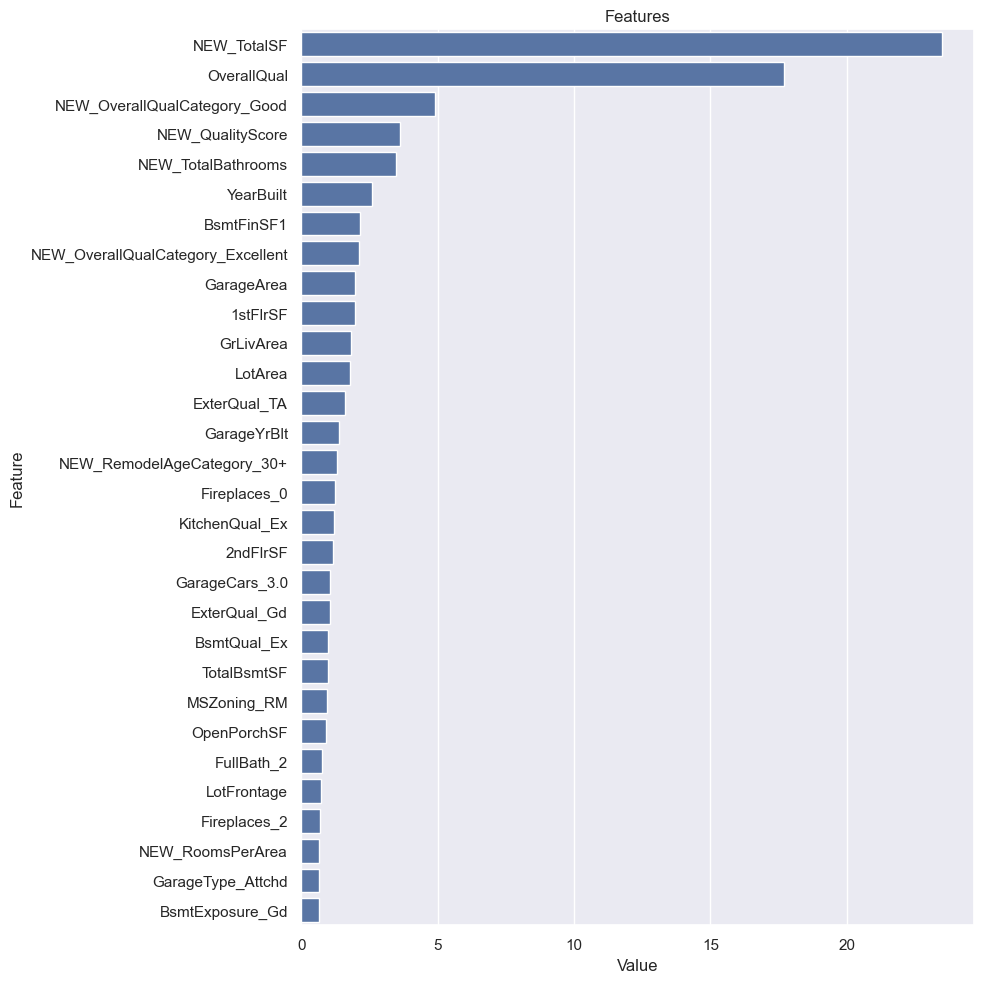

In [115]:
plot_importance(final1_model, X, num=30)

In [141]:
test["SalePrice"] = final1_model.predict(test.drop(["Id", "SalePrice"], axis=1))

In [143]:
print(test[["Id", "SalePrice"]])

        Id  SalePrice
1460  1461 131582.270
1461  1462 168078.807
1462  1463 183544.014
1463  1464 195939.160
1464  1465 178218.691
1465  1466 173543.181
1466  1467 184479.725
1467  1468 169670.792
1468  1469 183003.040
1469  1470 125539.906
1470  1471 195044.296
1471  1472  96957.362
1472  1473  98943.017
1473  1474 149465.323
1474  1475 122553.742
1475  1476 388338.953
1476  1477 260648.557
1477  1478 293824.818
1478  1479 277144.288
1479  1480 484028.007
1480  1481 341656.099
1481  1482 207047.131
1482  1483 174212.966
1483  1484 163573.266
1484  1485 188661.120
1485  1486 194687.689
1486  1487 345370.143
1487  1488 228061.091
1488  1489 208811.878
1489  1490 236952.221
1490  1491 186385.241
1491  1492  90688.244
1492  1493 180633.596
1493  1494 289115.912
1494  1495 302163.066
1495  1496 239916.734
1496  1497 188991.919
1497  1498 159835.290
1498  1499 163453.271
1499  1500 159180.772
1500  1501 186481.937
1501  1502 145101.514
1502  1503 306718.396
1503  1504 237665.102
1504  1505

In [147]:
test[["Id", "SalePrice"]].to_csv("bonus.csv", index=False)

In [ ]:
def to_analysis_num(dataframe, n_cols, bins=20, T=False, plot=False):
    if T:
        quantiles = [0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
        print(dataframe[n_cols].describe(quantiles).T)

    if plot:
        #Histogram + Density  üst üste yazdirma
        #Hist
        plt.figure(figsize=(8, 4))
        n, bins, patches = plt.hist(dataframe[n_cols], 
                                    bins=bins, density=True, 
                                    label=n_cols, edgecolor='black', 
                                    alpha=0.9, color='#c44e52')
        # Density 
        density = 1/(dataframe[n_cols].std() * (2 * np.pi)0.5) * \
                  np.exp(-(bins - dataframe[n_cols].mean())2 / (2 * dataframe[n_cols].std()**2))
        plt.plot(bins, density, color='#55a868', linewidth=1, label='Density')

        plt.title(f'Distribution of {n_cols} Variable')
        plt.xlabel(n_cols)
        plt.ylabel('Frequency / Density')
        plt.legend(loc='upper right')
        plt.show(block=True)

count     1460.000
mean    180921.196
std      79442.503
min      34900.000
25%     129975.000
50%     163000.000
75%     214000.000
max     755000.000
Name: SalePrice, dtype: float64


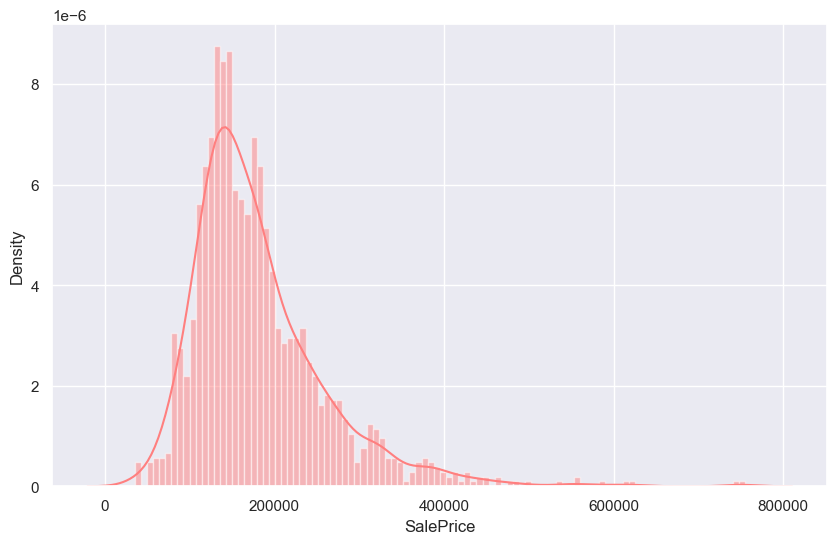

In [153]:
print(df['SalePrice'].describe().T)
plt.figure(figsize=(10, 6))
sns.distplot(df['SalePrice'], color= "#FF7F7F", bins=100, hist_kws={'alpha': 0.5});

count     1460.000
mean    180921.196
std      79442.503
min      34900.000
25%     129975.000
50%     163000.000
75%     214000.000
max     755000.000
Name: SalePrice, dtype: float64


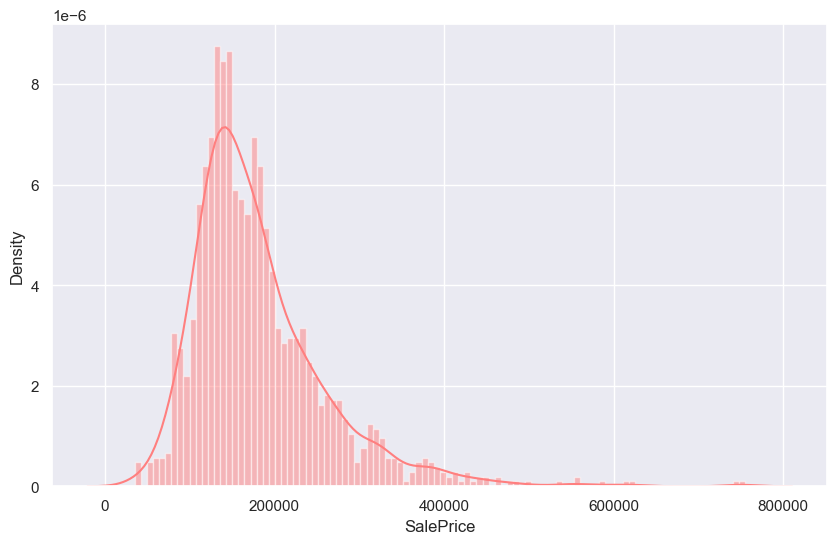

In [155]:
print(df['SalePrice'].describe())
plt.figure(figsize=(10, 6))
sns.distplot(df['SalePrice'], color= "#FF7F7F", bins=100, hist_kws={'alpha': 0.5});